<a href="https://colab.research.google.com/github/EdwinGuevarahub/BigData/blob/Modulo4/BigDataModulo4Clase3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Actividades Big Data - Modulo 4 - sesion 3
Edwin Guevara - 20241595001

1. **Selección del dataset:**
   - Escoja un conjunto de imágenes, por ejemplo, de Kaggle, con una resolución mínima de 128x128 píxeles. Estas imágenes deben contener el **objeto** que desea detectar o segmentar.
   - Tenga en cuenta que un mayor tamaño de las imágenes incrementará el tiempo de entrenamiento. Por lo tanto, si es necesario, puede reducir su resolución.

In [1]:
import locale
import os

# Configurar localización a UTF-8
os.environ["LC_ALL"] = "C.UTF-8"
os.environ["LANG"] = "C.UTF-8"
locale.setlocale(locale.LC_ALL, "C.UTF-8")

# Descargar el checkpoint preentrenado de SAM
!mkdir -p checkpoints
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth -P checkpoints/

!pip install -q 'git+https://github.com/facebookresearch/segment-anything.git'
!pip install -q jupyter_bbox_widget roboflow dataclasses-json supervision==0.23.0

# Create the necessary directories for detection and segmentation outputs.
!mkdir detection
!mkdir segmentation

%cd segmentation

# Instalar las dependencias
!pip install -e .

%cd ..

--2024-11-21 04:22:15--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_b_01ec64.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.163.189.51, 3.163.189.96, 3.163.189.14, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.163.189.51|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 375042383 (358M) [binary/octet-stream]
Saving to: ‘checkpoints/sam_vit_b_01ec64.pth’

sam_vit_b_01ec64.pt 100%[===================>] 357.67M   144MB/s    in 2.5s    

2024-11-21 04:22:18 (144 MB/s) - ‘checkpoints/sam_vit_b_01ec64.pth’ saved [375042383/375042383]

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.9/80.9 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.7/213.7 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
#Seleccion del dataset

# Install necessary libraries
!pip install kaggle

# Download the dataset from Kaggle (replace with your actual dataset)
!mkdir ~/.kaggle
!touch ~/.kaggle/kaggle.json

# Insert your Kaggle API token here
# (instructions on how to obtain this token can be found on the Kaggle website)
api_token = {"username":"edwinsguevarav","key":"b61d4bd06ae50b83b1a2a8fc9ad6c3a6"}
import json
with open('/root/.kaggle/kaggle.json', 'w') as file:
    json.dump(api_token, file)
!chmod 600 ~/.kaggle/kaggle.json

# Example: Downloading the 'fruits-360' dataset
!kaggle datasets download -d moltean/fruits
!unzip fruits.zip -d fruits-360

# Example: Importing and resizing images
import os
import cv2
from PIL import Image

def resize_images(input_dir, output_dir, target_size=(128, 128)):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for root, _, files in os.walk(input_dir):
        for file in files:
            if file.endswith(('.jpg', '.jpeg', '.png')):
                img_path = os.path.join(root, file)
                try:
                    img = Image.open(img_path)
                    img = img.resize(target_size, Image.Resampling.LANCZOS) # High-quality downsampling
                    img.save(os.path.join(output_dir, file))
                except Exception as e:
                    print(f"Error processing image {img_path}: {e}")


# Example Usage (adjust to your dataset directory)
input_image_dir = "fruits-360/Training"
output_image_dir = "images"

resize_images(input_image_dir, output_image_dir)

Streaming output truncated to the last 5000 lines.
  inflating: fruits-360/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r0_96.jpg  
  inflating: fruits-360/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r0_98.jpg  
  inflating: fruits-360/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_0.jpg  
  inflating: fruits-360/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_10.jpg  
  inflating: fruits-360/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_100.jpg  
  inflating: fruits-360/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_102.jpg  
  inflating: fruits-360/fruits-360_dataset_original-size/fruits-360-original-size/Training/apple_red_yellow_1/r1_104.jpg  
  inflating: fruits-360/fruits-360_dataset_original-size/fruits-360-original-size/Training/ap

2. **Generación de etiquetas para detección:**
   - Utilice **Grounding DINO**, que permite localizar un objeto a partir de una entrada textual, para generar las etiquetas en formato YOLO que identifiquen la ubicación del **objeto** seleccionado.



In [3]:
# Generacion de etiquetas

!pip install torch torchvision --quiet

# Clonar el repositorio de Grounding DINO
!git clone https://github.com/IDEA-Research/GroundingDINO.git

# Cambiar al directorio del repositorio
%cd GroundingDINO

# Instalar las dependencias
!pip install -e .

!pip install supervision

%cd ..
!mkdir weights
!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth -P weights

#!pwd
#!dir

Cloning into 'GroundingDINO'...
remote: Enumerating objects: 463, done.
remote: Counting objects: 100% (240/240), done.
remote: Compressing objects: 100% (105/105), done.
remote: Total 463 (delta 175), reused 135 (delta 135), pack-reused 223 (from 1)
Receiving objects: 100% (463/463), 12.87 MiB | 25.40 MiB/s, done.
Resolving deltas: 100% (241/241), done.
/content/GroundingDINO
Obtaining file:///content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.8/46.8 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.4/48.4 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 42.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 256.2/256.2 kB 19.8 MB/s eta 0:00:00
  Running setup.py develop for groundingdino
/content


In [4]:
import os
import sys
import torch
import supervision as sv

sys.path.append('/content/GroundingDINO')

# Intenta importar de nuevo
try:
    from groundingdino.util.inference import load_model, load_image, predict, annotate
    print("Grounding DINO importado exitosamente.")
except ImportError as e:
    print("Error al importar Grounding DINO:")
    print(e)

Grounding DINO importado exitosamente.


final text_encoder_type: bert-base-uncased


The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

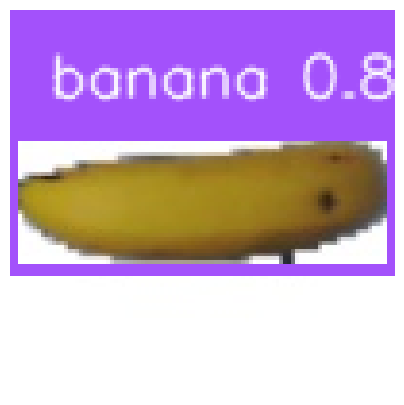

Etiquetas generadas para r_154_100.jpg


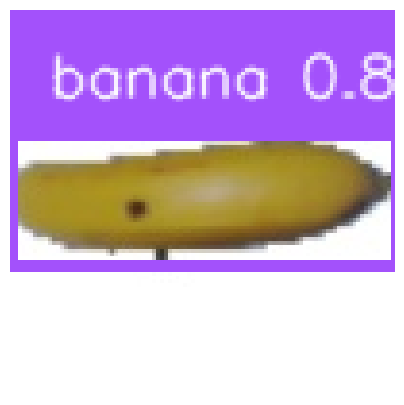

Etiquetas generadas para r_211_100.jpg


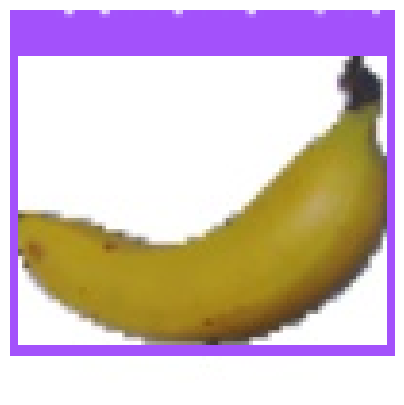

Etiquetas generadas para 267_100.jpg


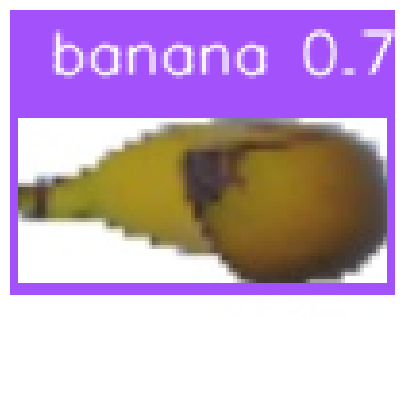

Etiquetas generadas para r_102_100.jpg


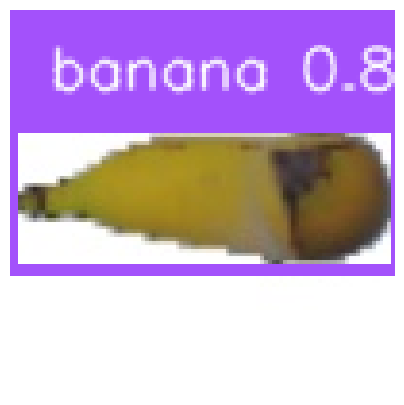

Etiquetas generadas para r_90_100.jpg


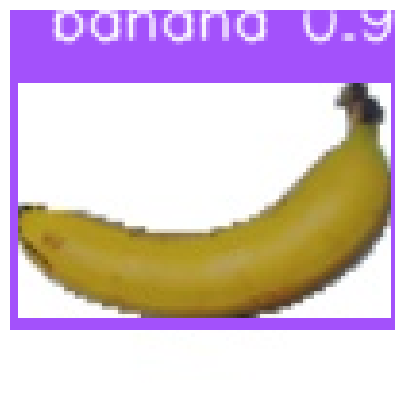

Etiquetas generadas para 243_100.jpg


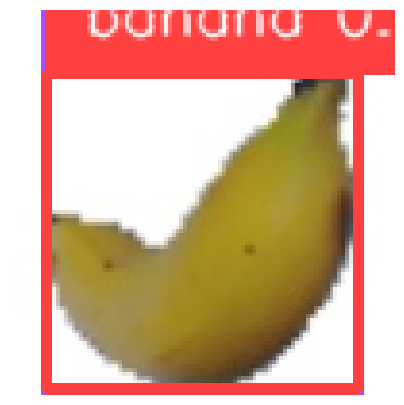

Etiquetas generadas para 6_100.jpg


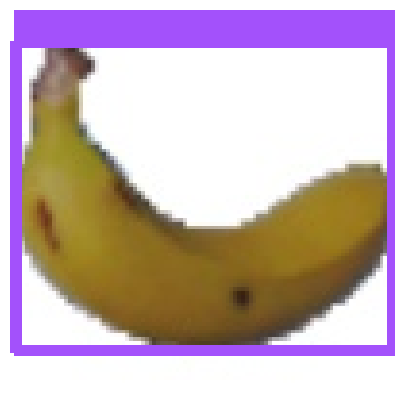

Etiquetas generadas para 61_100.jpg


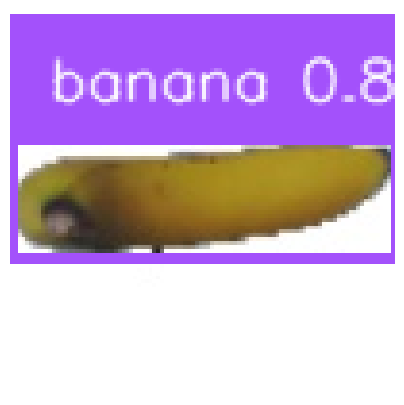

Etiquetas generadas para r_11_100.jpg


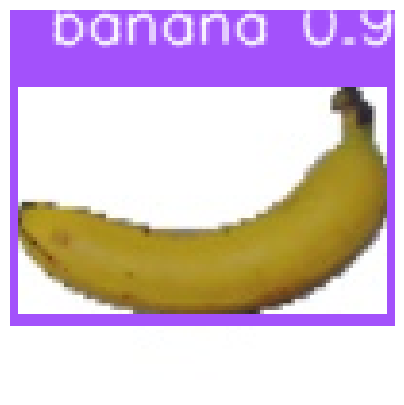

Etiquetas generadas para 233_100.jpg


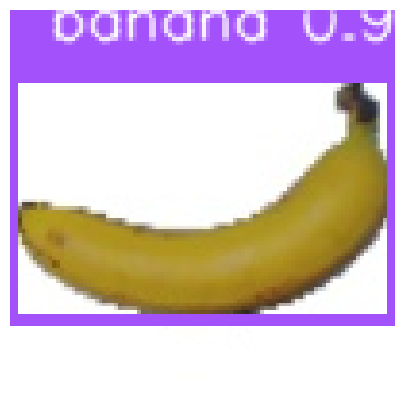

Etiquetas generadas para 240_100.jpg


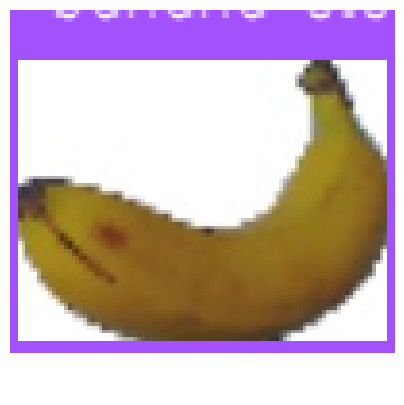

Etiquetas generadas para 199_100.jpg


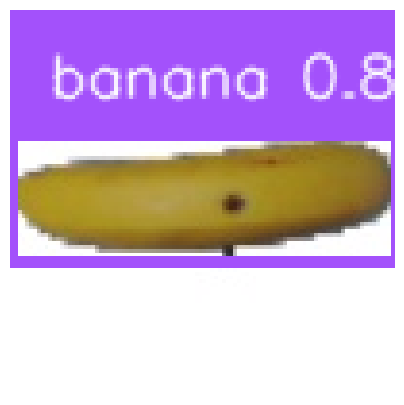

Etiquetas generadas para r_185_100.jpg


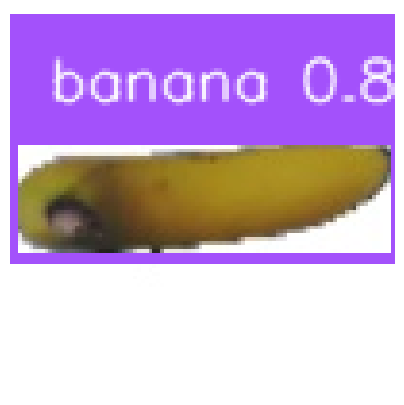

Etiquetas generadas para r_9_100.jpg


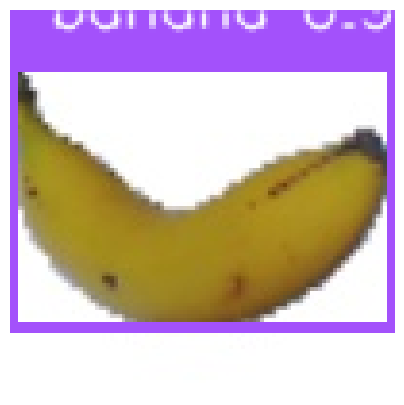

Etiquetas generadas para 136_100.jpg


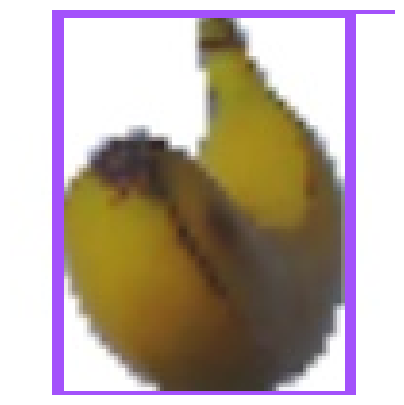

Etiquetas generadas para 175_100.jpg


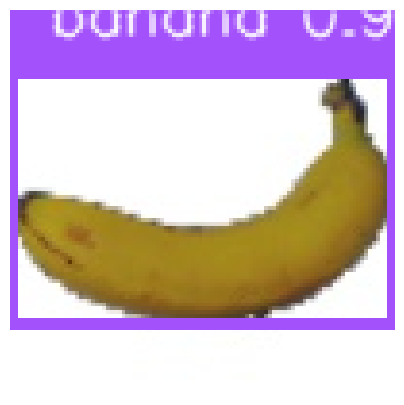

Etiquetas generadas para 218_100.jpg


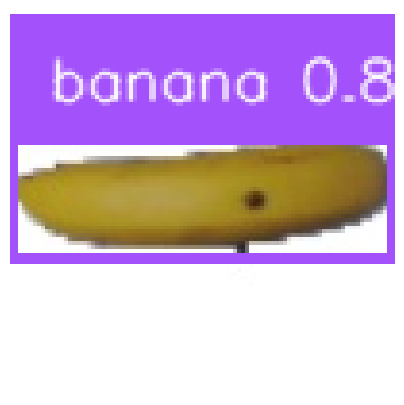

Etiquetas generadas para r_178_100.jpg


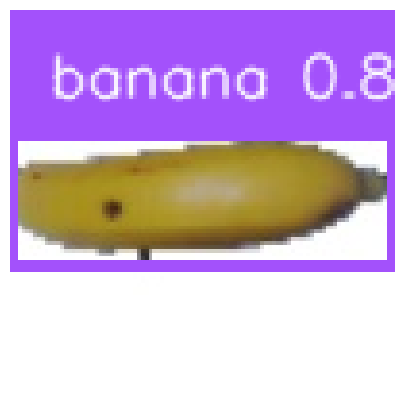

Etiquetas generadas para r_217_100.jpg


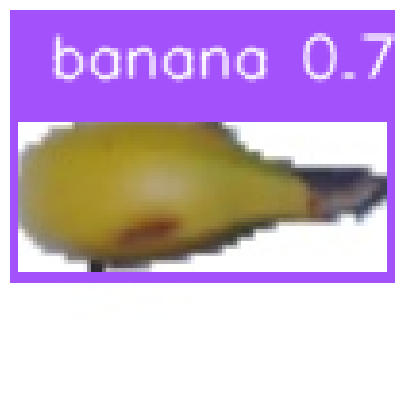

Etiquetas generadas para r_265_100.jpg


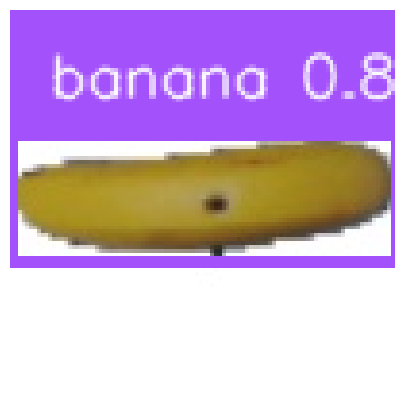

Etiquetas generadas para r_190_100.jpg


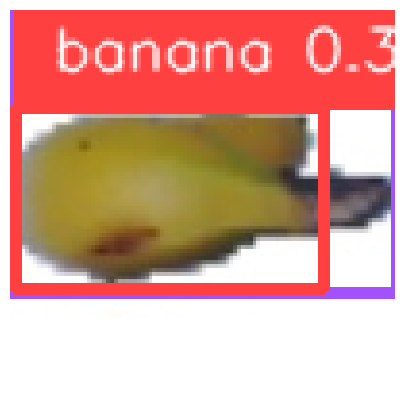

Etiquetas generadas para r_272_100.jpg


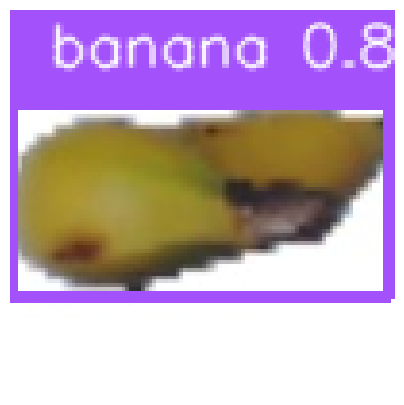

Etiquetas generadas para r_281_100.jpg


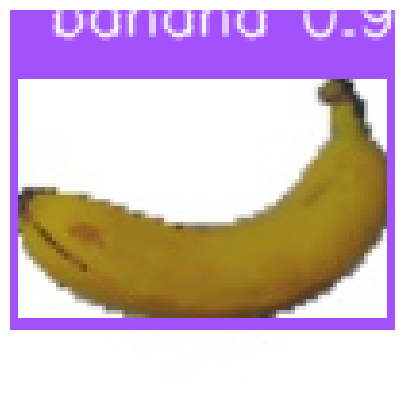

Etiquetas generadas para 213_100.jpg


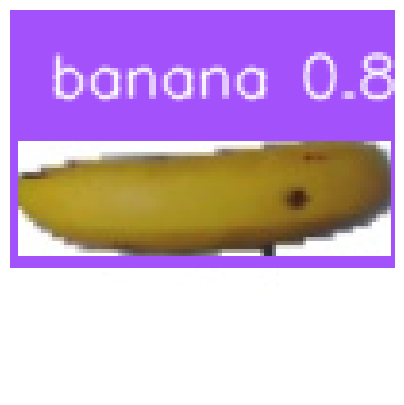

Etiquetas generadas para r_165_100.jpg


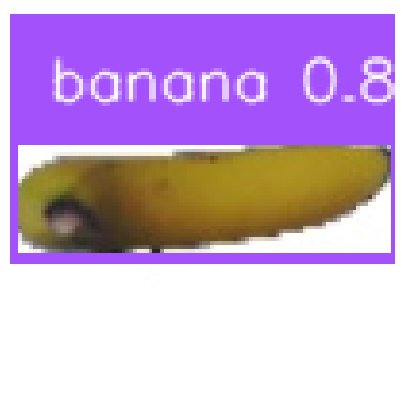

Etiquetas generadas para r_311_100.jpg


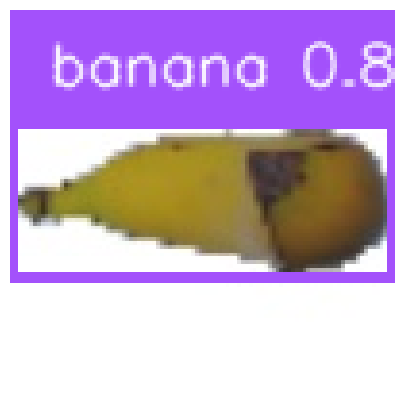

Etiquetas generadas para r_94_100.jpg


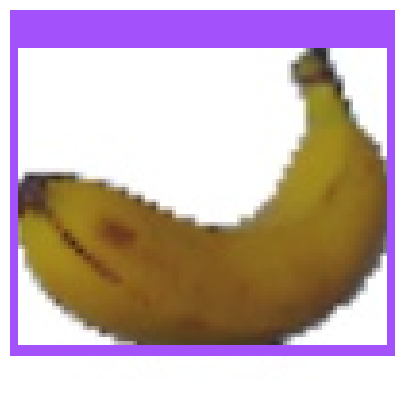

Etiquetas generadas para 196_100.jpg


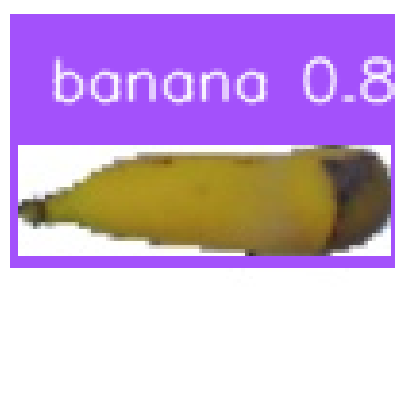

Etiquetas generadas para r_78_100.jpg


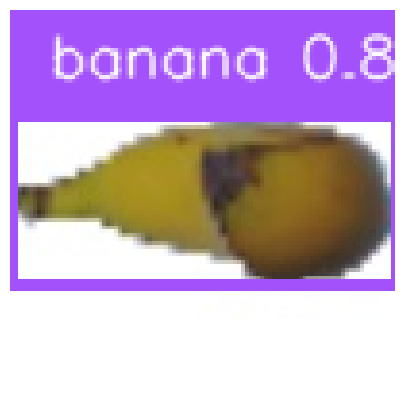

Etiquetas generadas para r_100_100.jpg


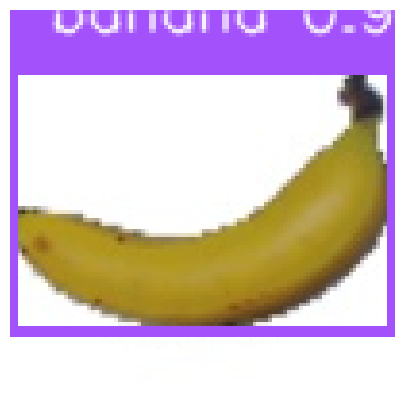

Etiquetas generadas para 254_100.jpg


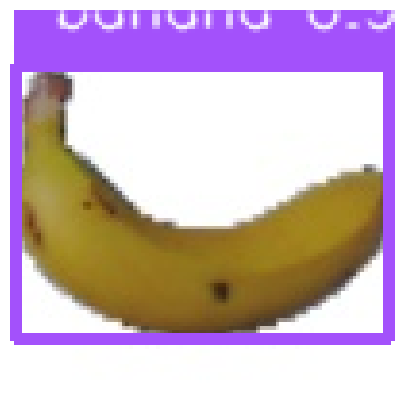

Etiquetas generadas para 68_100.jpg


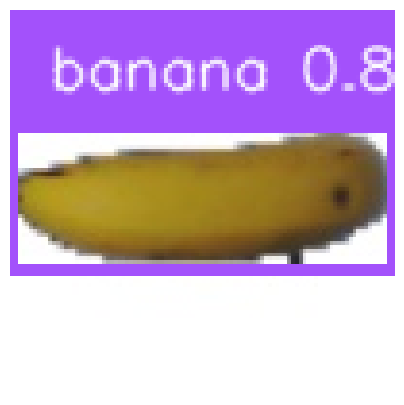

Etiquetas generadas para r_148_100.jpg


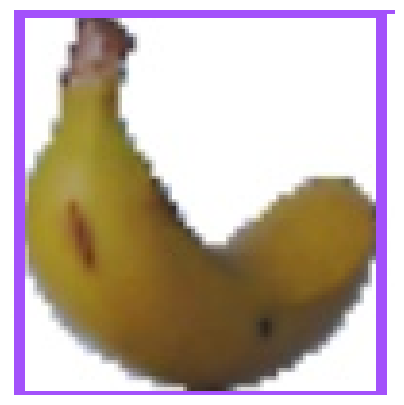

Etiquetas generadas para 48_100.jpg


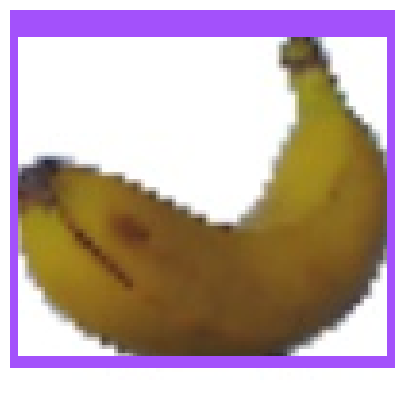

Etiquetas generadas para 191_100.jpg


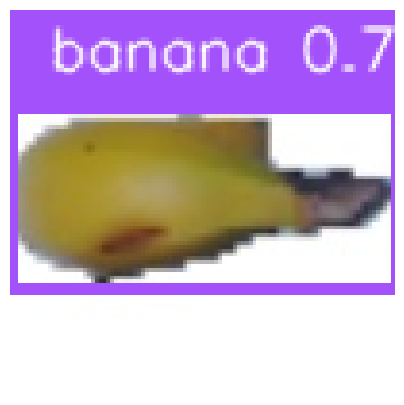

Etiquetas generadas para r_269_100.jpg


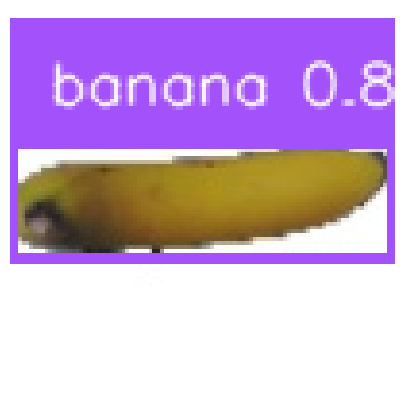

Etiquetas generadas para r_318_100.jpg


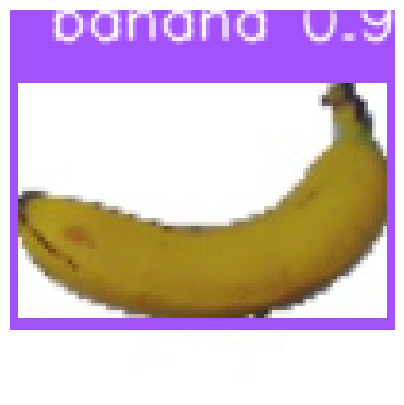

Etiquetas generadas para 219_100.jpg


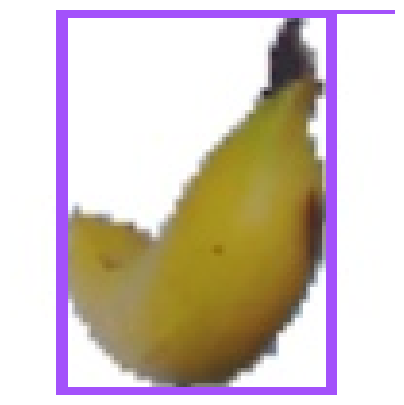

Etiquetas generadas para 10_100.jpg


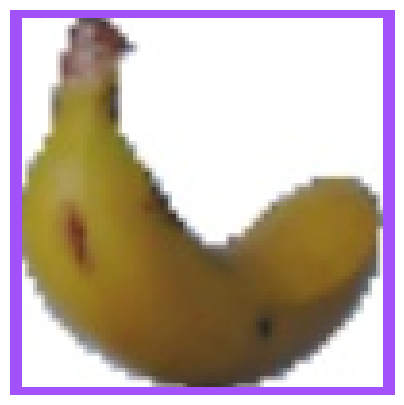

Etiquetas generadas para 49_100.jpg


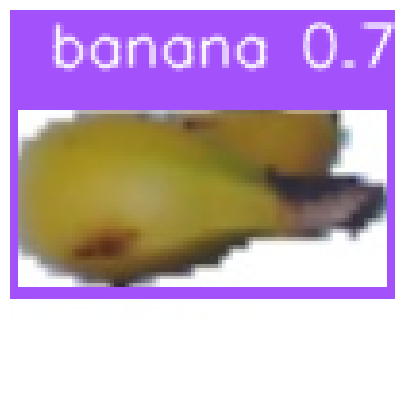

Etiquetas generadas para r_275_100.jpg


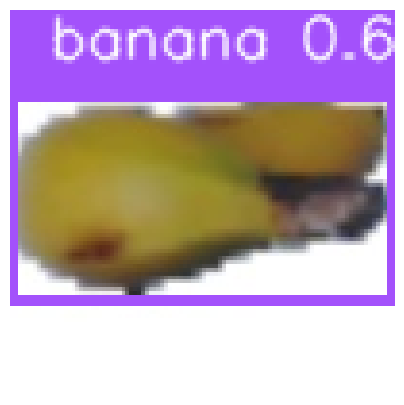

Etiquetas generadas para r_278_100.jpg


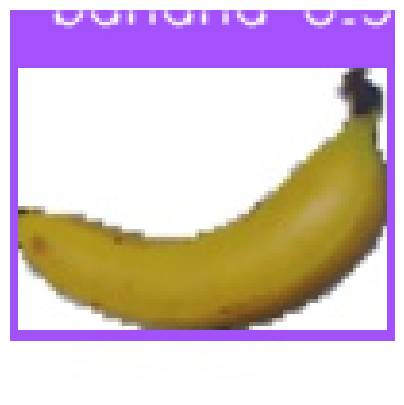

Etiquetas generadas para 258_100.jpg


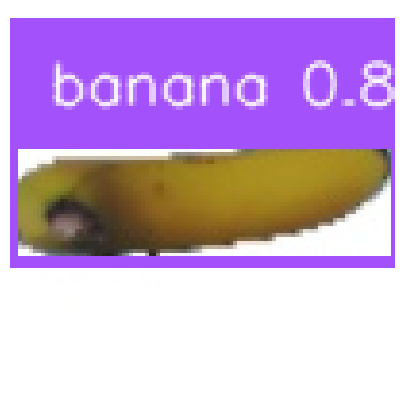

Etiquetas generadas para r_8_100.jpg


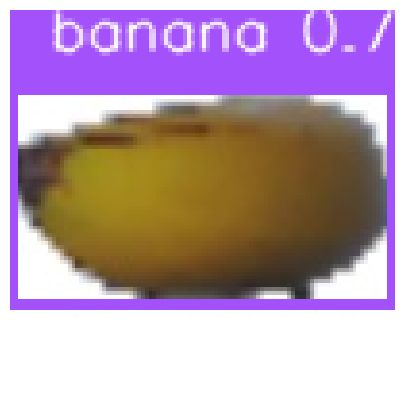

Etiquetas generadas para r_117_100.jpg


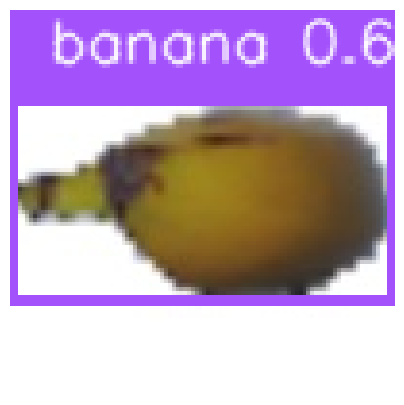

Etiquetas generadas para r_109_100.jpg


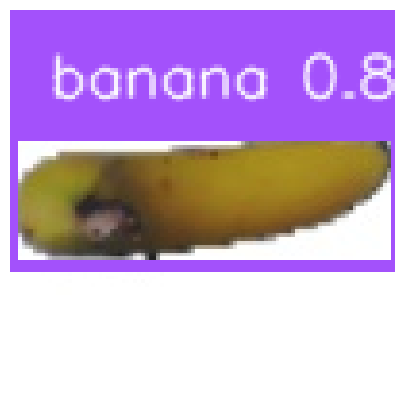

Etiquetas generadas para r_303_100.jpg


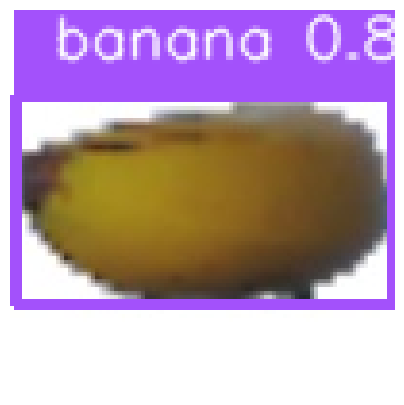

Etiquetas generadas para r_118_100.jpg


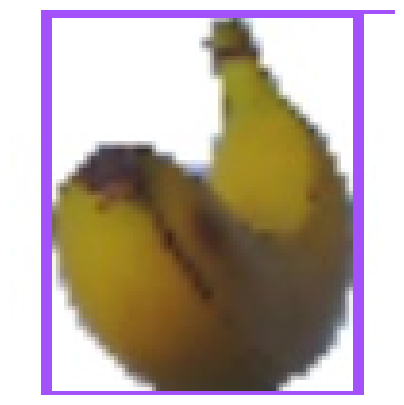

Etiquetas generadas para 177_100.jpg


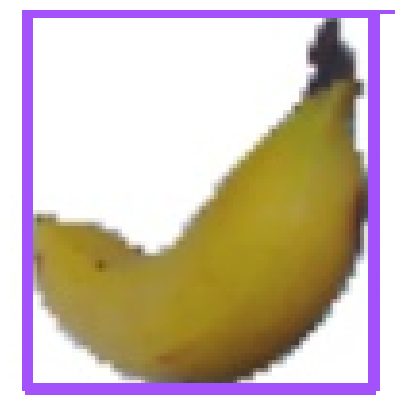

Etiquetas generadas para 284_100.jpg


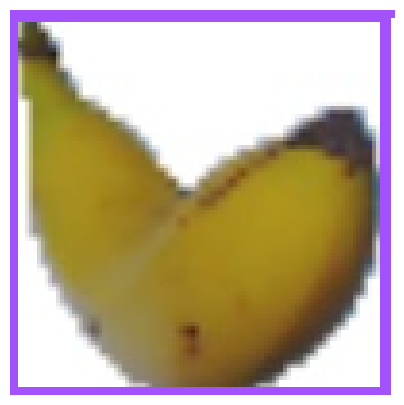

Etiquetas generadas para 149_100.jpg


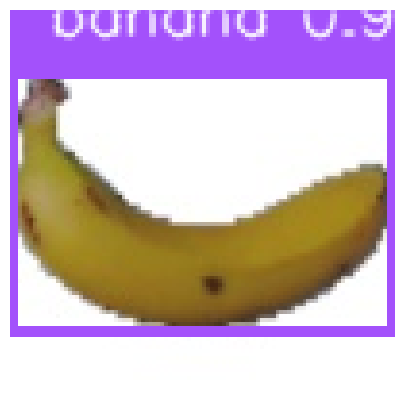

Etiquetas generadas para 72_100.jpg


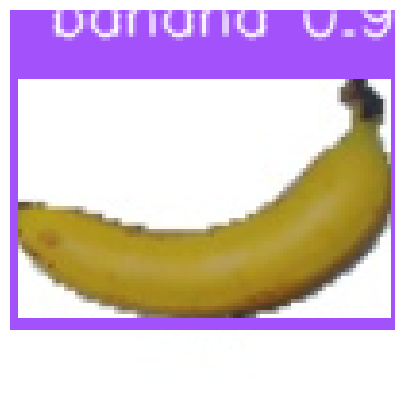

Etiquetas generadas para 245_100.jpg


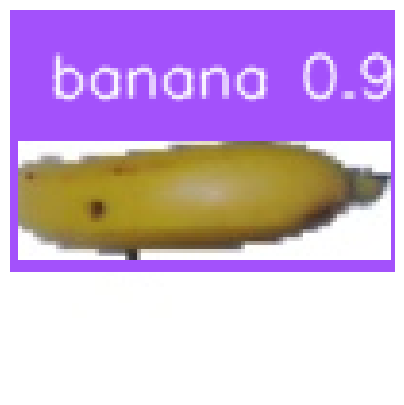

Etiquetas generadas para r_221_100.jpg


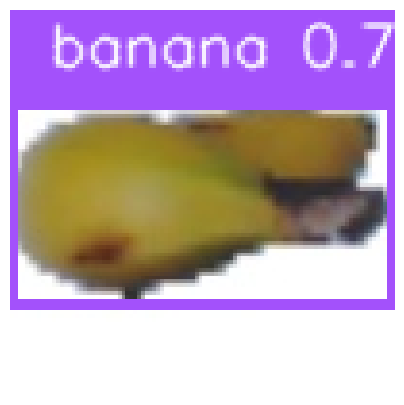

Etiquetas generadas para r_277_100.jpg


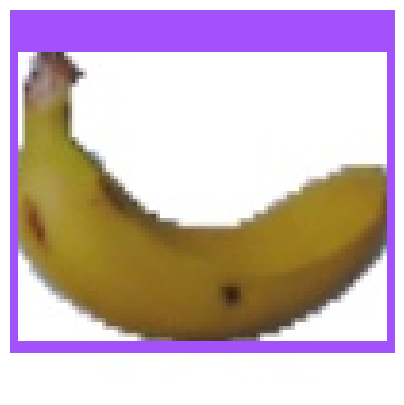

Etiquetas generadas para 64_100.jpg


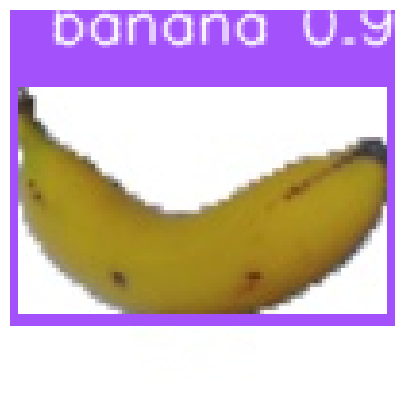

Etiquetas generadas para 131_100.jpg


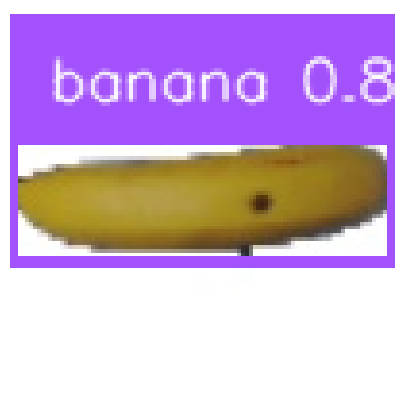

Etiquetas generadas para r_176_100.jpg


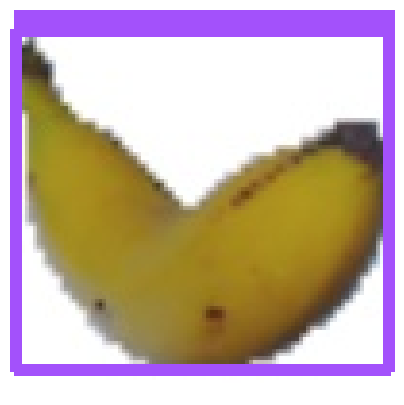

Etiquetas generadas para 144_100.jpg


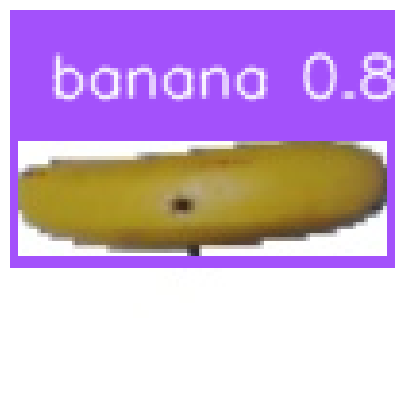

Etiquetas generadas para r_200_100.jpg


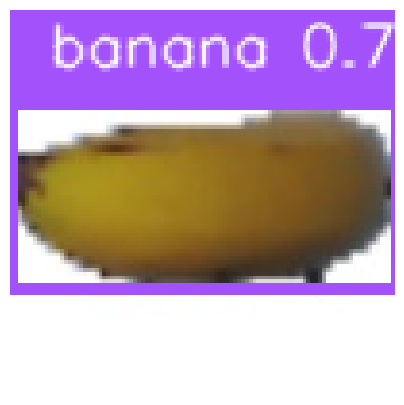

Etiquetas generadas para r_126_100.jpg


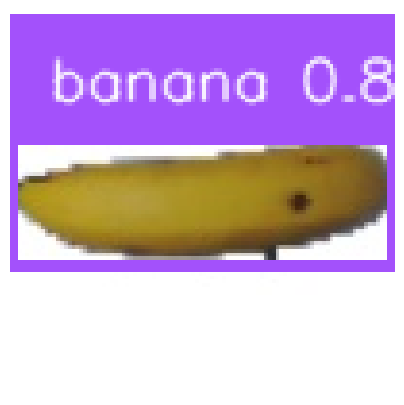

Etiquetas generadas para r_164_100.jpg


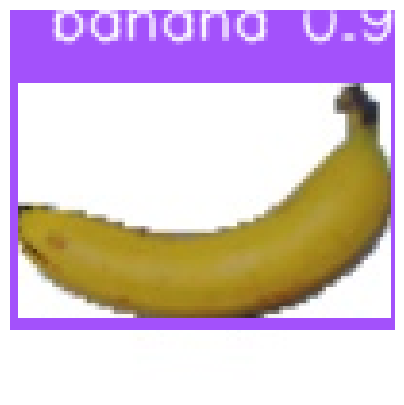

Etiquetas generadas para 237_100.jpg


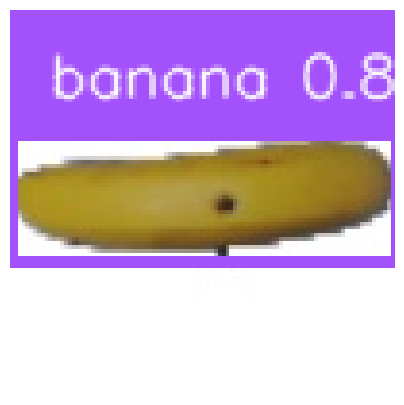

Etiquetas generadas para r_187_100.jpg


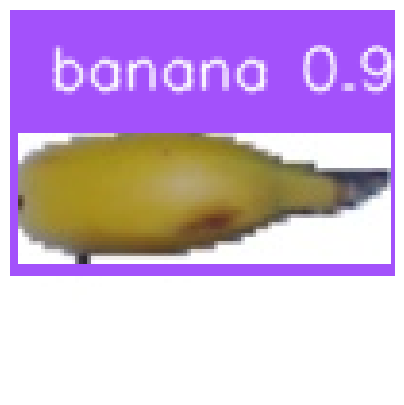

Etiquetas generadas para r_249_100.jpg


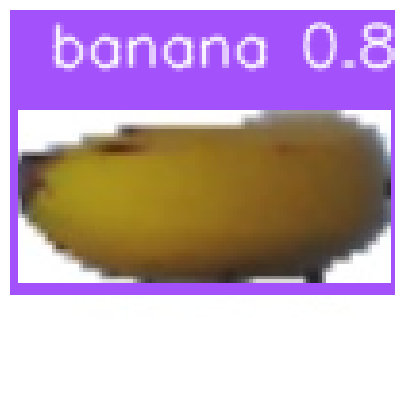

Etiquetas generadas para r_125_100.jpg


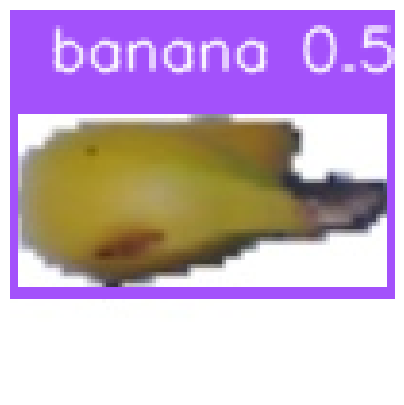

Etiquetas generadas para r_271_100.jpg


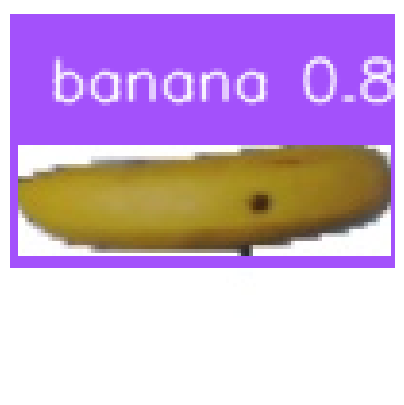

Etiquetas generadas para r_177_100.jpg


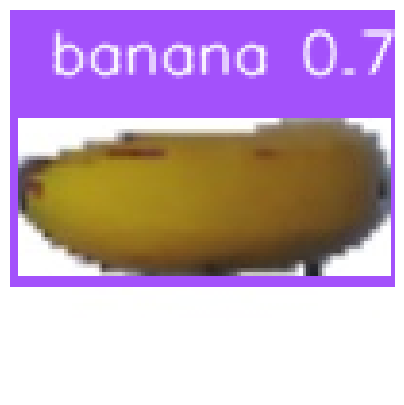

Etiquetas generadas para r_130_100.jpg


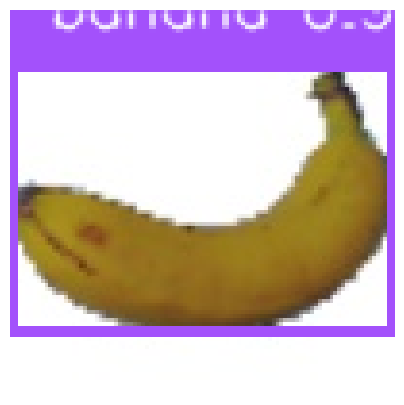

Etiquetas generadas para 207_100.jpg


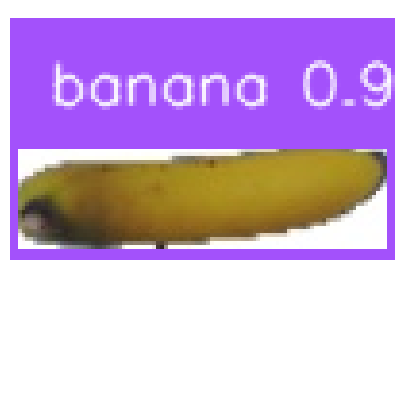

Etiquetas generadas para r_20_100.jpg


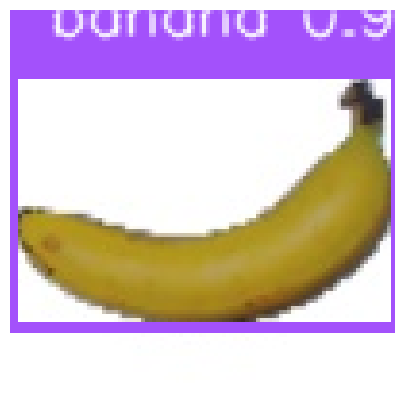

Etiquetas generadas para 247_100.jpg


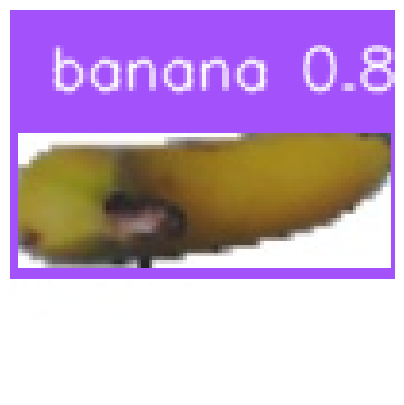

Etiquetas generadas para r_296_100.jpg


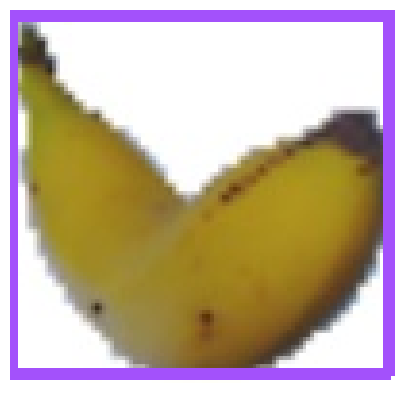

Etiquetas generadas para 146_100.jpg


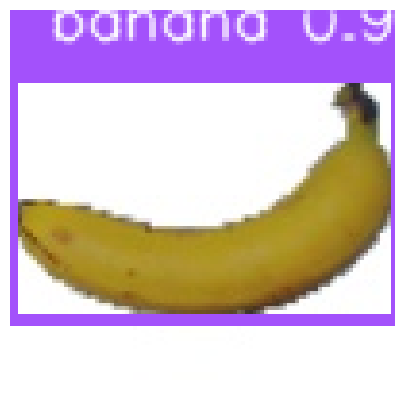

Etiquetas generadas para 232_100.jpg


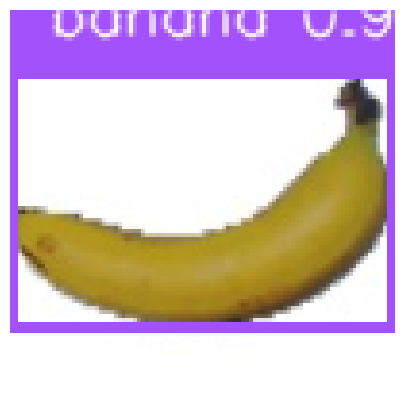

Etiquetas generadas para 248_100.jpg


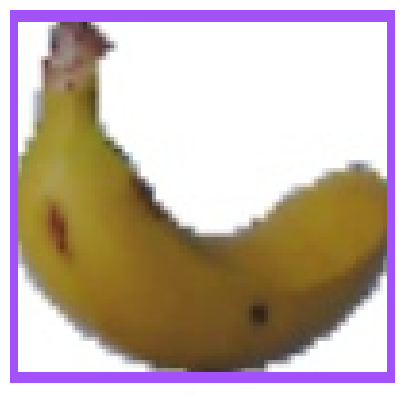

Etiquetas generadas para 54_100.jpg


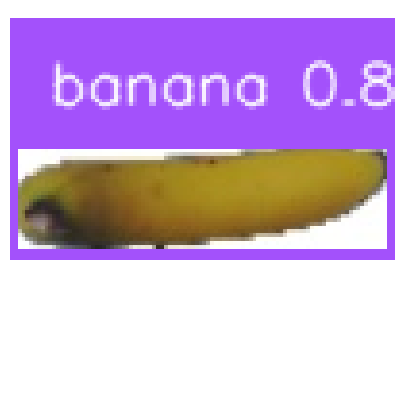

Etiquetas generadas para r_17_100.jpg


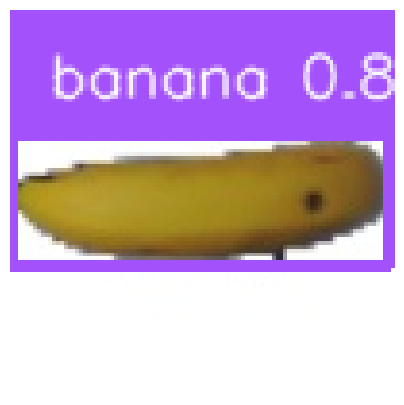

Etiquetas generadas para r_158_100.jpg


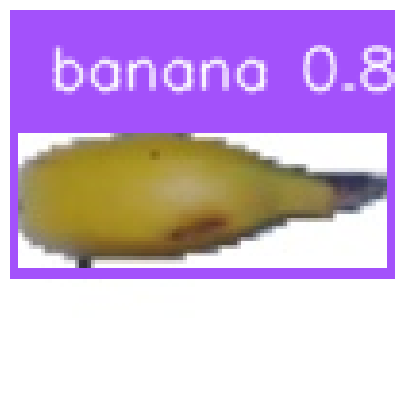

Etiquetas generadas para r_252_100.jpg


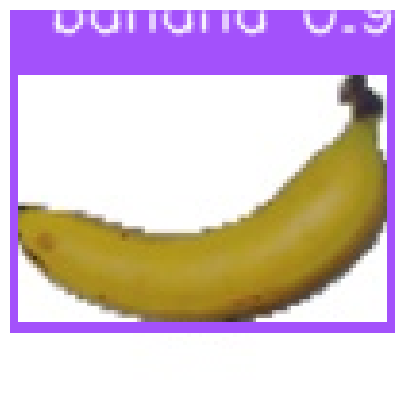

Etiquetas generadas para 252_100.jpg


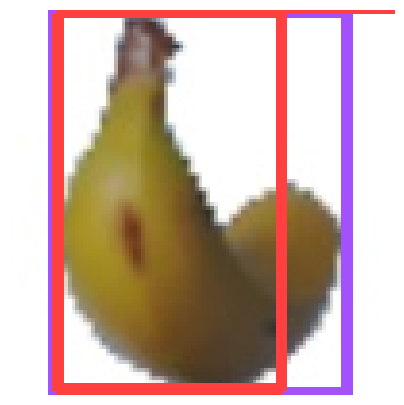

Etiquetas generadas para 40_100.jpg


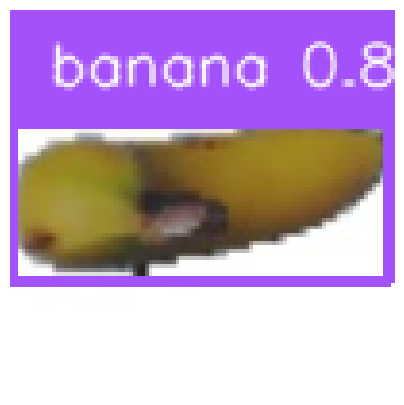

Etiquetas generadas para r_291_100.jpg


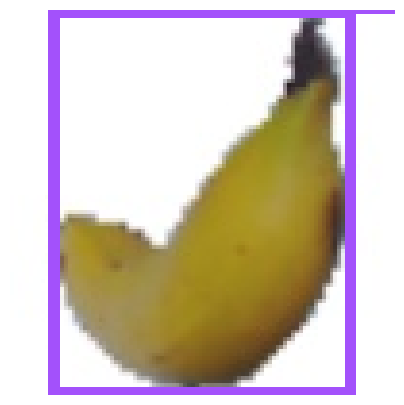

Etiquetas generadas para 290_100.jpg


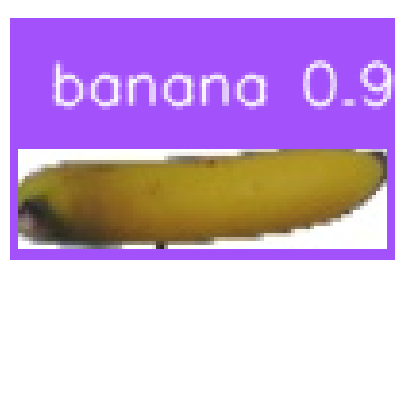

Etiquetas generadas para r_22_100.jpg


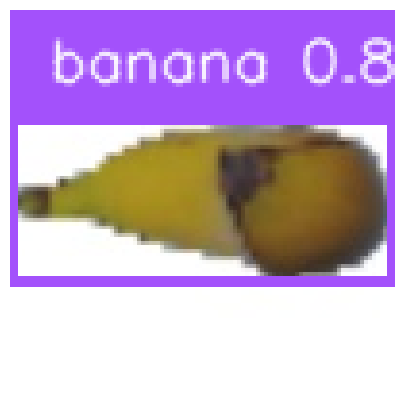

Etiquetas generadas para r_98_100.jpg


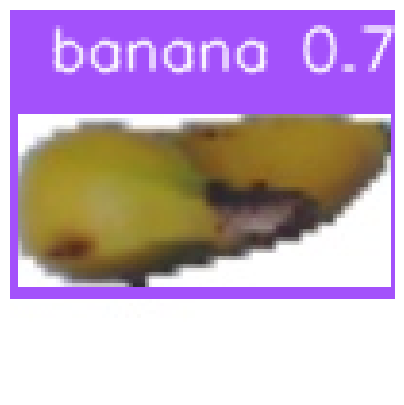

Etiquetas generadas para r_283_100.jpg


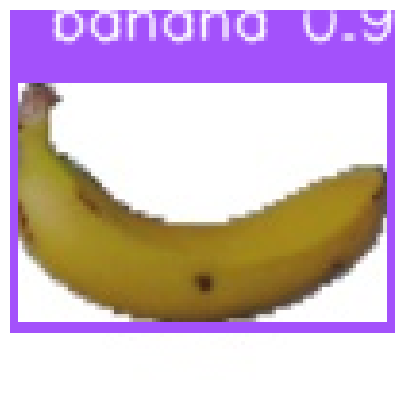

Etiquetas generadas para 75_100.jpg


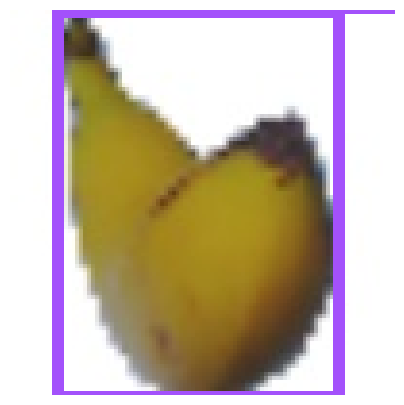

Etiquetas generadas para 156_100.jpg


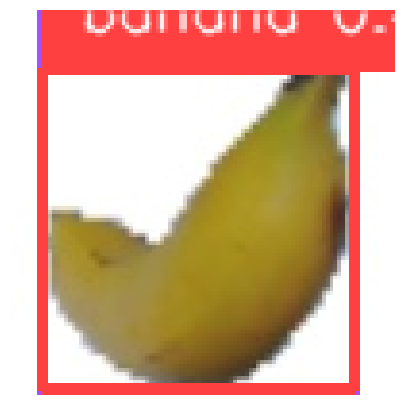

Etiquetas generadas para 289_100.jpg


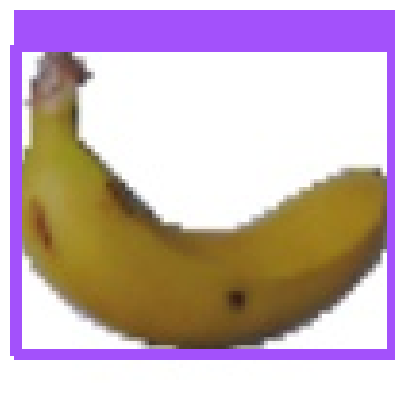

Etiquetas generadas para 62_100.jpg


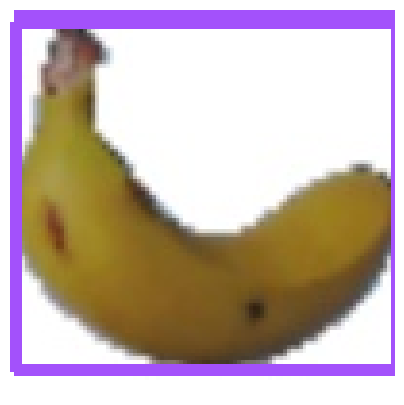

Etiquetas generadas para 56_100.jpg


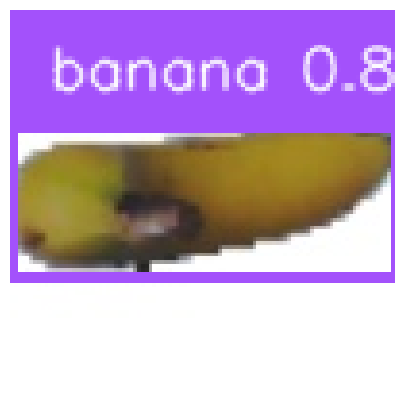

Etiquetas generadas para r_294_100.jpg


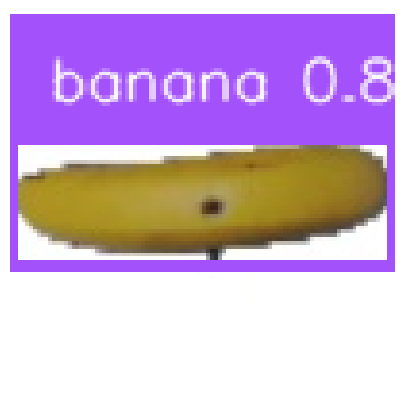

Etiquetas generadas para r_191_100.jpg


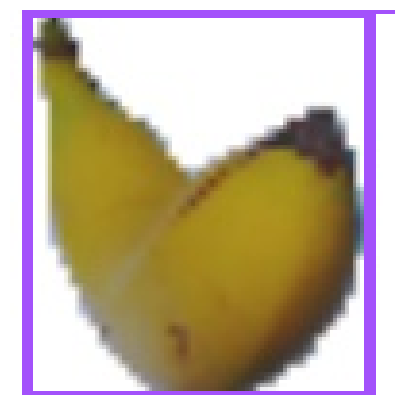

Etiquetas generadas para 152_100.jpg


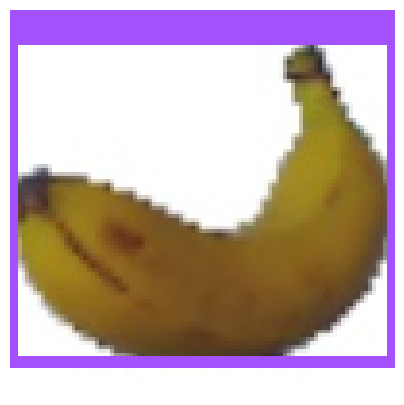

Etiquetas generadas para 193_100.jpg


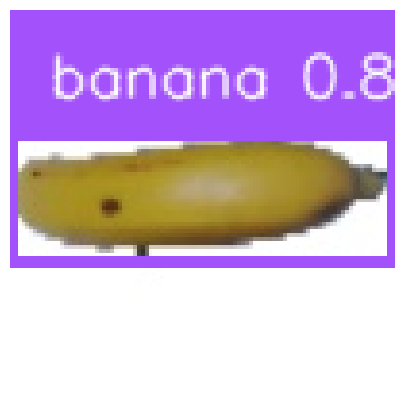

Etiquetas generadas para r_218_100.jpg


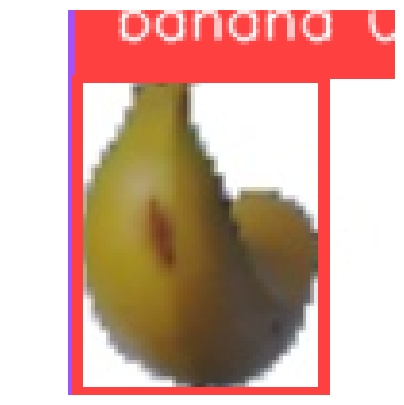

Etiquetas generadas para 35_100.jpg


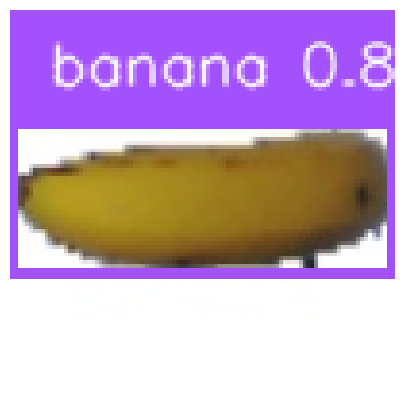

Etiquetas generadas para r_141_100.jpg


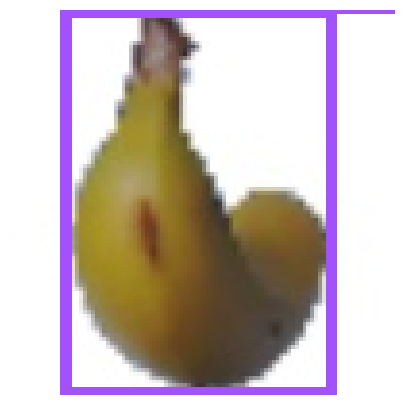

Etiquetas generadas para 323_100.jpg


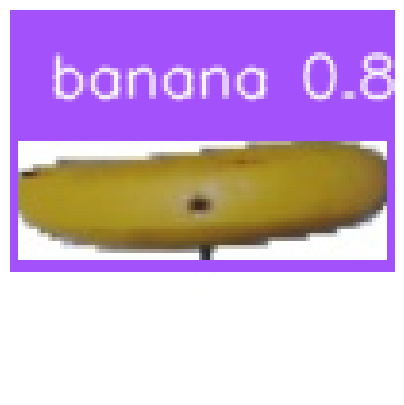

Etiquetas generadas para r_195_100.jpg


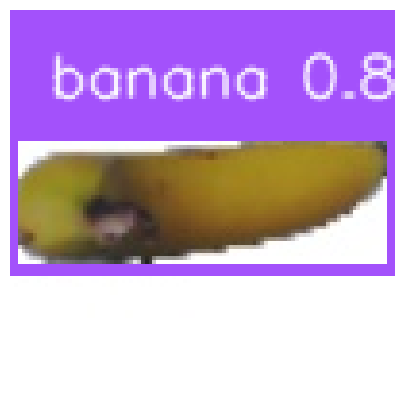

Etiquetas generadas para r_300_100.jpg


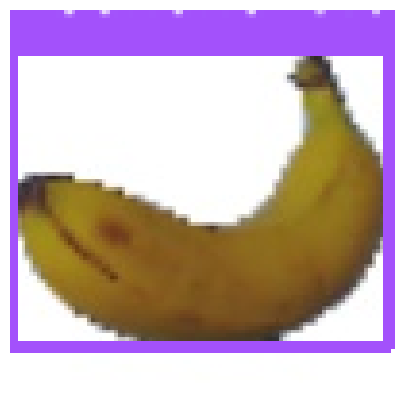

Etiquetas generadas para 197_100.jpg


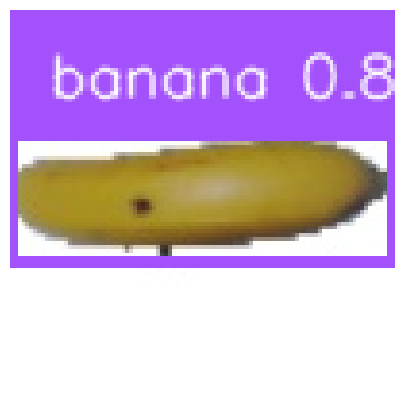

Etiquetas generadas para r_210_100.jpg


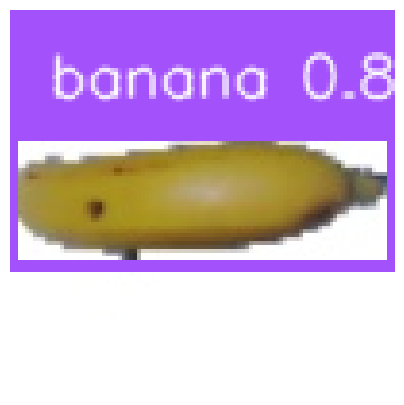

Etiquetas generadas para r_222_100.jpg


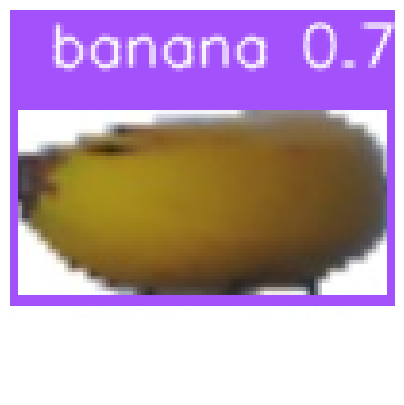

Etiquetas generadas para r_121_100.jpg


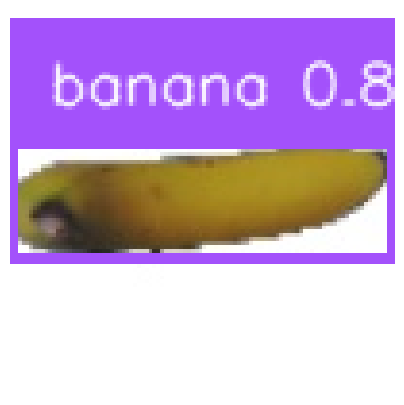

Etiquetas generadas para r_13_100.jpg


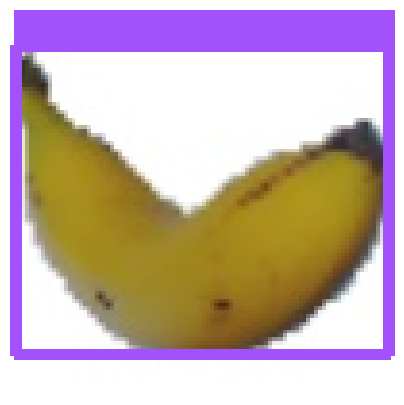

Etiquetas generadas para 141_100.jpg


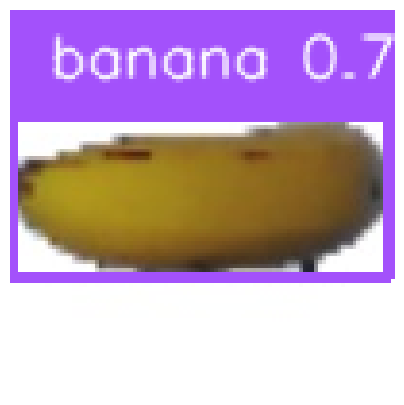

Etiquetas generadas para r_133_100.jpg


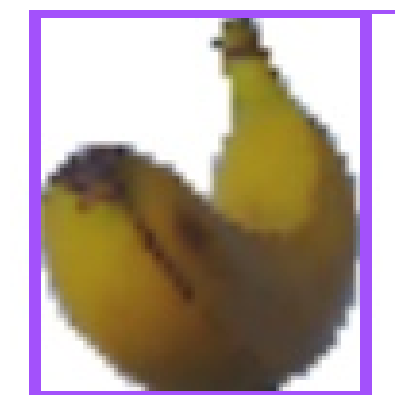

Etiquetas generadas para 179_100.jpg


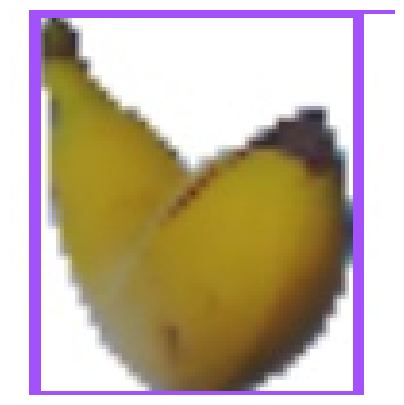

Etiquetas generadas para 153_100.jpg


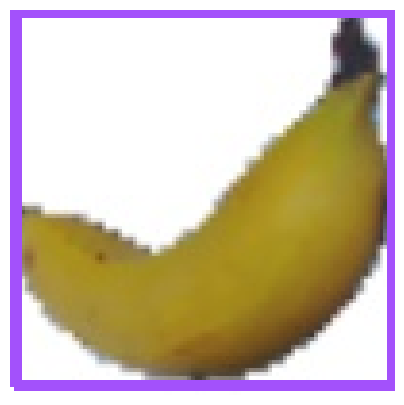

Etiquetas generadas para 0_100.jpg


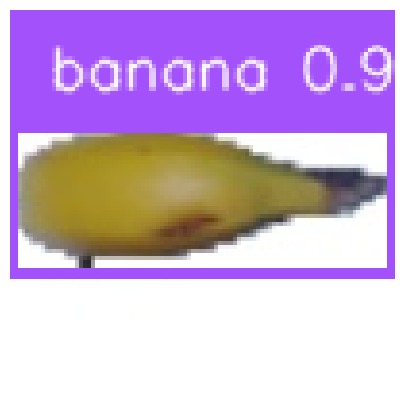

Etiquetas generadas para r_255_100.jpg


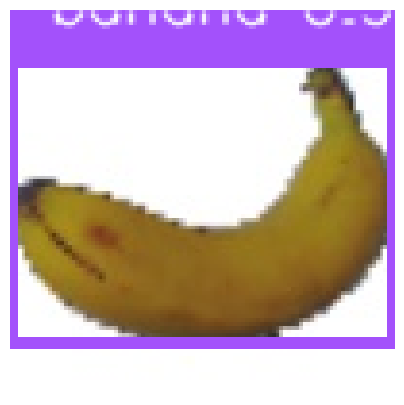

Etiquetas generadas para 202_100.jpg


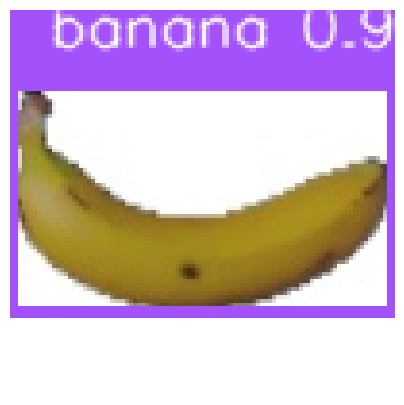

Etiquetas generadas para 84_100.jpg


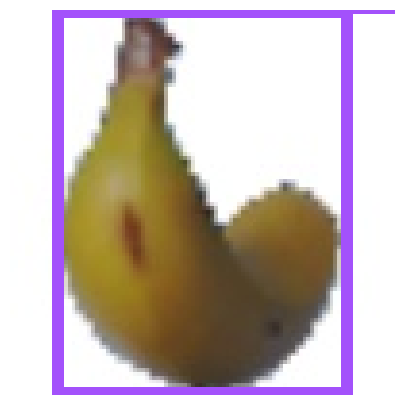

Etiquetas generadas para 326_100.jpg


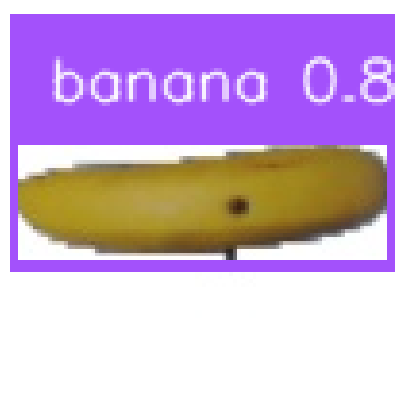

Etiquetas generadas para r_183_100.jpg


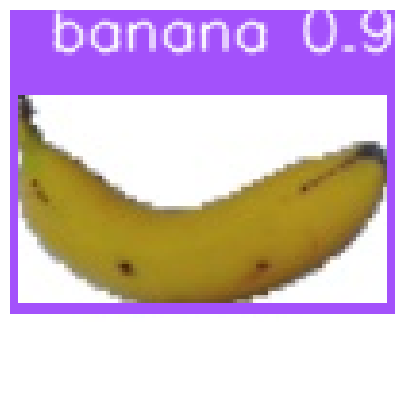

Etiquetas generadas para 124_100.jpg


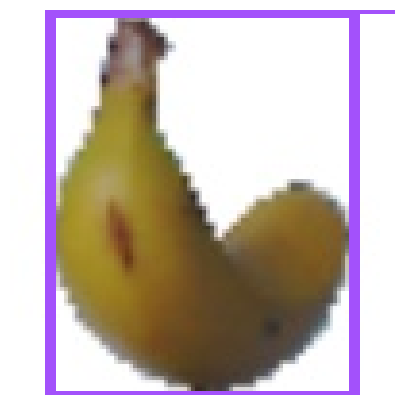

Etiquetas generadas para 327_100.jpg


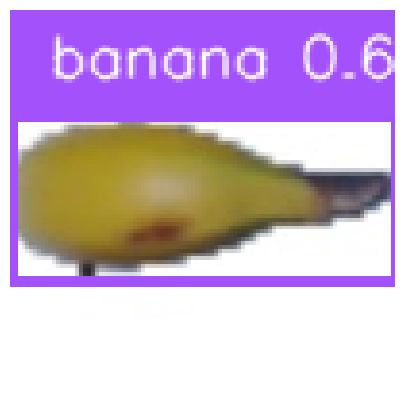

Etiquetas generadas para r_262_100.jpg


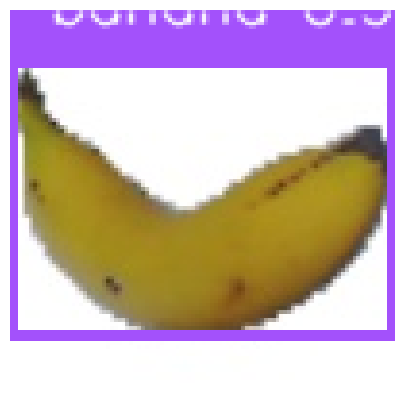

Etiquetas generadas para 137_100.jpg


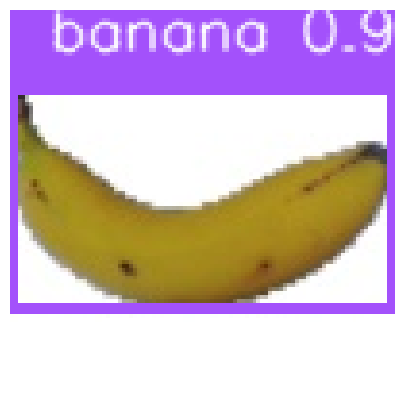

Etiquetas generadas para 123_100.jpg


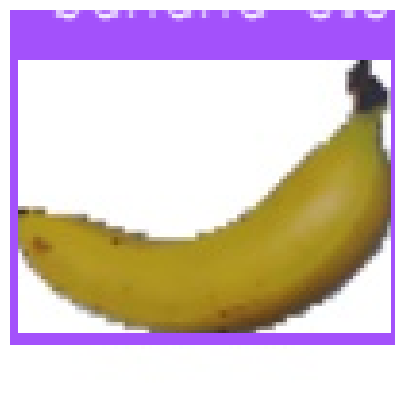

Etiquetas generadas para 261_100.jpg


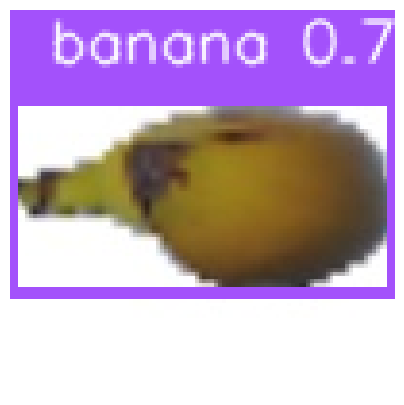

Etiquetas generadas para r_107_100.jpg


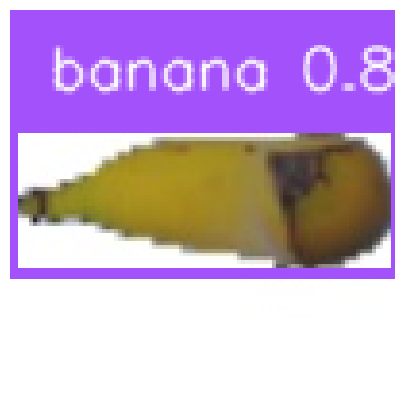

Etiquetas generadas para r_91_100.jpg


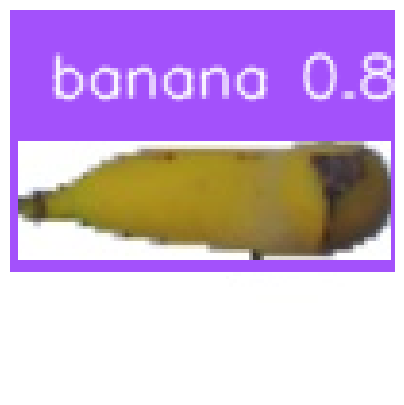

Etiquetas generadas para r_81_100.jpg


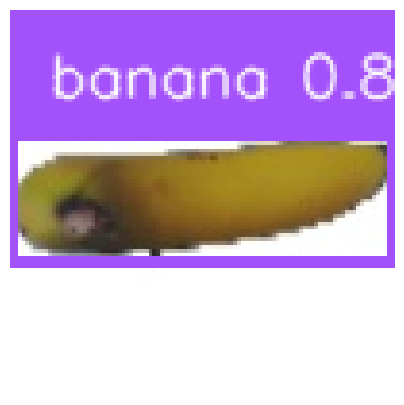

Etiquetas generadas para r_6_100.jpg


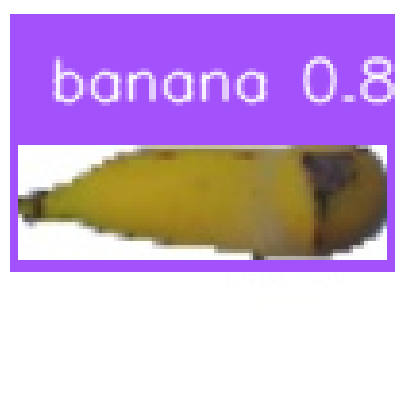

Etiquetas generadas para r_83_100.jpg


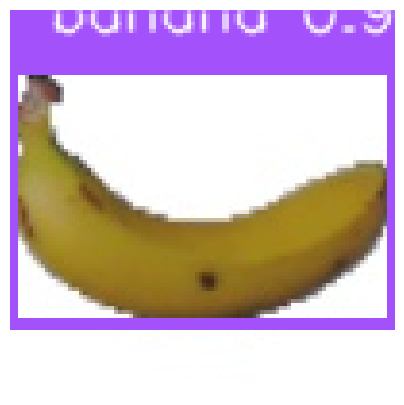

Etiquetas generadas para 74_100.jpg


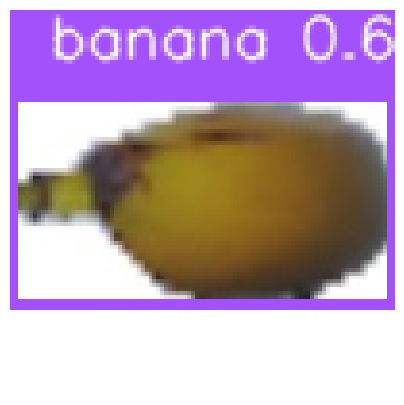

Etiquetas generadas para r_110_100.jpg


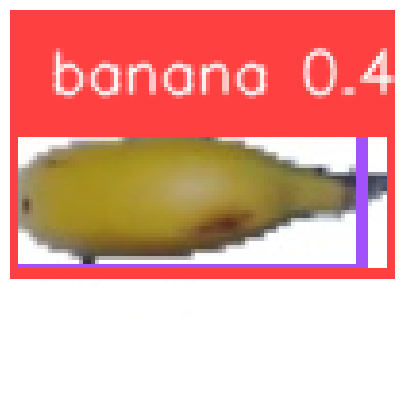

Etiquetas generadas para r_247_100.jpg


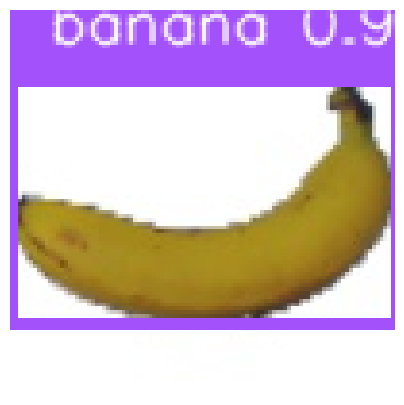

Etiquetas generadas para 223_100.jpg


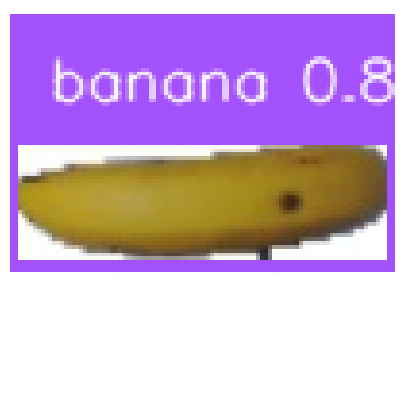

Etiquetas generadas para r_167_100.jpg


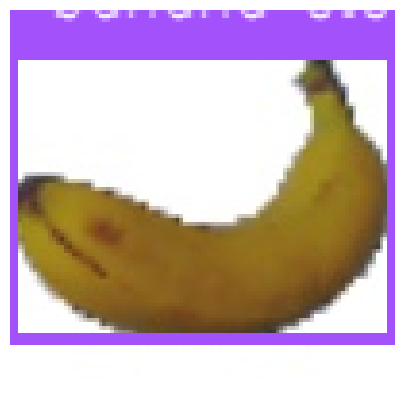

Etiquetas generadas para 200_100.jpg


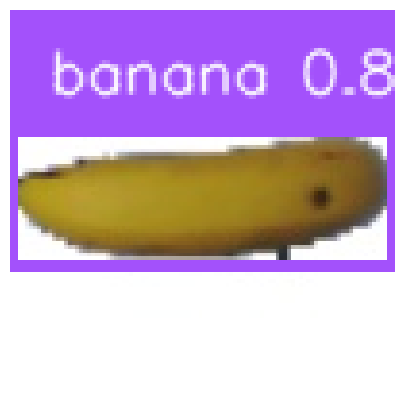

Etiquetas generadas para r_156_100.jpg


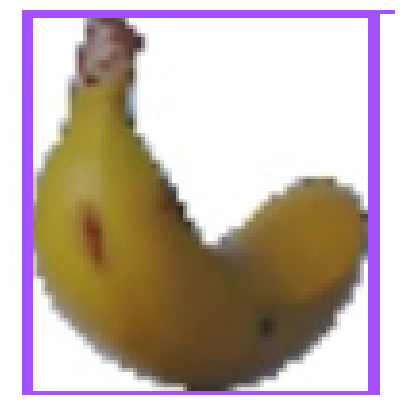

Etiquetas generadas para 46_100.jpg


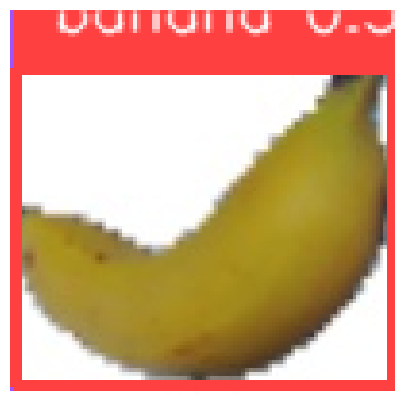

Etiquetas generadas para 279_100.jpg


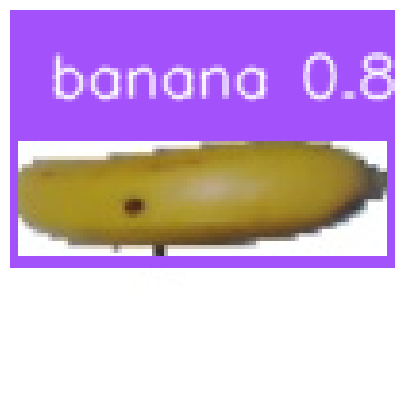

Etiquetas generadas para r_212_100.jpg


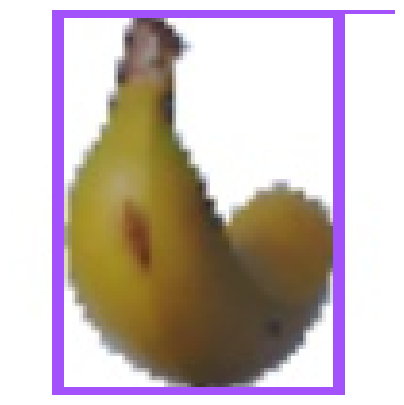

Etiquetas generadas para 39_100.jpg


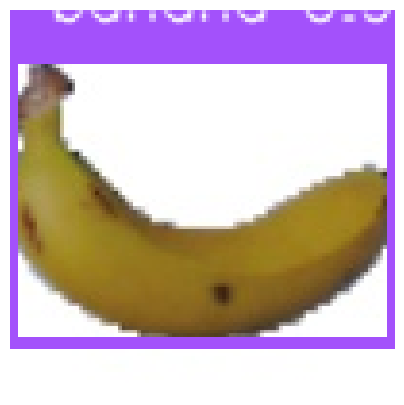

Etiquetas generadas para 67_100.jpg


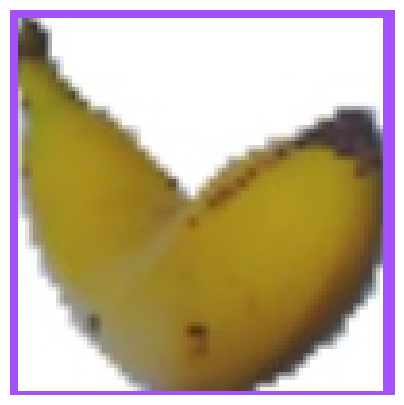

Etiquetas generadas para 148_100.jpg


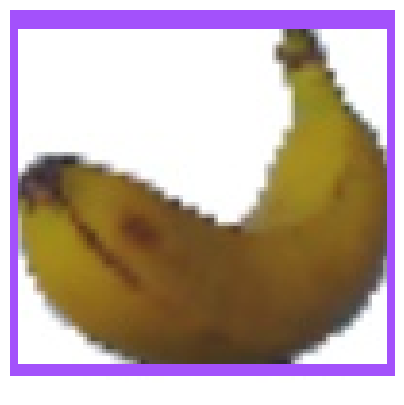

Etiquetas generadas para 189_100.jpg


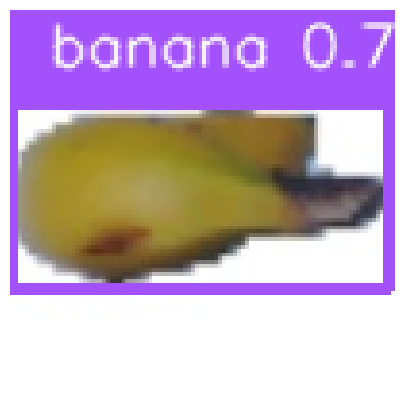

Etiquetas generadas para r_273_100.jpg


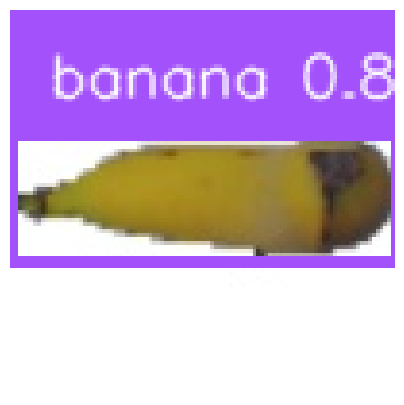

Etiquetas generadas para r_82_100.jpg


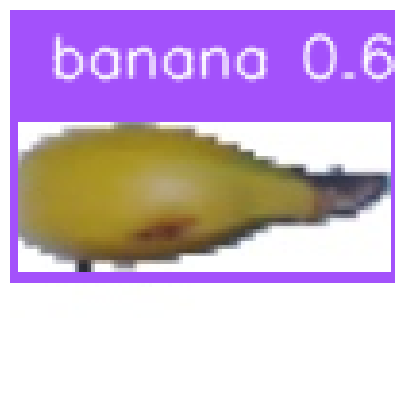

Etiquetas generadas para r_260_100.jpg


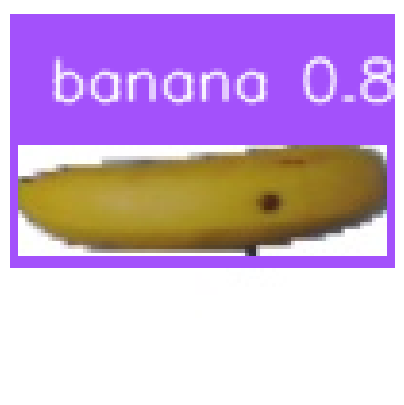

Etiquetas generadas para r_173_100.jpg


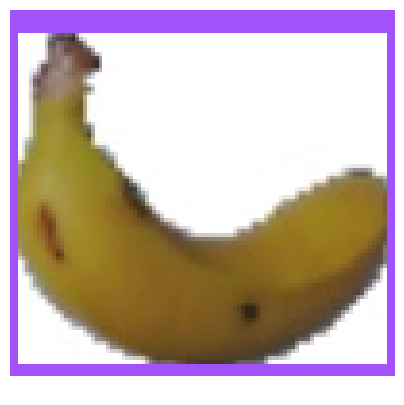

Etiquetas generadas para 57_100.jpg


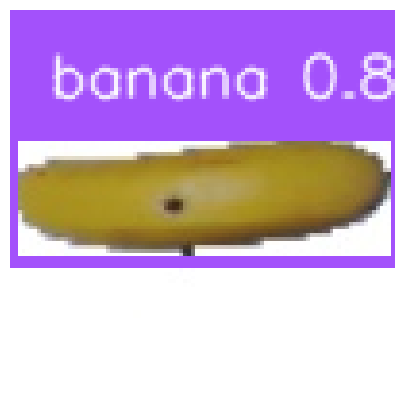

Etiquetas generadas para r_202_100.jpg


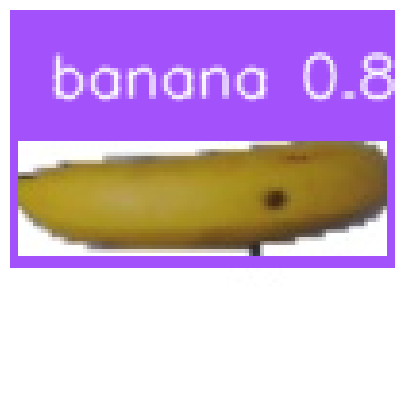

Etiquetas generadas para r_172_100.jpg


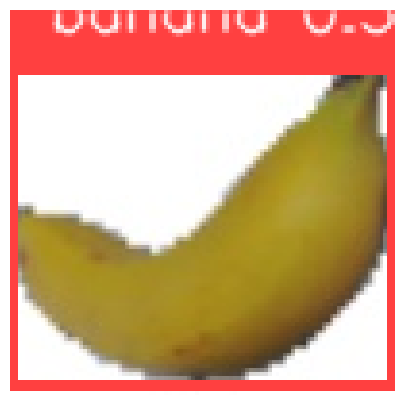

Etiquetas generadas para 278_100.jpg


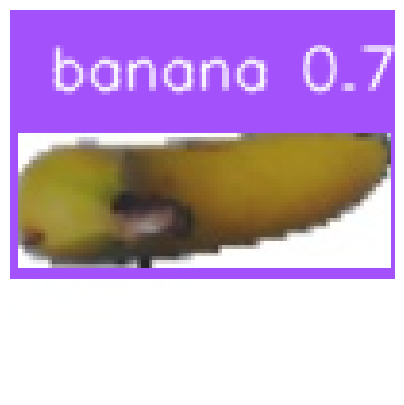

Etiquetas generadas para r_295_100.jpg


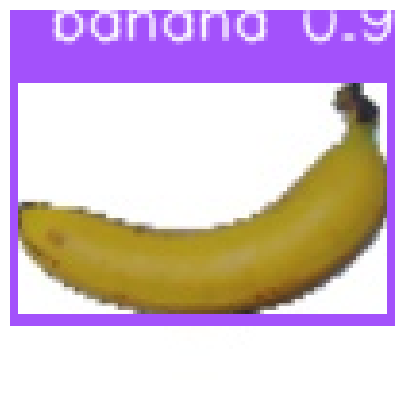

Etiquetas generadas para 239_100.jpg


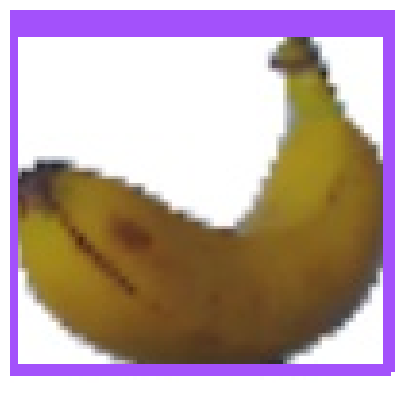

Etiquetas generadas para 190_100.jpg


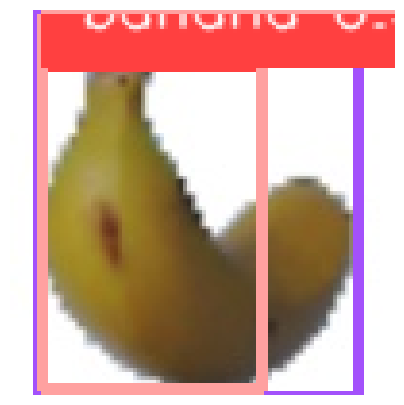

Etiquetas generadas para 43_100.jpg


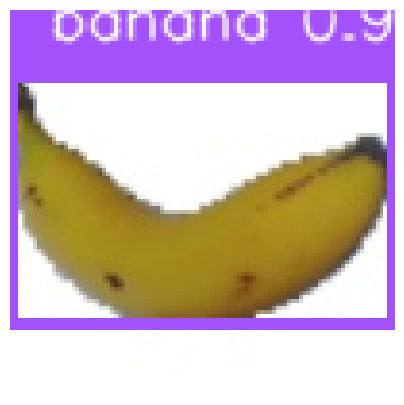

Etiquetas generadas para 133_100.jpg


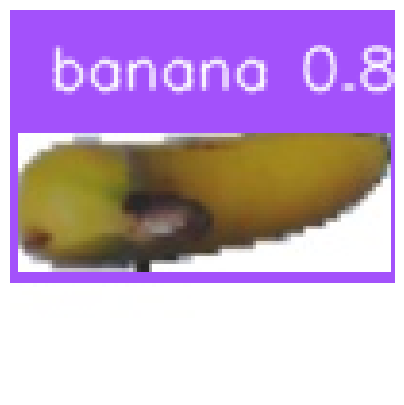

Etiquetas generadas para r_293_100.jpg


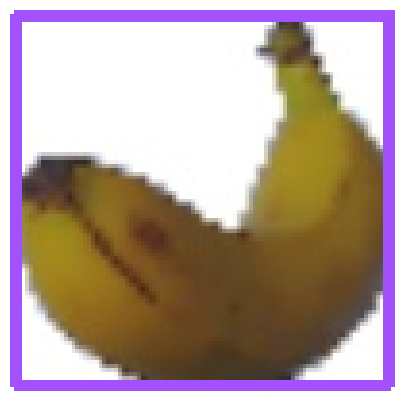

Etiquetas generadas para 186_100.jpg


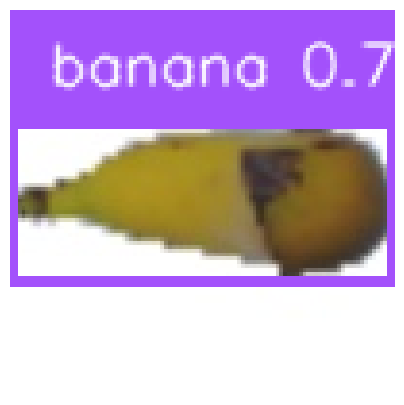

Etiquetas generadas para r_95_100.jpg


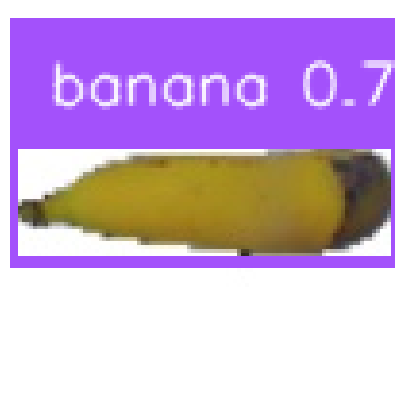

Etiquetas generadas para r_75_100.jpg


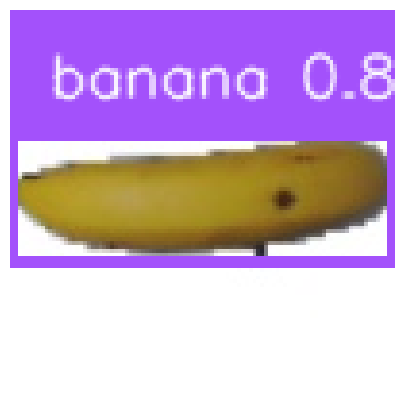

Etiquetas generadas para r_169_100.jpg


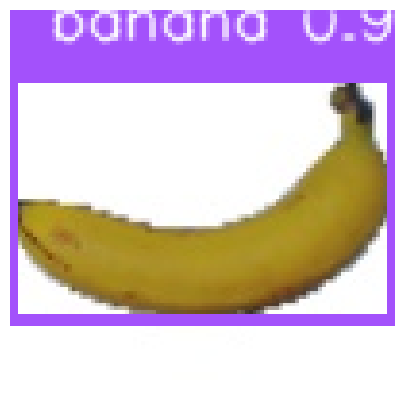

Etiquetas generadas para 229_100.jpg


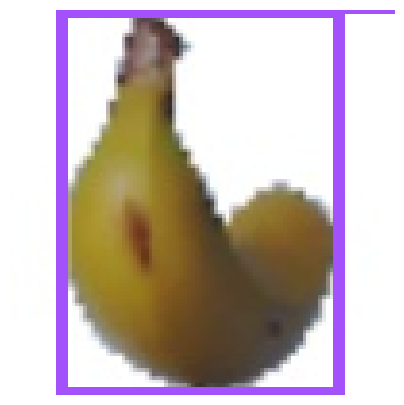

Etiquetas generadas para 325_100.jpg


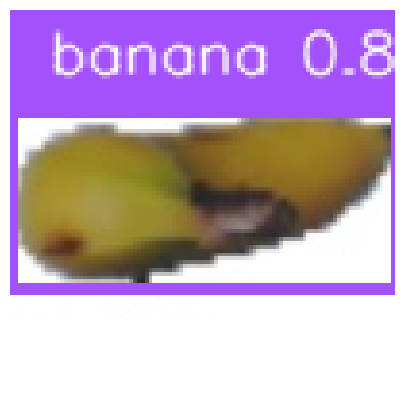

Etiquetas generadas para r_285_100.jpg


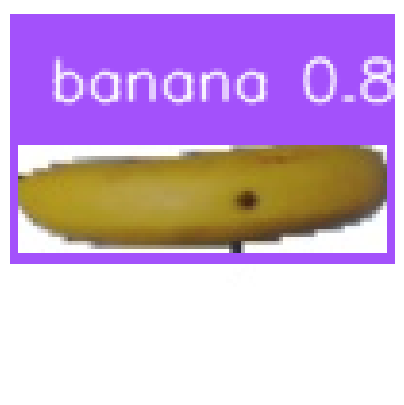

Etiquetas generadas para r_180_100.jpg


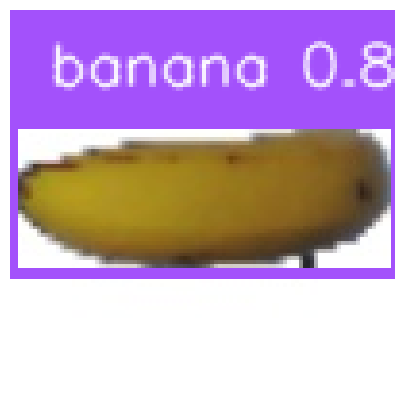

Etiquetas generadas para r_139_100.jpg


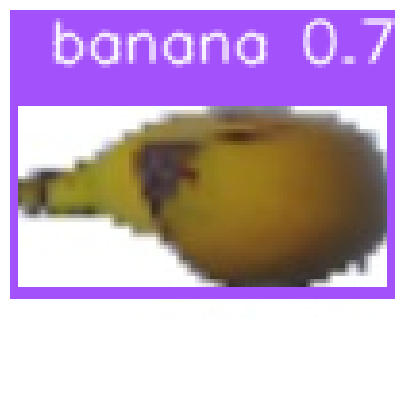

Etiquetas generadas para r_106_100.jpg


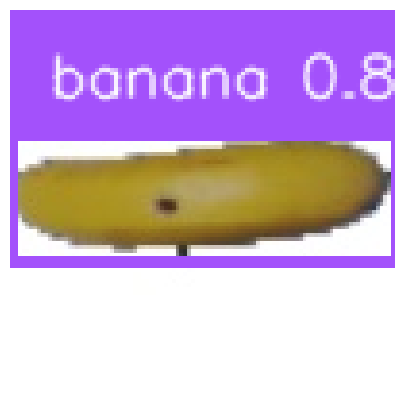

Etiquetas generadas para r_204_100.jpg


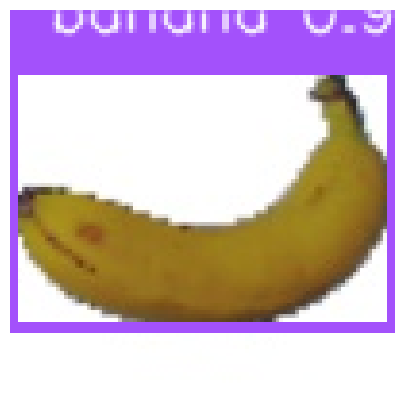

Etiquetas generadas para 209_100.jpg


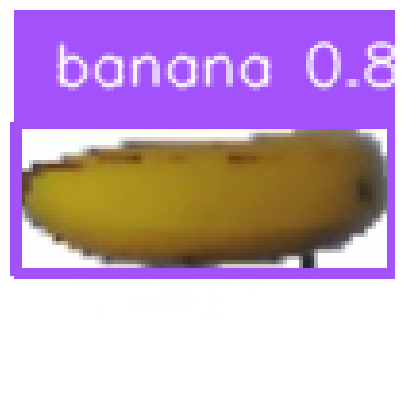

Etiquetas generadas para r_138_100.jpg


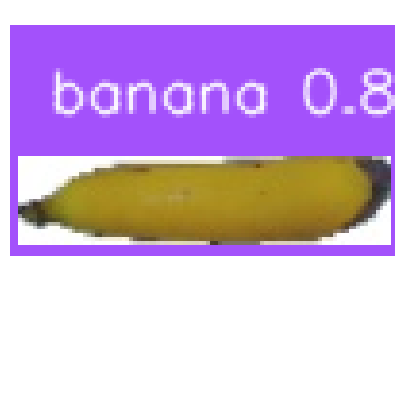

Etiquetas generadas para r_58_100.jpg


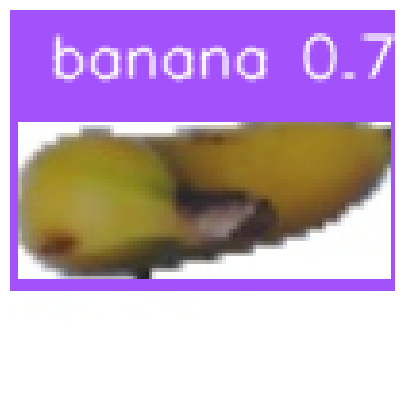

Etiquetas generadas para r_287_100.jpg


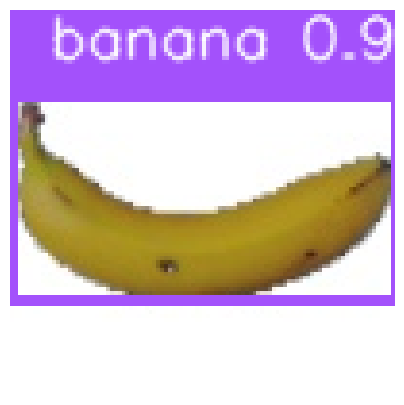

Etiquetas generadas para 95_100.jpg


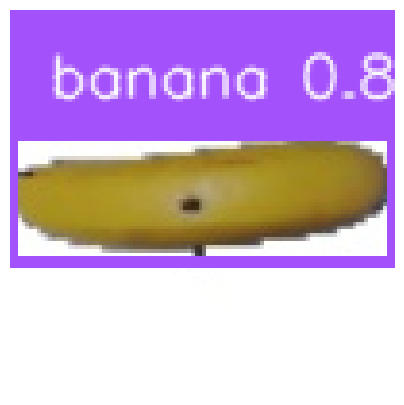

Etiquetas generadas para r_197_100.jpg


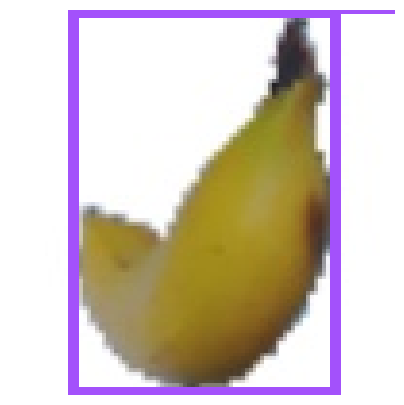

Etiquetas generadas para 11_100.jpg


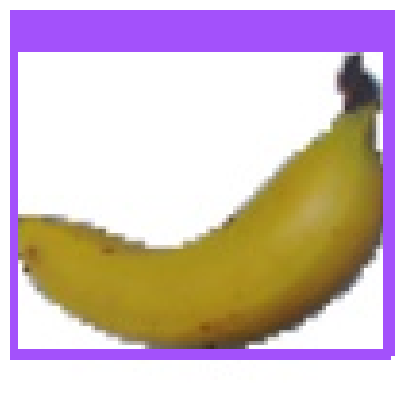

Etiquetas generadas para 269_100.jpg


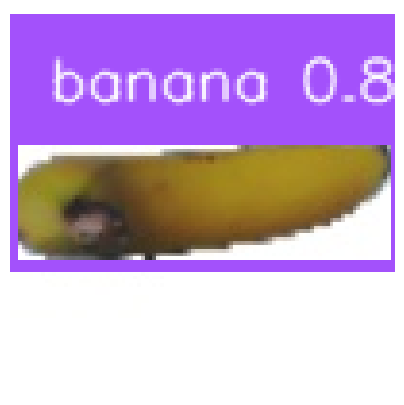

Etiquetas generadas para r_3_100.jpg


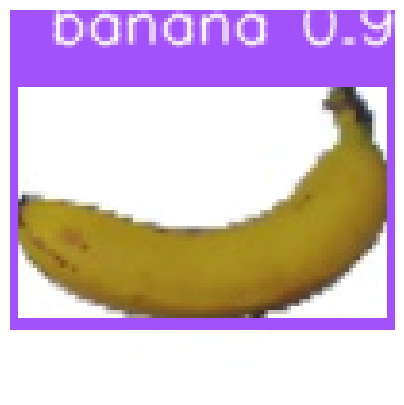

Etiquetas generadas para 222_100.jpg


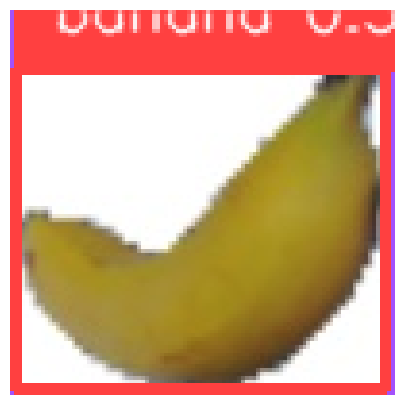

Etiquetas generadas para 2_100.jpg


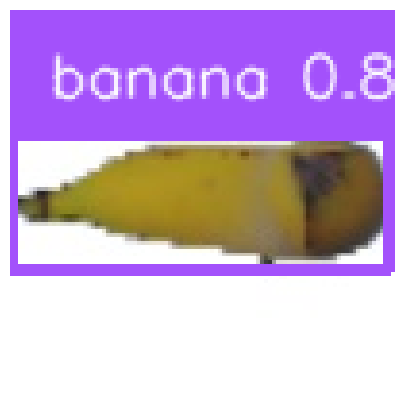

Etiquetas generadas para r_86_100.jpg


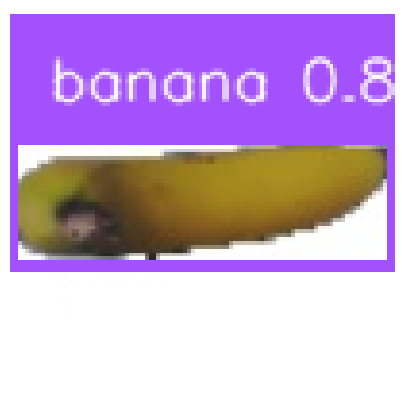

Etiquetas generadas para r_5_100.jpg


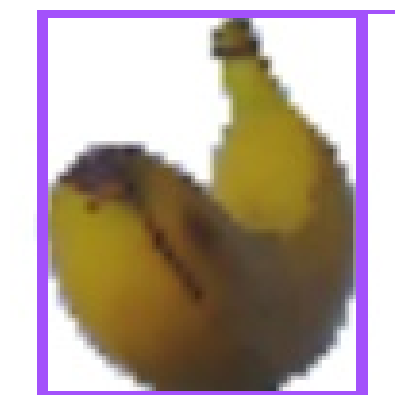

Etiquetas generadas para 178_100.jpg


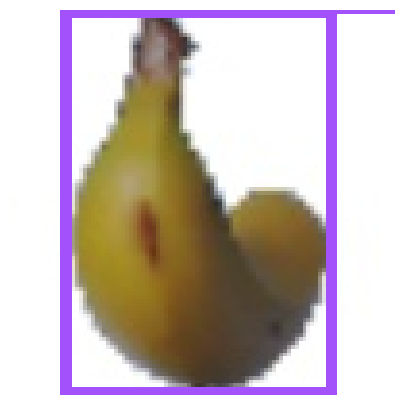

Etiquetas generadas para 37_100.jpg


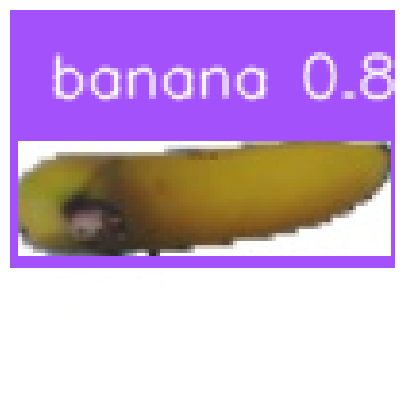

Etiquetas generadas para r_4_100.jpg


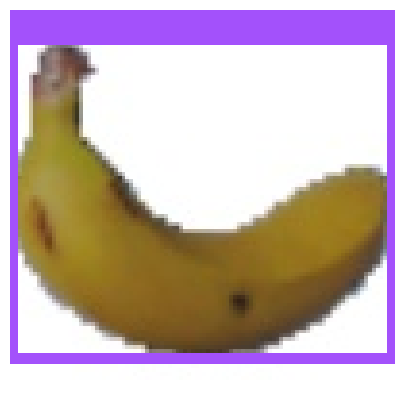

Etiquetas generadas para 60_100.jpg


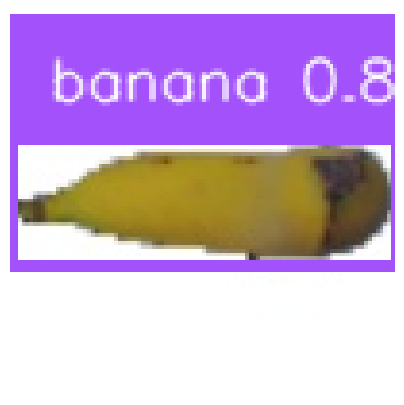

Etiquetas generadas para r_80_100.jpg


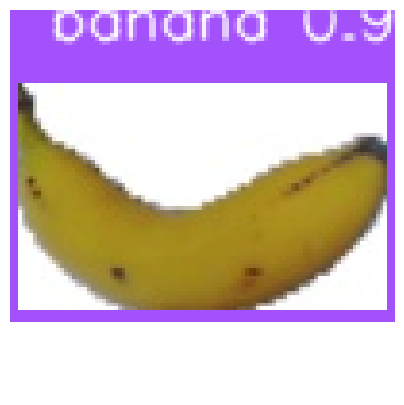

Etiquetas generadas para 130_100.jpg


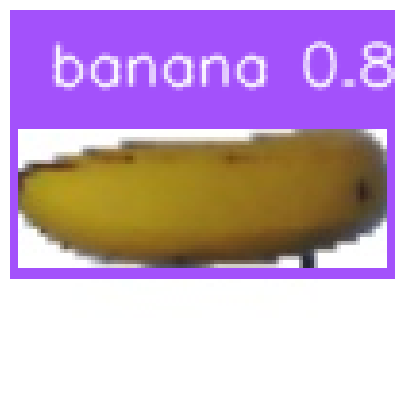

Etiquetas generadas para r_140_100.jpg


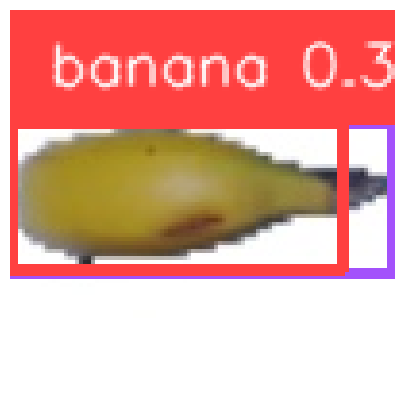

Etiquetas generadas para r_254_100.jpg


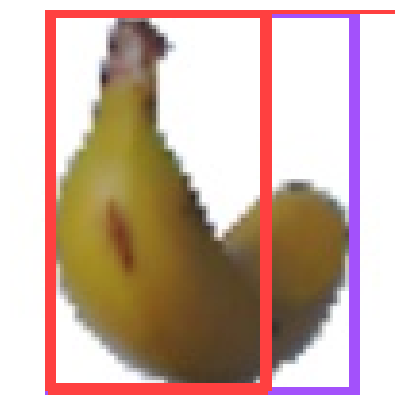

Etiquetas generadas para 42_100.jpg


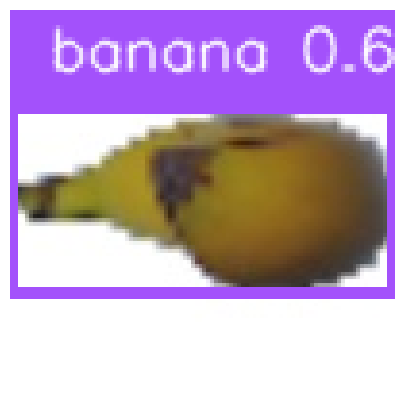

Etiquetas generadas para r_105_100.jpg


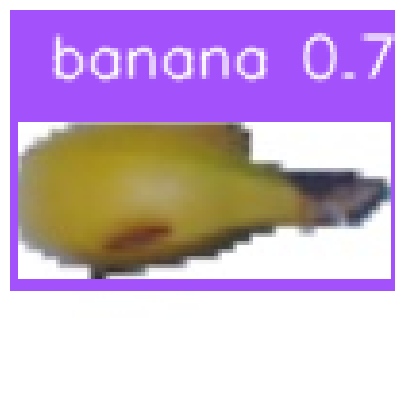

Etiquetas generadas para r_267_100.jpg


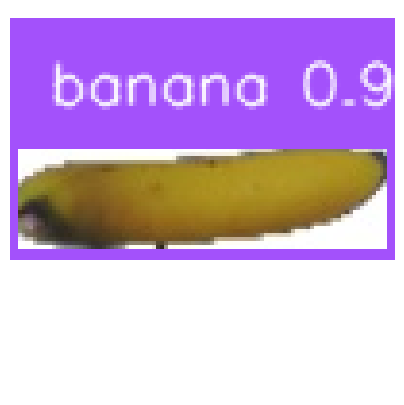

Etiquetas generadas para r_323_100.jpg


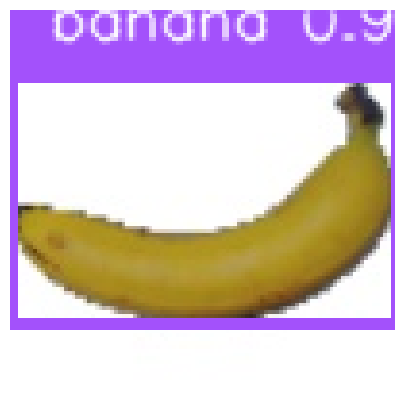

Etiquetas generadas para 238_100.jpg


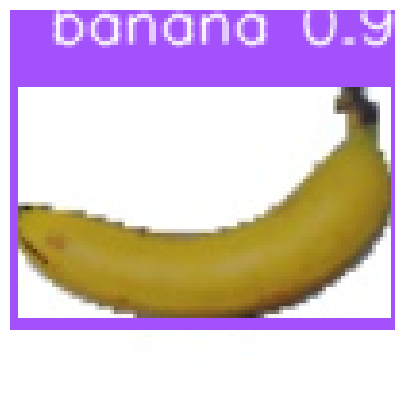

Etiquetas generadas para 236_100.jpg


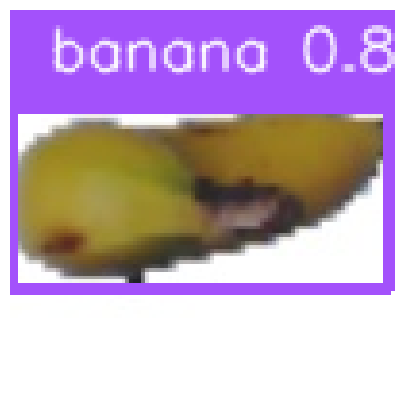

Etiquetas generadas para r_284_100.jpg


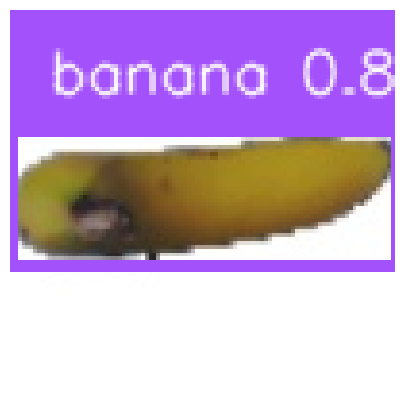

Etiquetas generadas para r_2_100.jpg


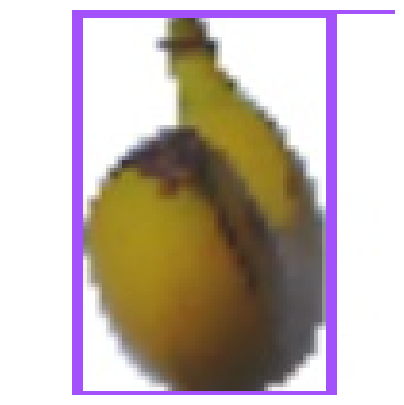

Etiquetas generadas para 170_100.jpg


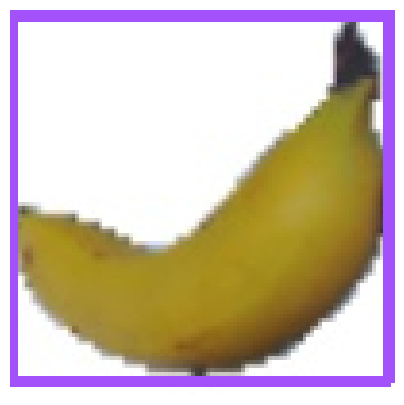

Etiquetas generadas para 277_100.jpg


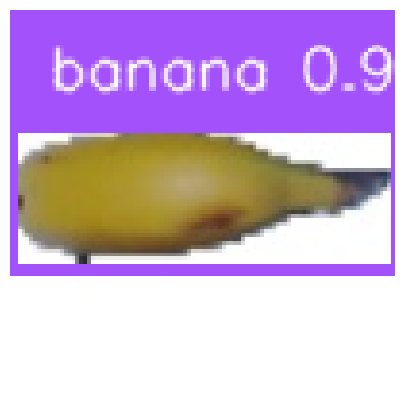

Etiquetas generadas para r_248_100.jpg


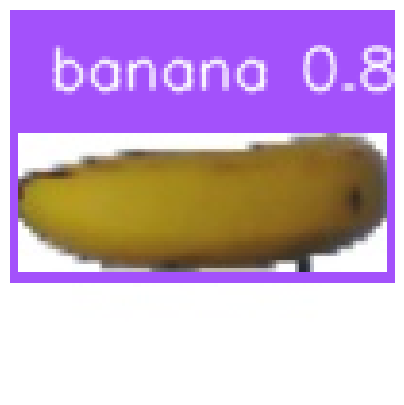

Etiquetas generadas para r_143_100.jpg


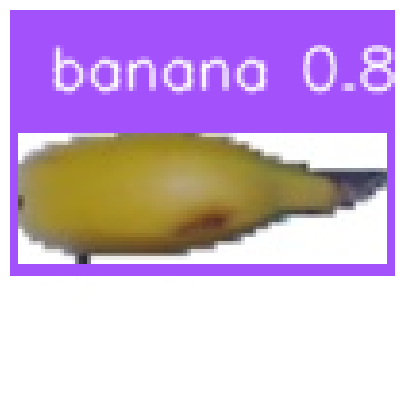

Etiquetas generadas para r_250_100.jpg


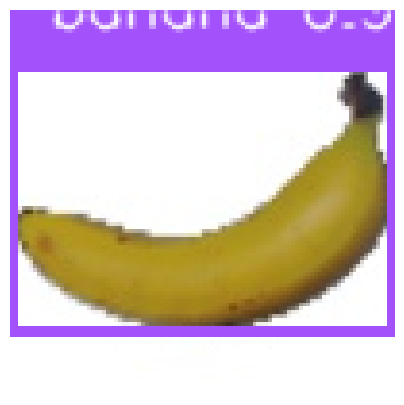

Etiquetas generadas para 256_100.jpg


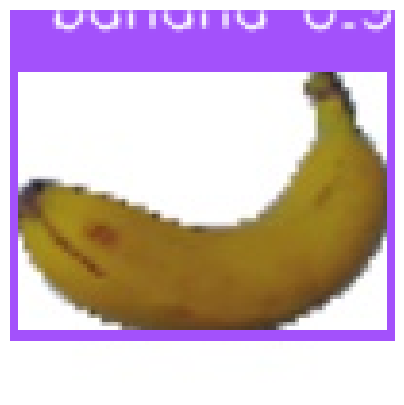

Etiquetas generadas para 203_100.jpg


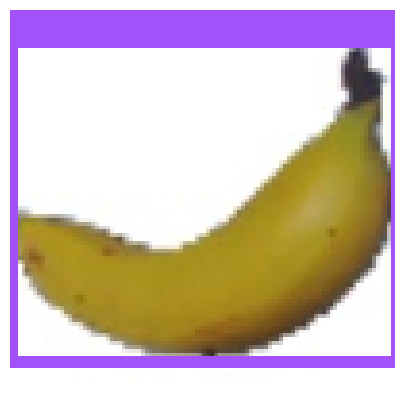

Etiquetas generadas para 271_100.jpg


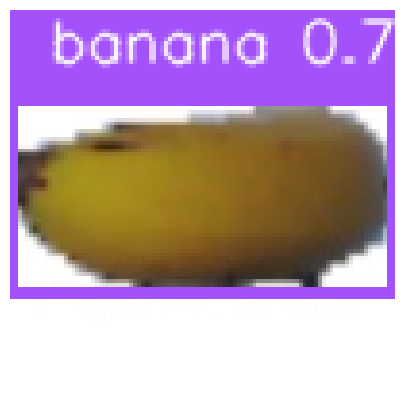

Etiquetas generadas para r_123_100.jpg


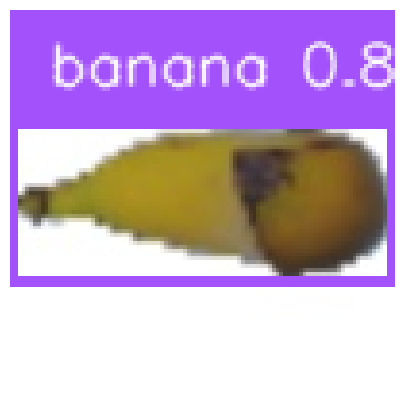

Etiquetas generadas para r_96_100.jpg


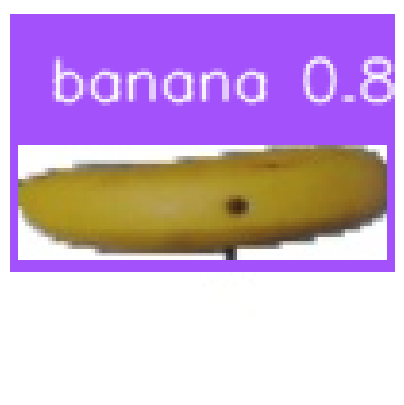

Etiquetas generadas para r_184_100.jpg


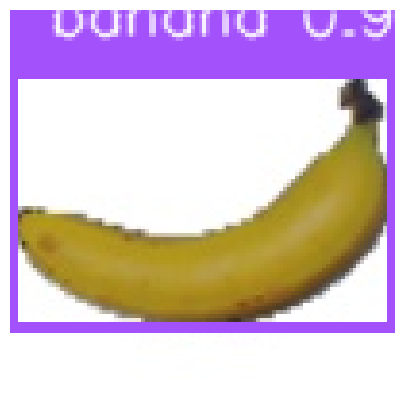

Etiquetas generadas para 250_100.jpg


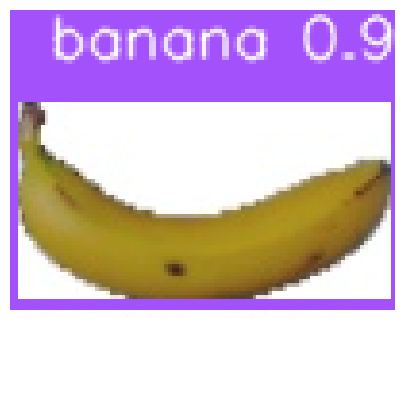

Etiquetas generadas para 90_100.jpg


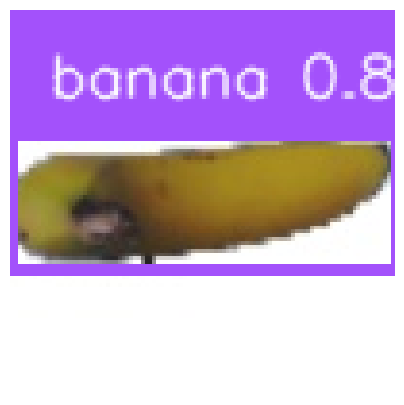

Etiquetas generadas para r_1_100.jpg


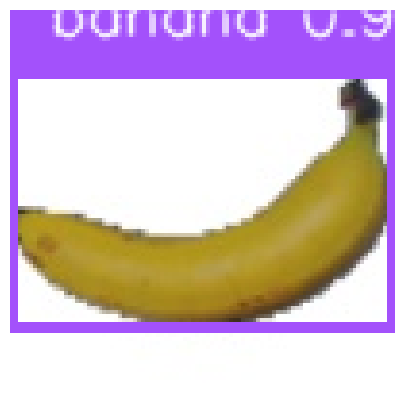

Etiquetas generadas para 249_100.jpg


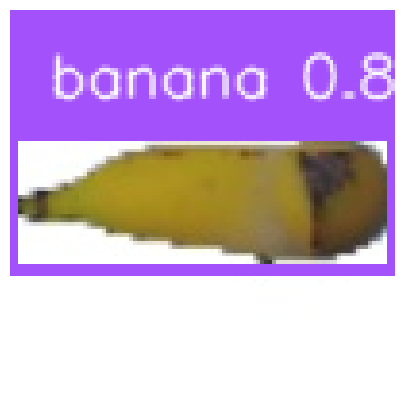

Etiquetas generadas para r_85_100.jpg


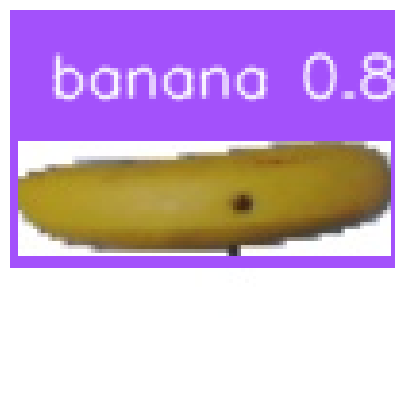

Etiquetas generadas para r_182_100.jpg


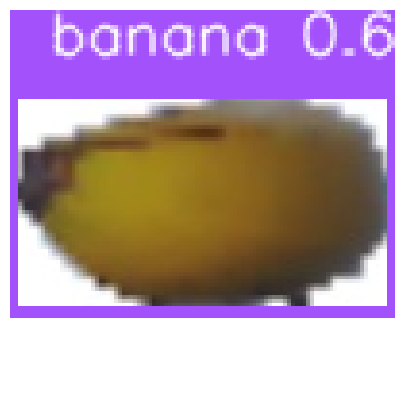

Etiquetas generadas para r_115_100.jpg


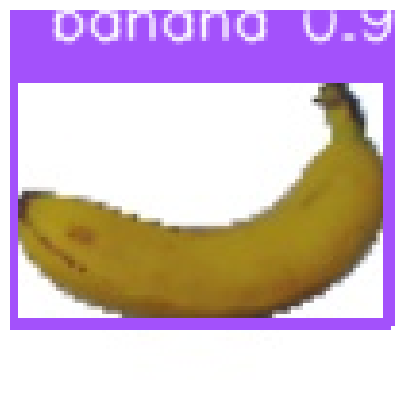

Etiquetas generadas para 214_100.jpg


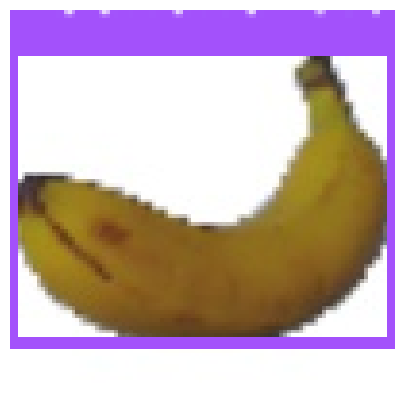

Etiquetas generadas para 198_100.jpg


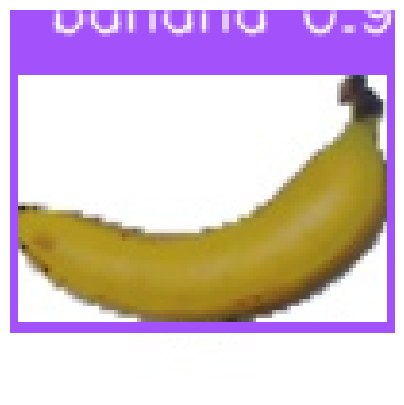

Etiquetas generadas para 251_100.jpg


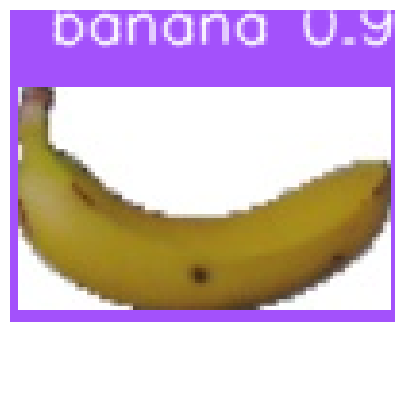

Etiquetas generadas para 79_100.jpg


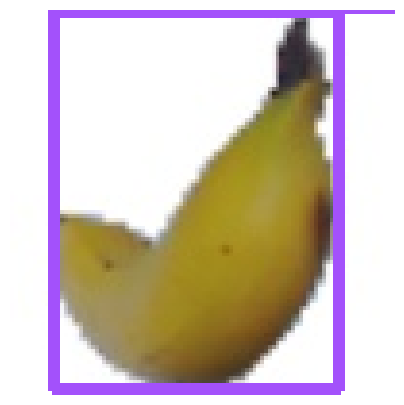

Etiquetas generadas para 8_100.jpg


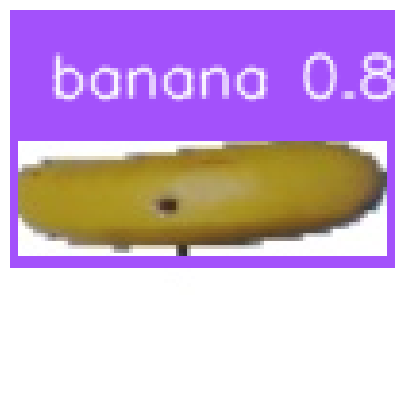

Etiquetas generadas para r_203_100.jpg


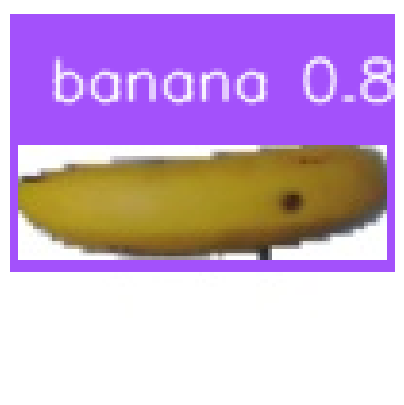

Etiquetas generadas para r_166_100.jpg


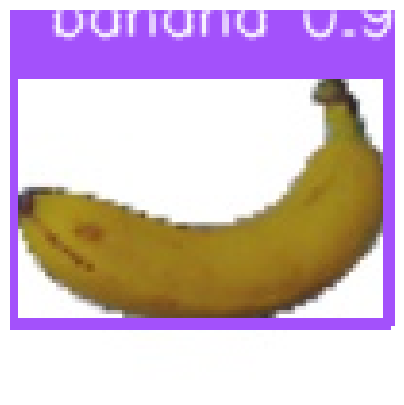

Etiquetas generadas para 211_100.jpg


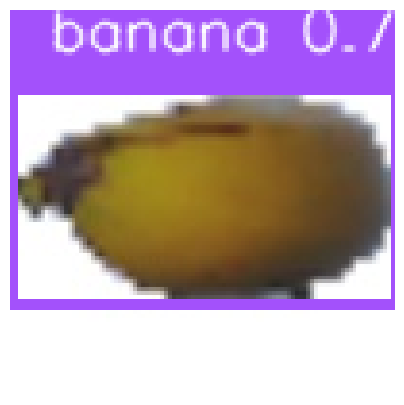

Etiquetas generadas para r_113_100.jpg


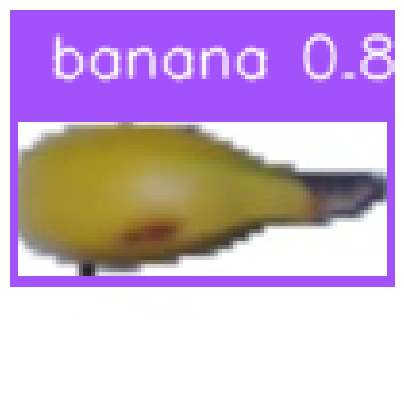

Etiquetas generadas para r_263_100.jpg


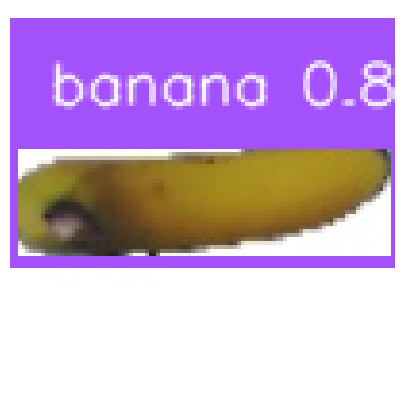

Etiquetas generadas para r_310_100.jpg


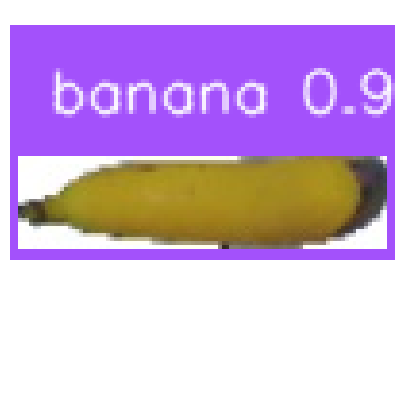

Etiquetas generadas para r_65_100.jpg


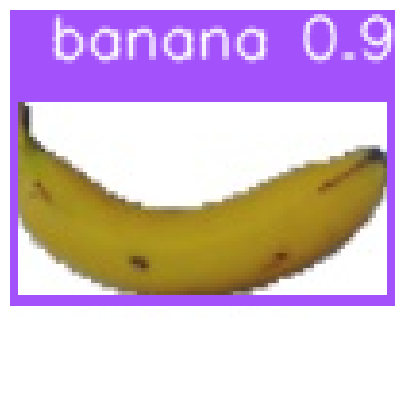

Etiquetas generadas para 112_100.jpg


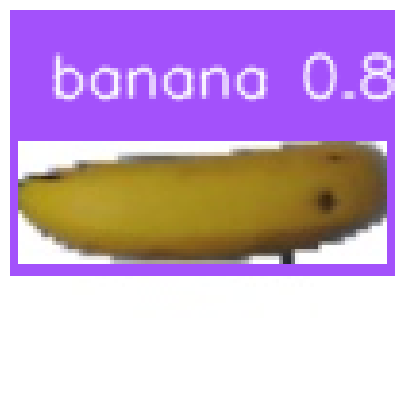

Etiquetas generadas para r_155_100.jpg


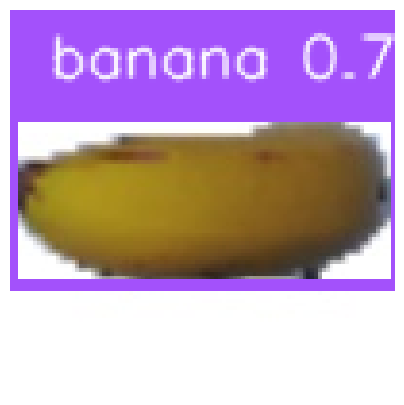

Etiquetas generadas para r_129_100.jpg


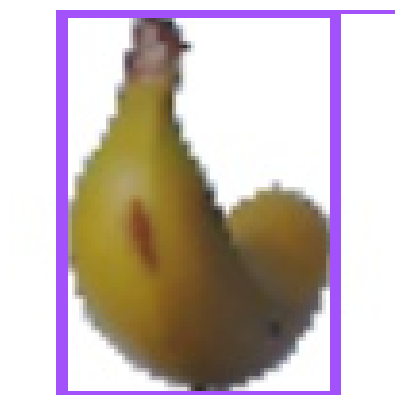

Etiquetas generadas para 38_100.jpg


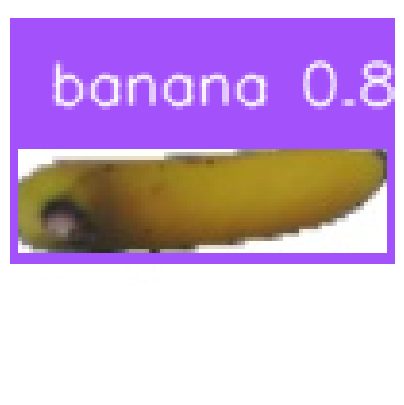

Etiquetas generadas para r_10_100.jpg


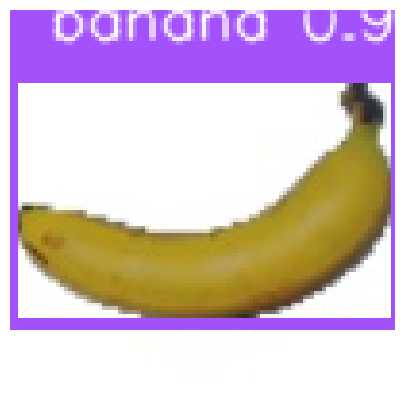

Etiquetas generadas para 244_100.jpg


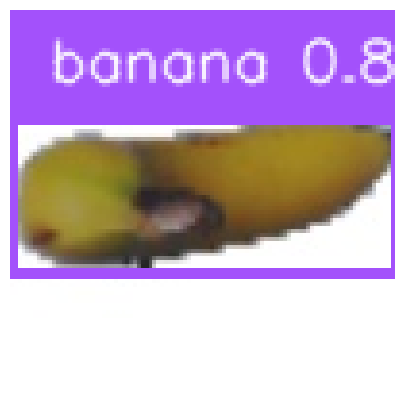

Etiquetas generadas para r_292_100.jpg


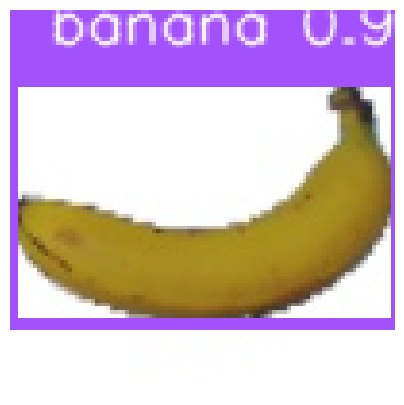

Etiquetas generadas para 224_100.jpg


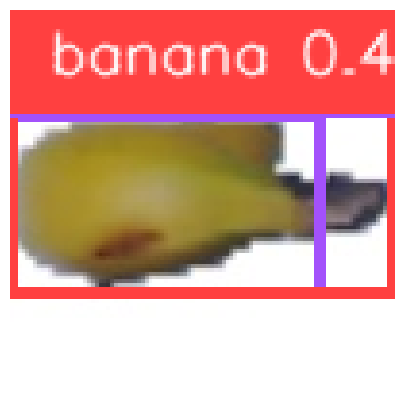

Etiquetas generadas para r_270_100.jpg


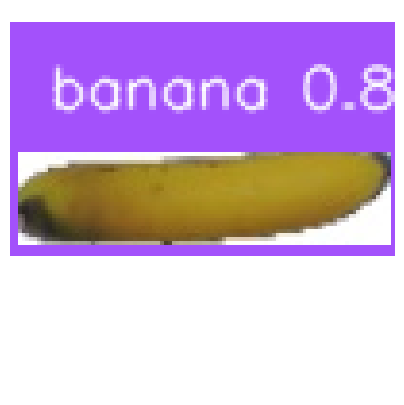

Etiquetas generadas para r_27_100.jpg


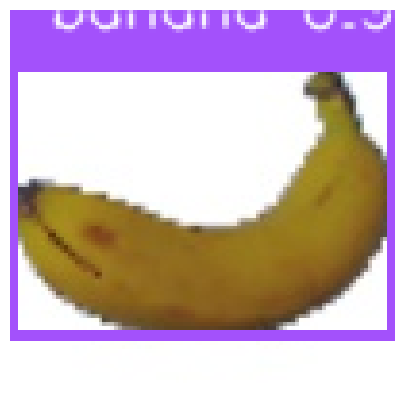

Etiquetas generadas para 204_100.jpg


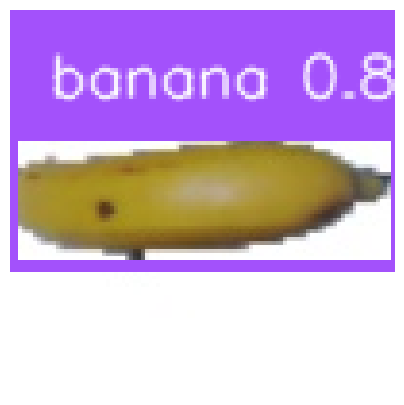

Etiquetas generadas para r_219_100.jpg


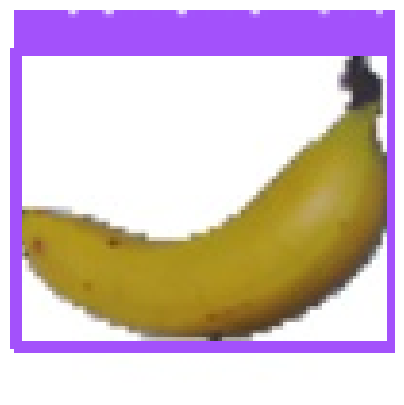

Etiquetas generadas para 266_100.jpg


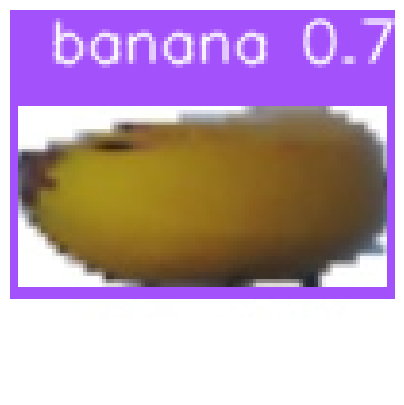

Etiquetas generadas para r_122_100.jpg


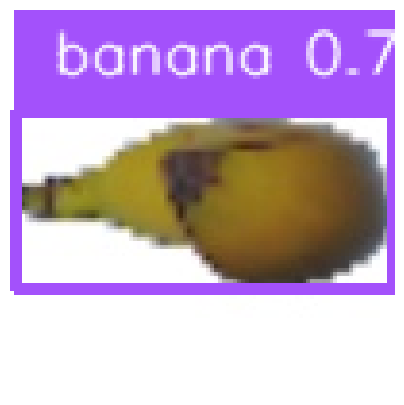

Etiquetas generadas para r_104_100.jpg


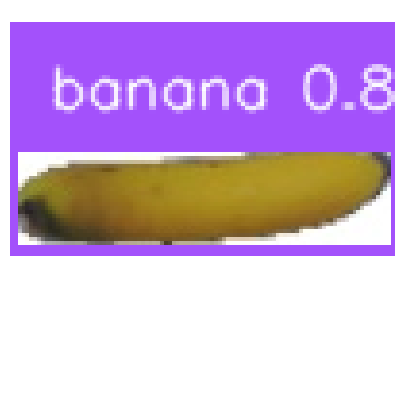

Etiquetas generadas para r_26_100.jpg


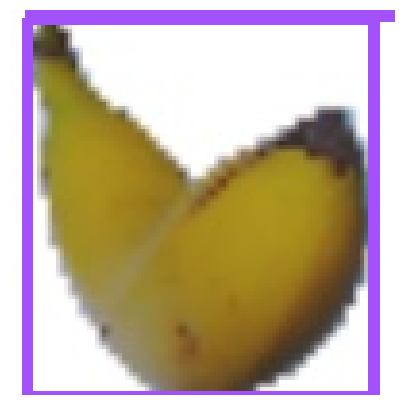

Etiquetas generadas para 151_100.jpg


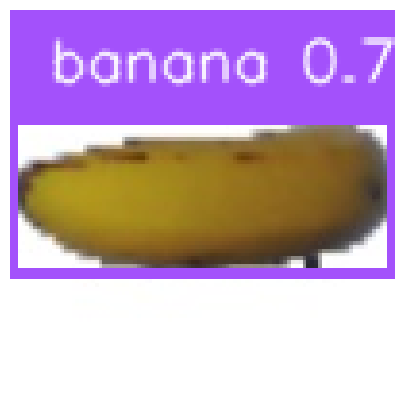

Etiquetas generadas para r_136_100.jpg


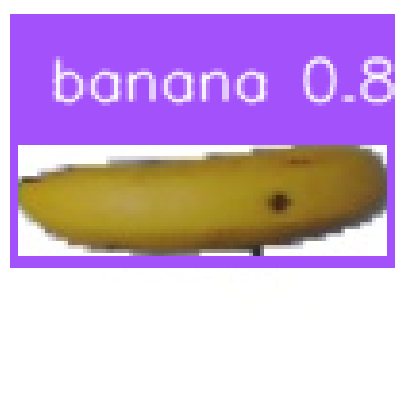

Etiquetas generadas para r_170_100.jpg


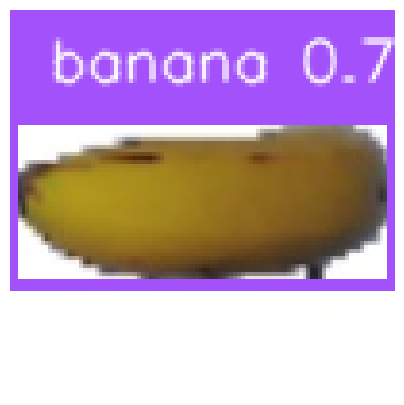

Etiquetas generadas para r_132_100.jpg


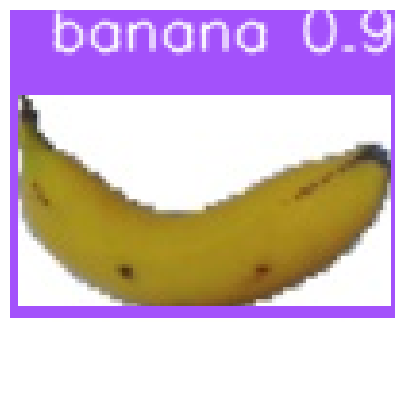

Etiquetas generadas para 125_100.jpg


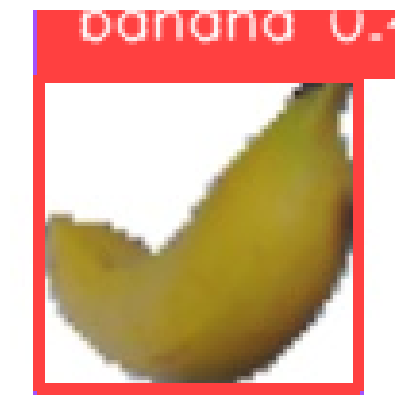

Etiquetas generadas para 287_100.jpg


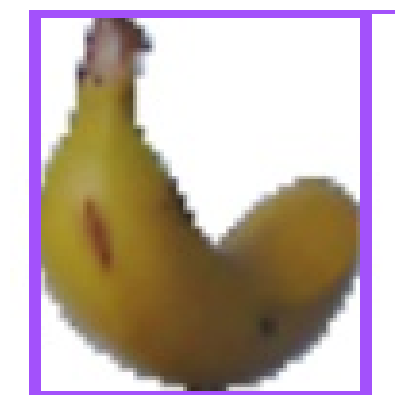

Etiquetas generadas para 45_100.jpg


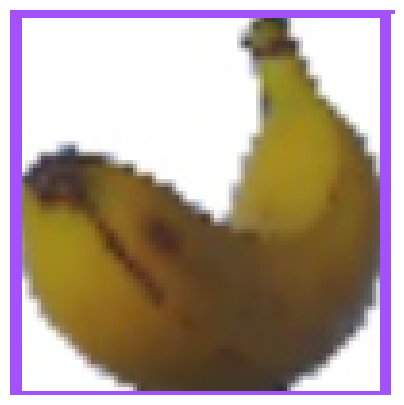

Etiquetas generadas para 183_100.jpg


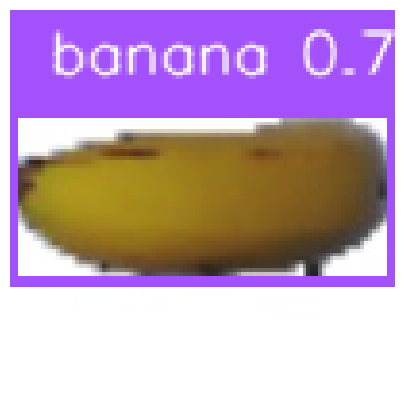

Etiquetas generadas para r_131_100.jpg


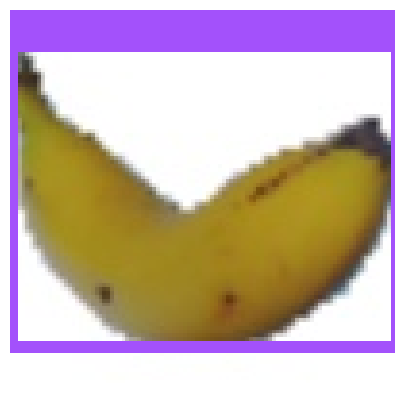

Etiquetas generadas para 139_100.jpg


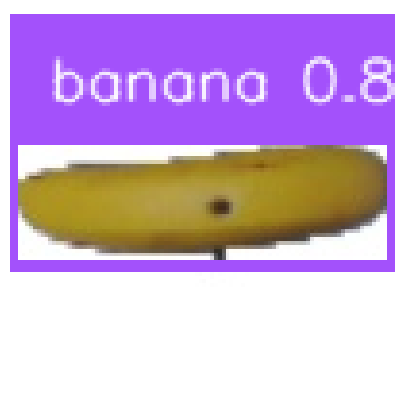

Etiquetas generadas para r_189_100.jpg


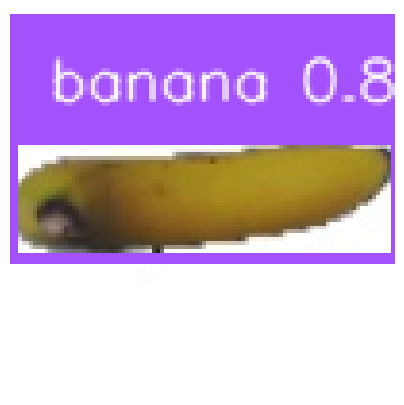

Etiquetas generadas para r_314_100.jpg


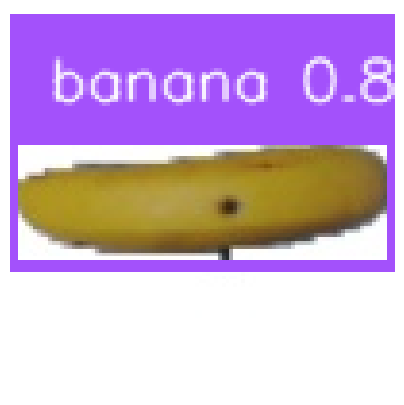

Etiquetas generadas para r_186_100.jpg


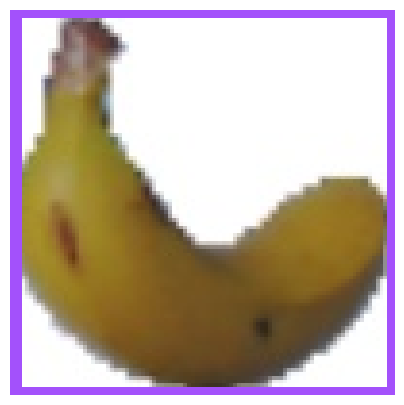

Etiquetas generadas para 51_100.jpg


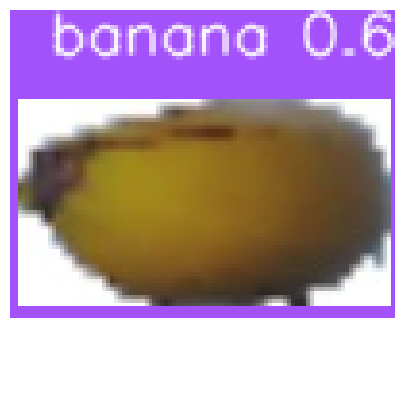

Etiquetas generadas para r_114_100.jpg


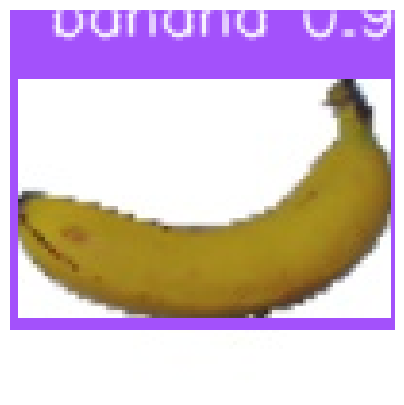

Etiquetas generadas para 220_100.jpg


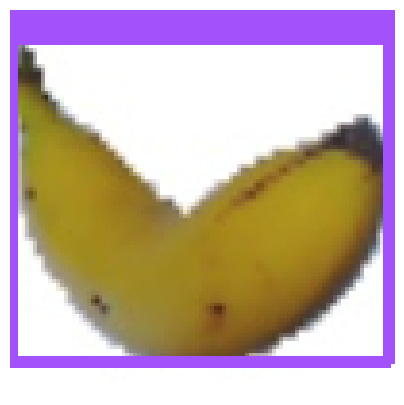

Etiquetas generadas para 142_100.jpg


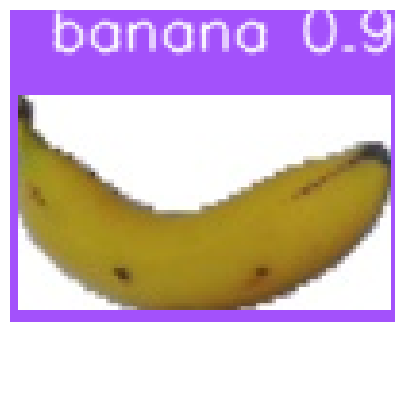

Etiquetas generadas para 126_100.jpg


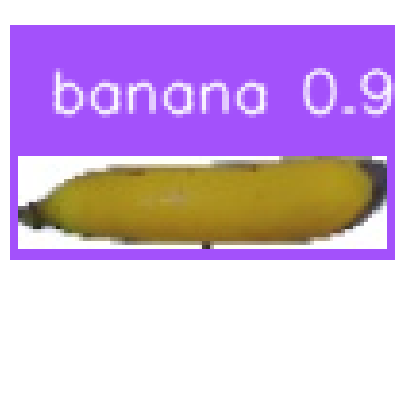

Etiquetas generadas para r_55_100.jpg


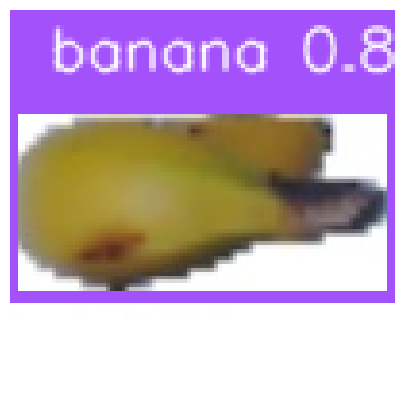

Etiquetas generadas para r_274_100.jpg


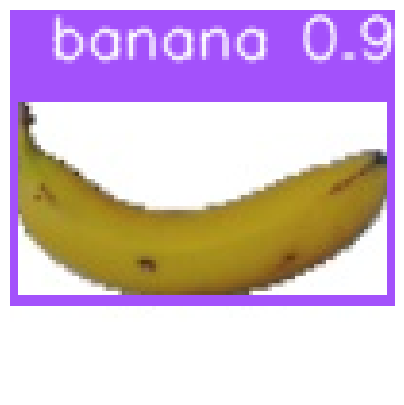

Etiquetas generadas para 107_100.jpg


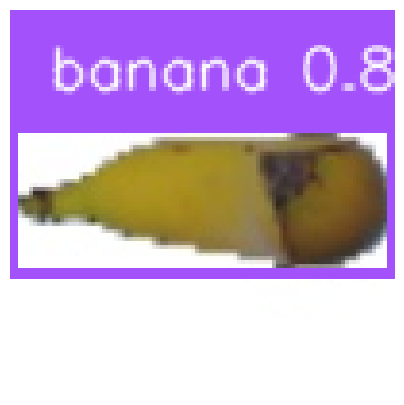

Etiquetas generadas para r_92_100.jpg


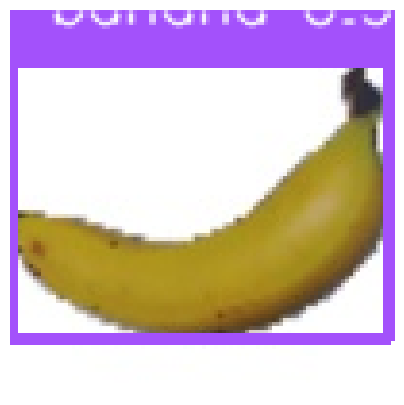

Etiquetas generadas para 260_100.jpg


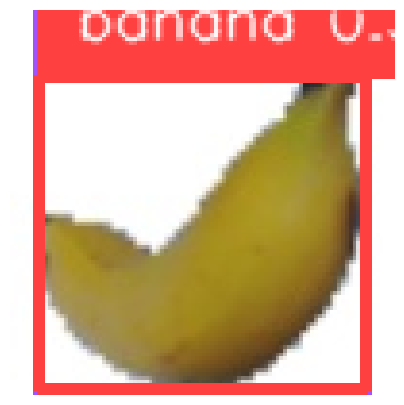

Etiquetas generadas para 5_100.jpg


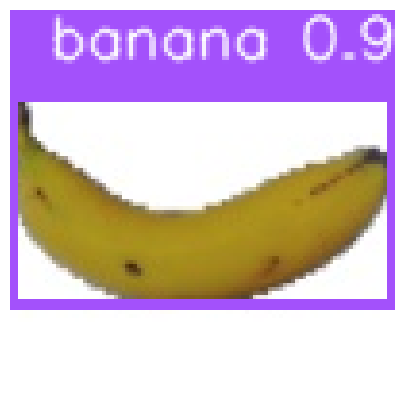

Etiquetas generadas para 118_100.jpg


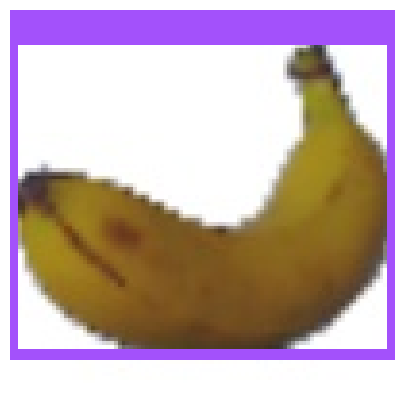

Etiquetas generadas para 194_100.jpg


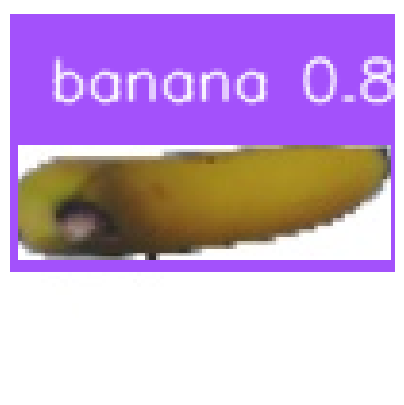

Etiquetas generadas para r_307_100.jpg


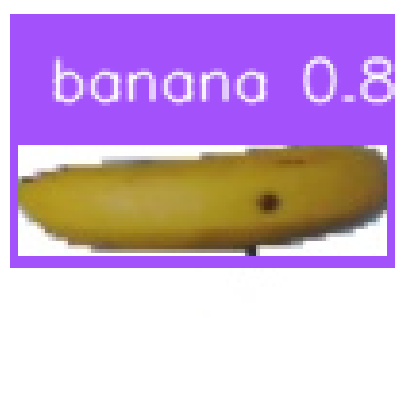

Etiquetas generadas para r_174_100.jpg


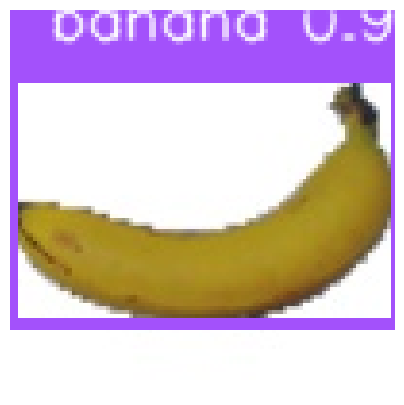

Etiquetas generadas para 228_100.jpg


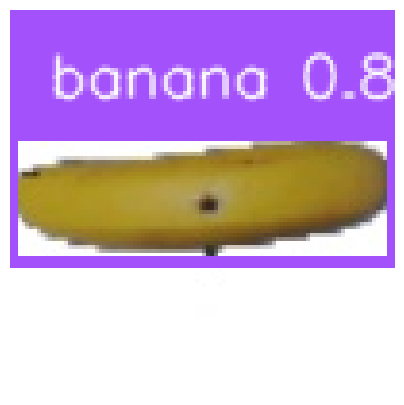

Etiquetas generadas para r_192_100.jpg


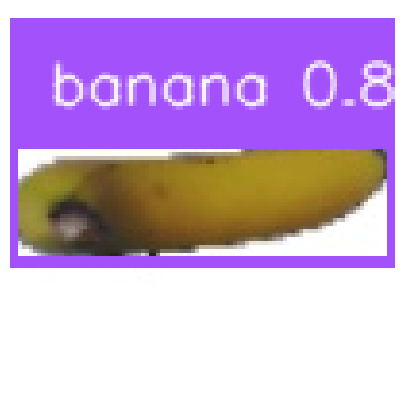

Etiquetas generadas para r_309_100.jpg


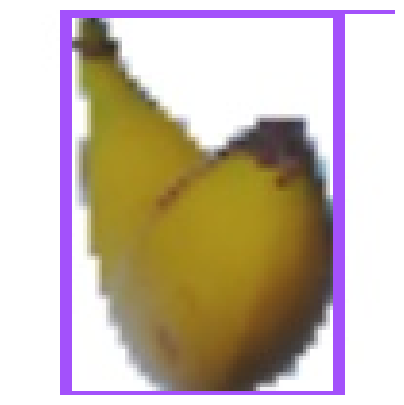

Etiquetas generadas para 157_100.jpg


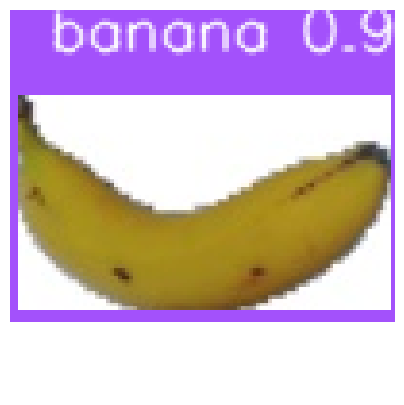

Etiquetas generadas para 127_100.jpg


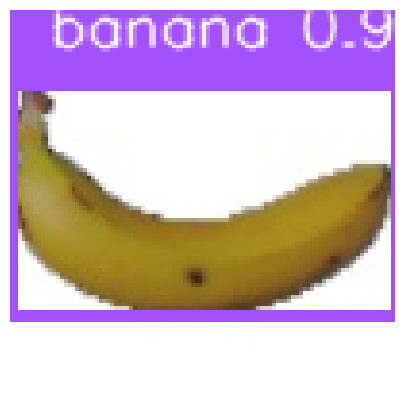

Etiquetas generadas para 80_100.jpg


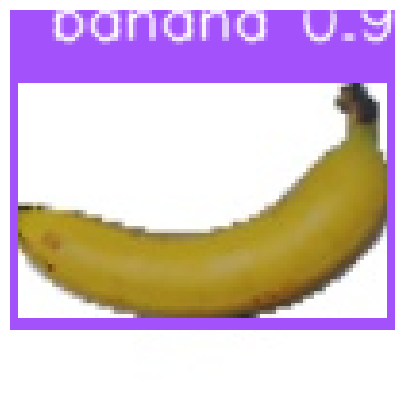

Etiquetas generadas para 241_100.jpg


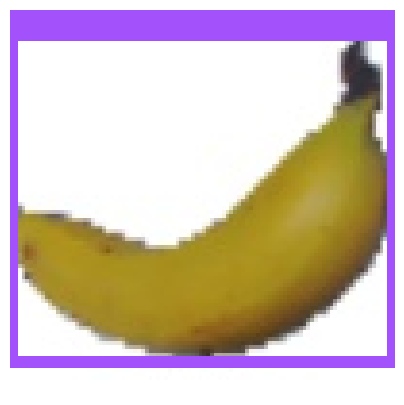

Etiquetas generadas para 272_100.jpg


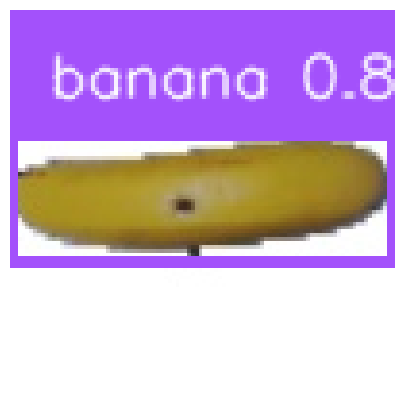

Etiquetas generadas para r_199_100.jpg


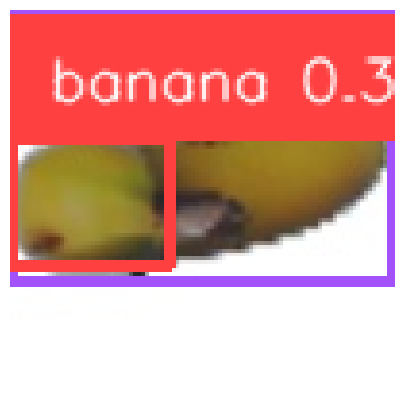

Etiquetas generadas para r_289_100.jpg


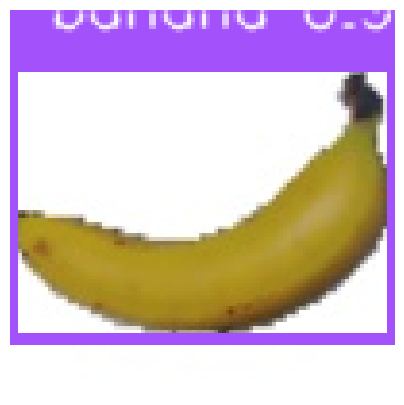

Etiquetas generadas para 257_100.jpg


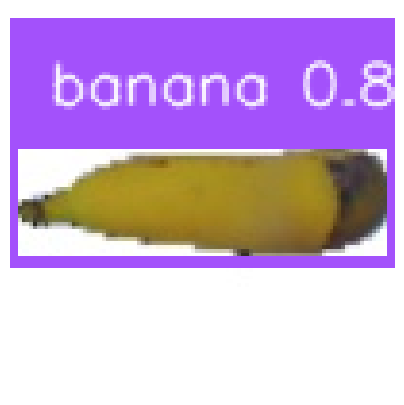

Etiquetas generadas para r_76_100.jpg


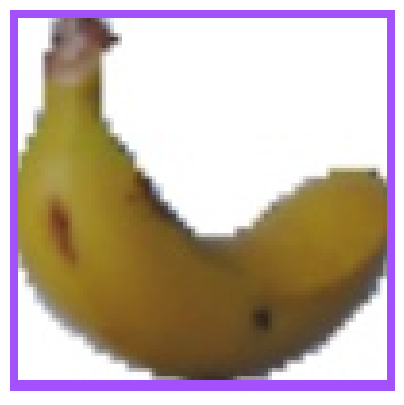

Etiquetas generadas para 52_100.jpg


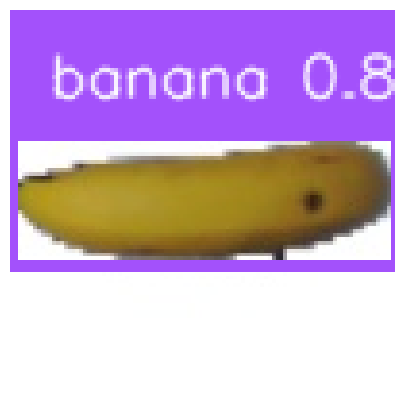

Etiquetas generadas para r_159_100.jpg


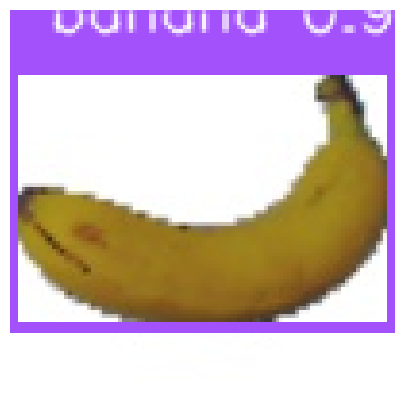

Etiquetas generadas para 210_100.jpg


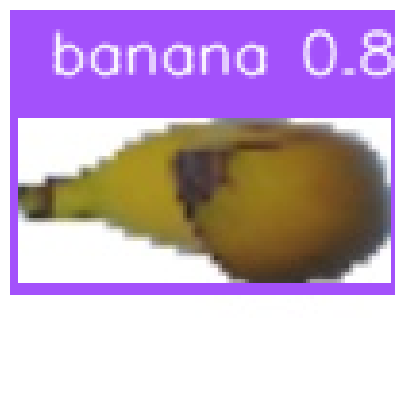

Etiquetas generadas para r_103_100.jpg


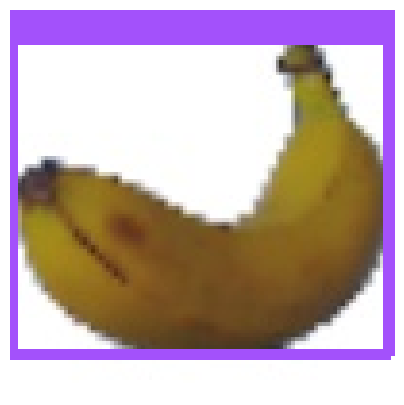

Etiquetas generadas para 192_100.jpg


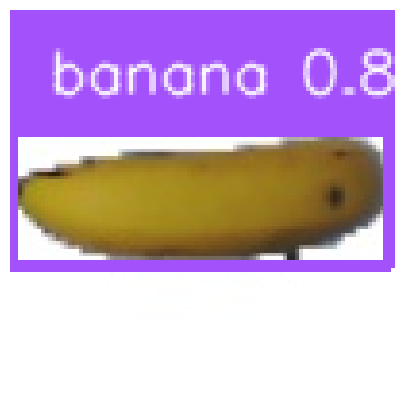

Etiquetas generadas para r_150_100.jpg


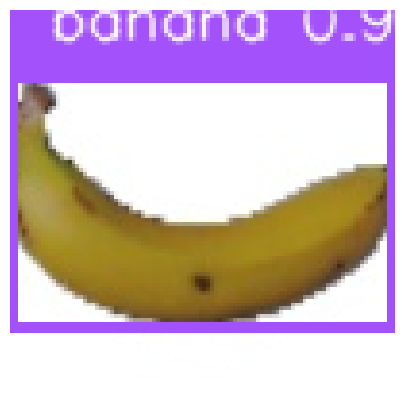

Etiquetas generadas para 77_100.jpg


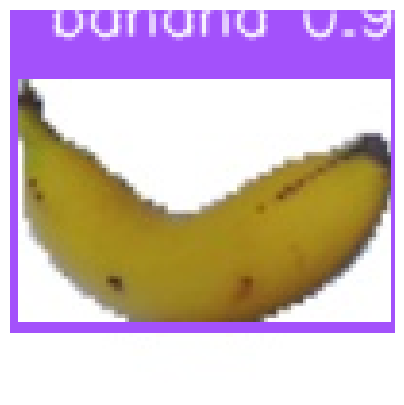

Etiquetas generadas para 135_100.jpg


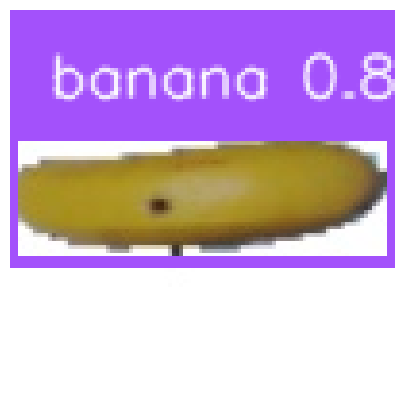

Etiquetas generadas para r_205_100.jpg


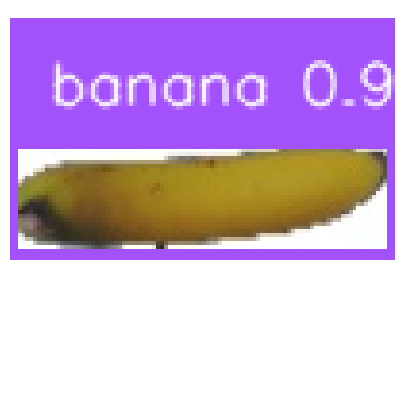

Etiquetas generadas para r_21_100.jpg


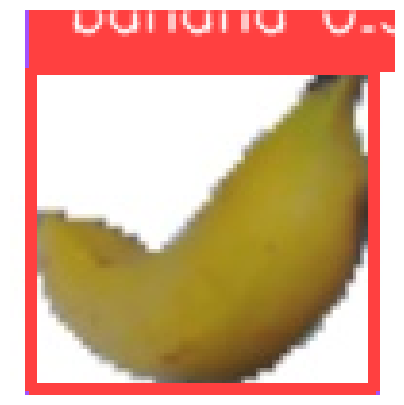

Etiquetas generadas para 4_100.jpg


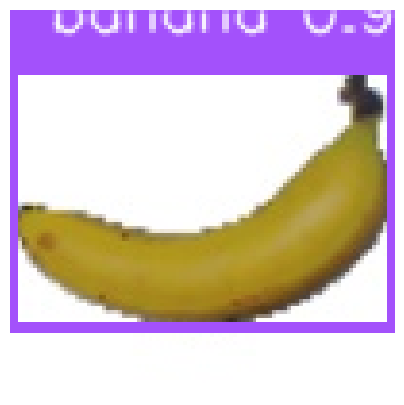

Etiquetas generadas para 253_100.jpg


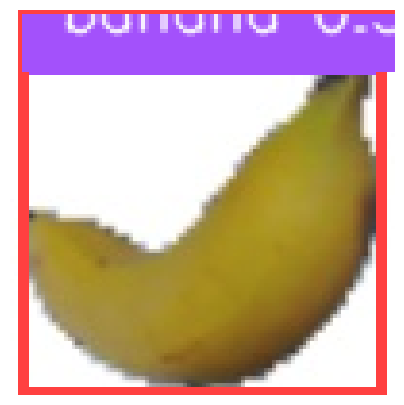

Etiquetas generadas para 3_100.jpg


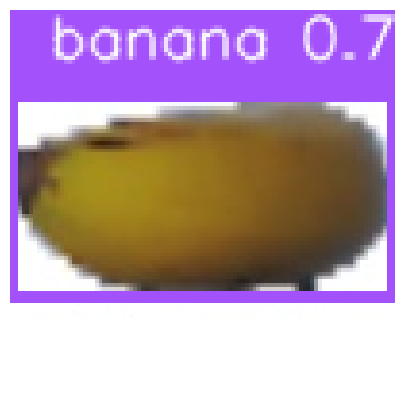

Etiquetas generadas para r_120_100.jpg


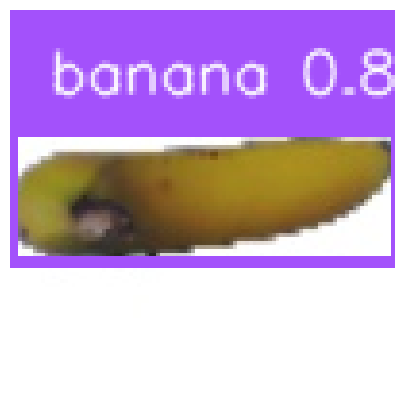

Etiquetas generadas para r_304_100.jpg


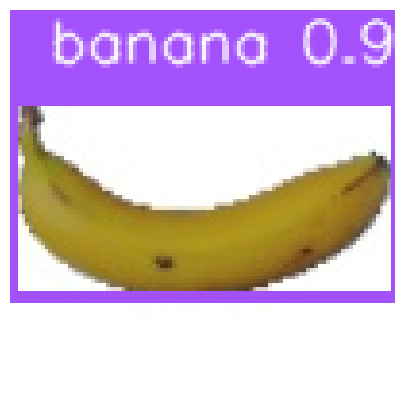

Etiquetas generadas para 97_100.jpg


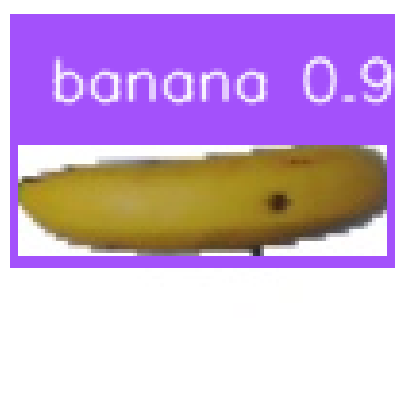

Etiquetas generadas para r_171_100.jpg


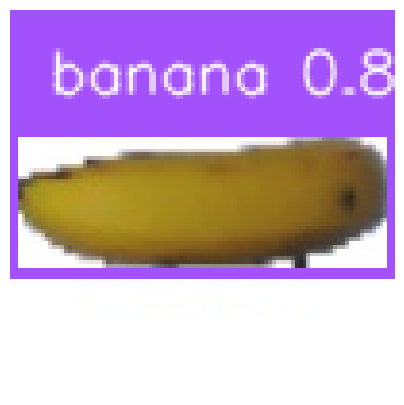

Etiquetas generadas para r_145_100.jpg


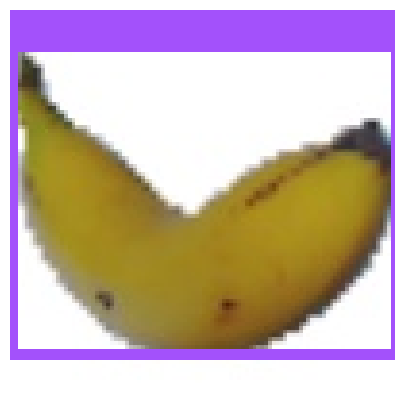

Etiquetas generadas para 140_100.jpg


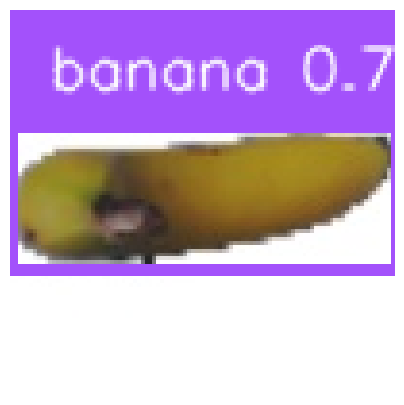

Etiquetas generadas para r_299_100.jpg


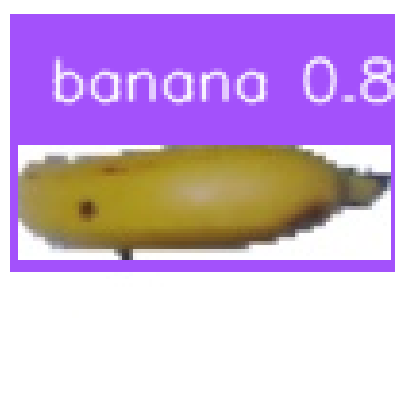

Etiquetas generadas para r_225_100.jpg


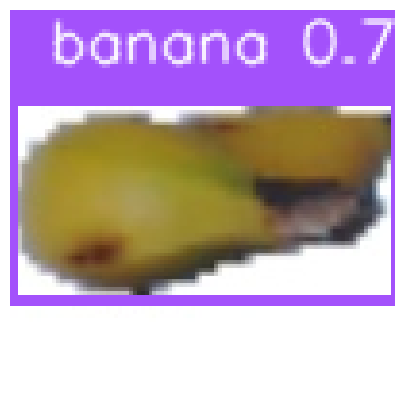

Etiquetas generadas para r_279_100.jpg


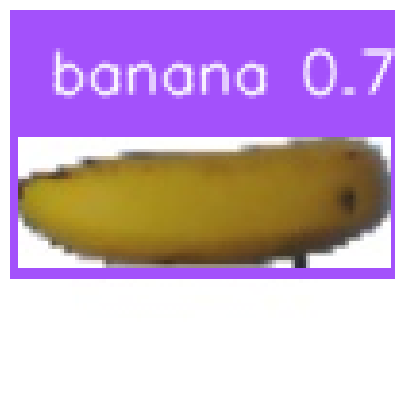

Etiquetas generadas para r_146_100.jpg


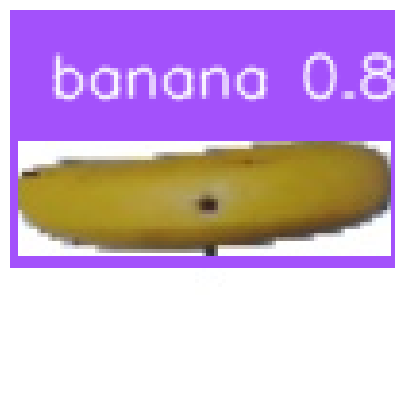

Etiquetas generadas para r_193_100.jpg


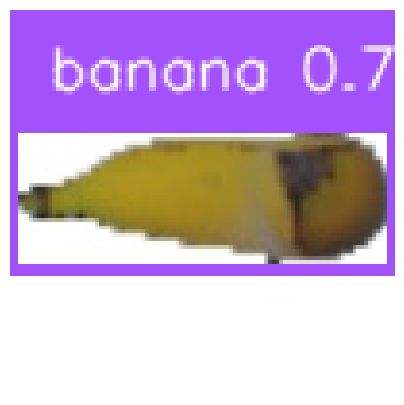

Etiquetas generadas para r_89_100.jpg


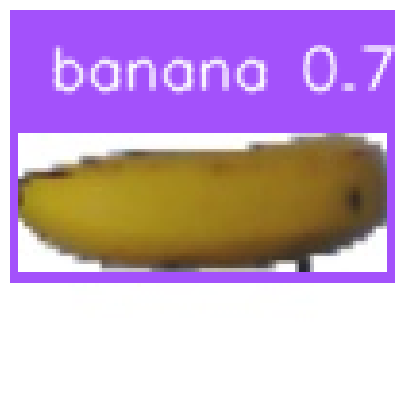

Etiquetas generadas para r_144_100.jpg


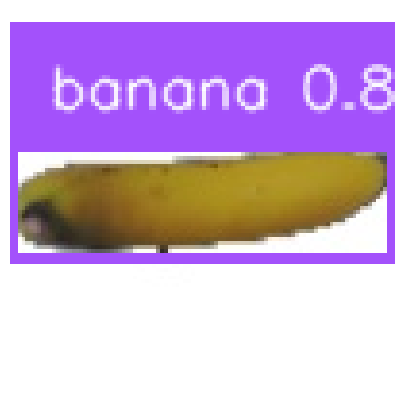

Etiquetas generadas para r_322_100.jpg


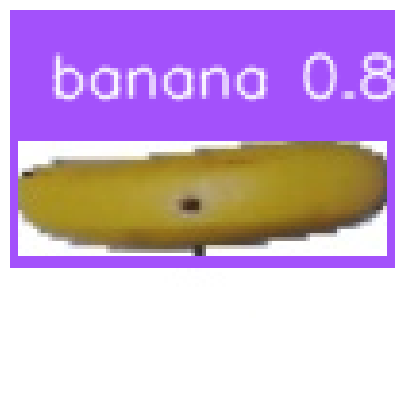

Etiquetas generadas para r_198_100.jpg


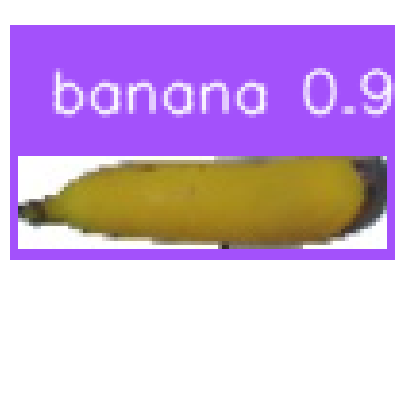

Etiquetas generadas para r_64_100.jpg


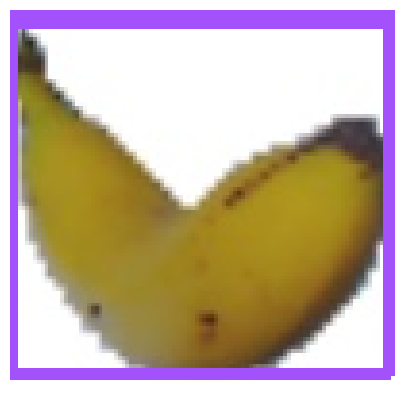

Etiquetas generadas para 145_100.jpg


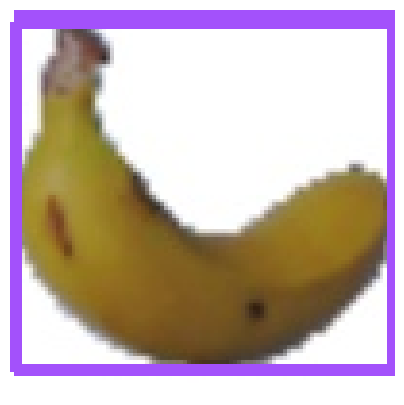

Etiquetas generadas para 55_100.jpg


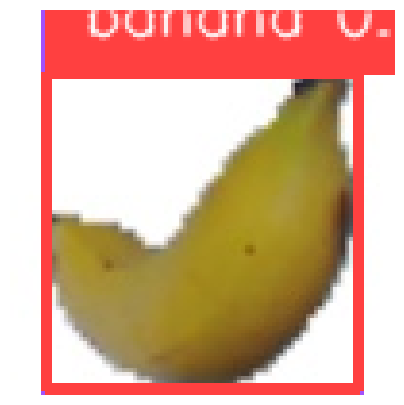

Etiquetas generadas para 288_100.jpg


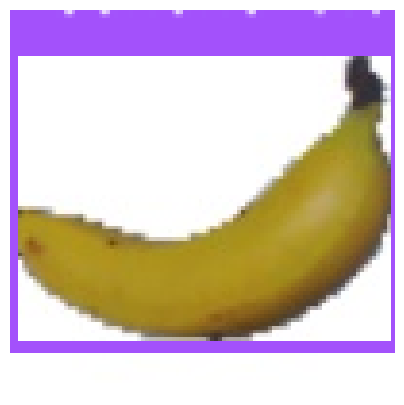

Etiquetas generadas para 264_100.jpg


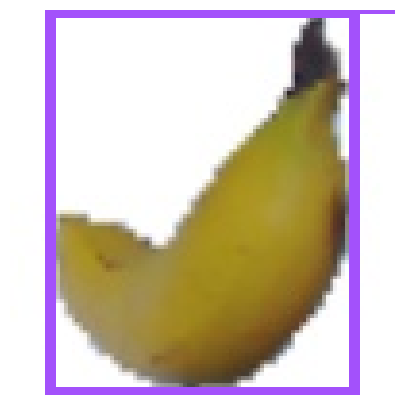

Etiquetas generadas para 7_100.jpg


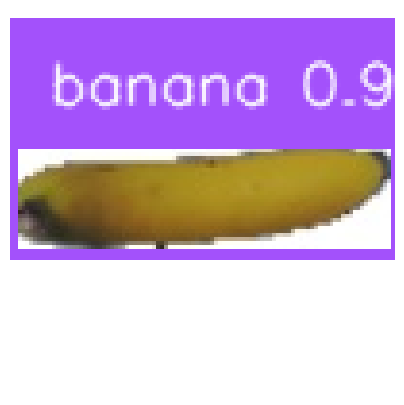

Etiquetas generadas para r_324_100.jpg


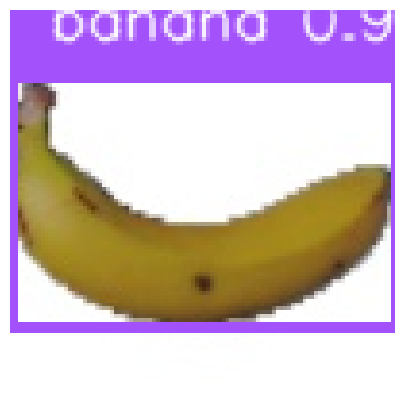

Etiquetas generadas para 76_100.jpg


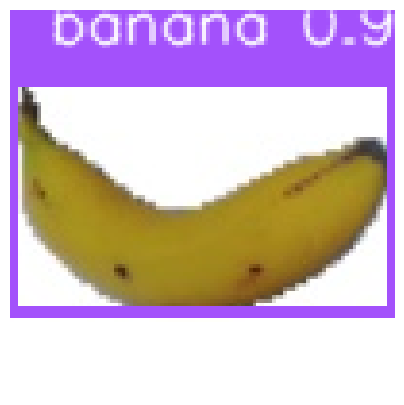

Etiquetas generadas para 129_100.jpg


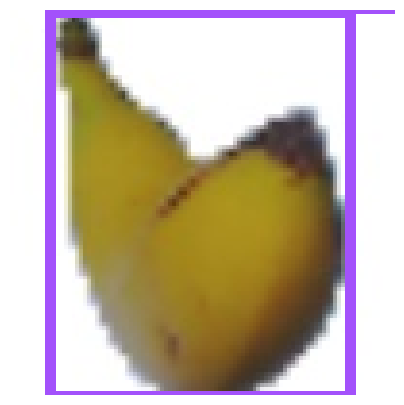

Etiquetas generadas para 155_100.jpg


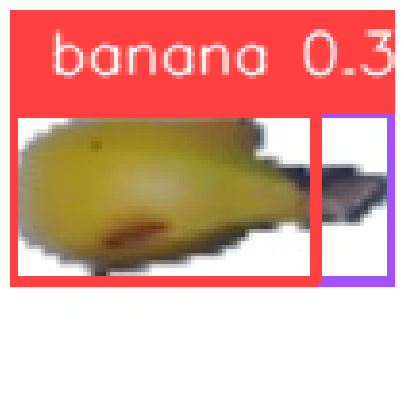

Etiquetas generadas para r_268_100.jpg


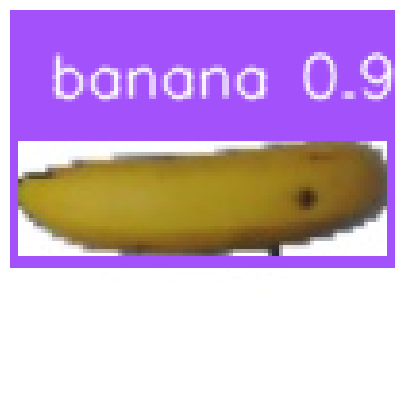

Etiquetas generadas para r_161_100.jpg


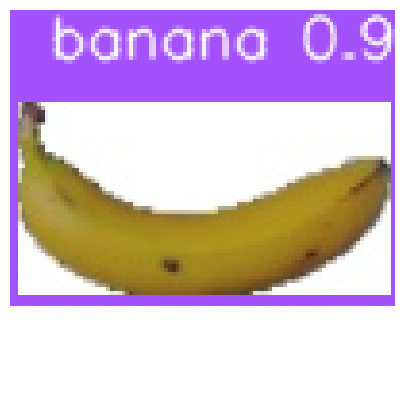

Etiquetas generadas para 92_100.jpg


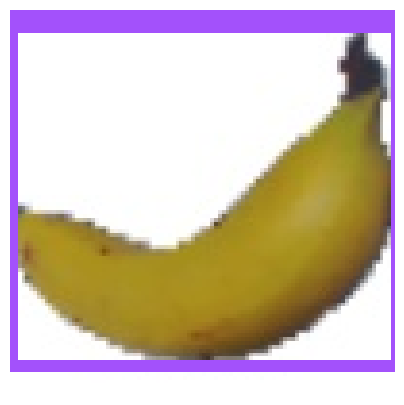

Etiquetas generadas para 274_100.jpg


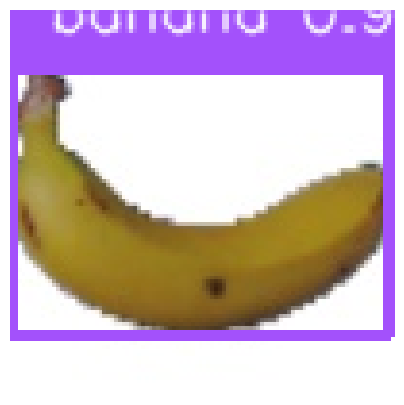

Etiquetas generadas para 70_100.jpg


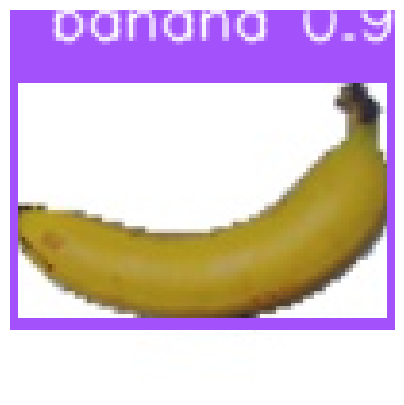

Etiquetas generadas para 242_100.jpg


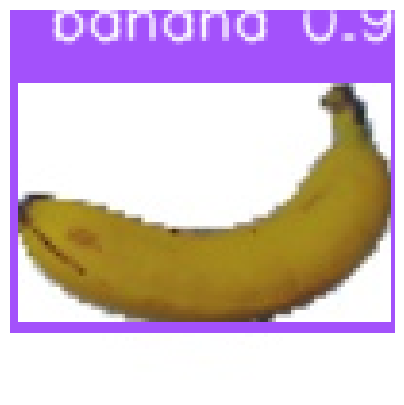

Etiquetas generadas para 216_100.jpg


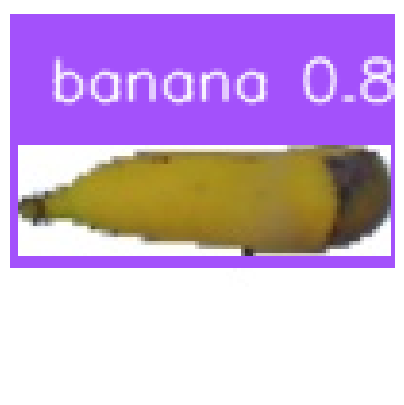

Etiquetas generadas para r_77_100.jpg


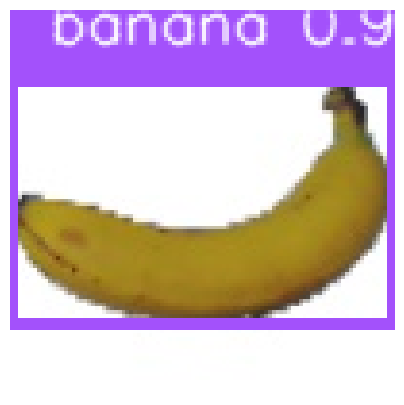

Etiquetas generadas para 221_100.jpg


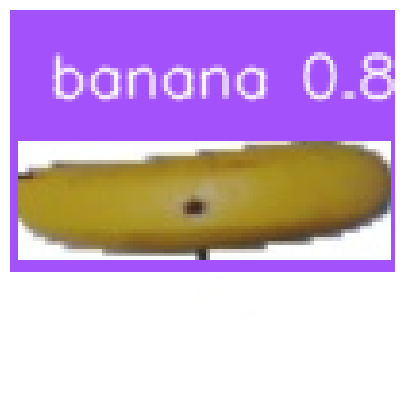

Etiquetas generadas para r_196_100.jpg


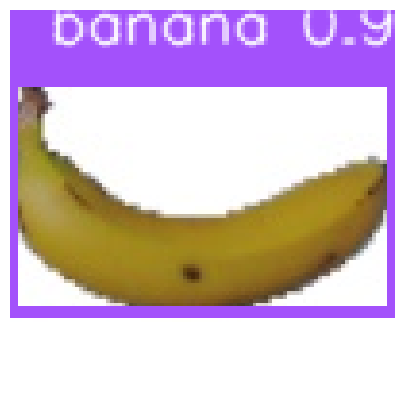

Etiquetas generadas para 82_100.jpg


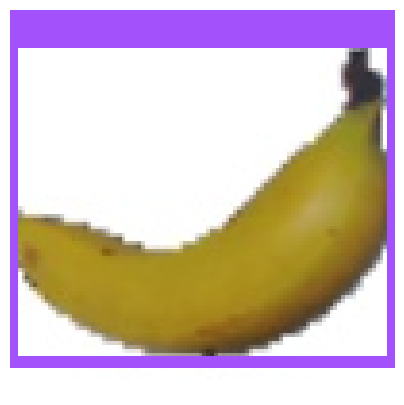

Etiquetas generadas para 270_100.jpg


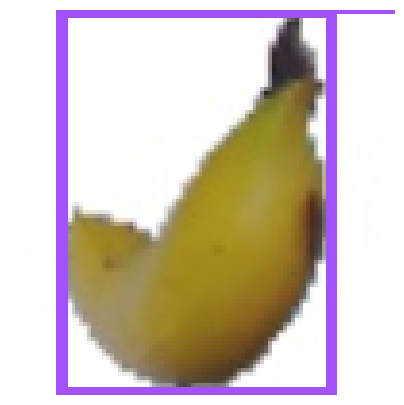

Etiquetas generadas para 293_100.jpg


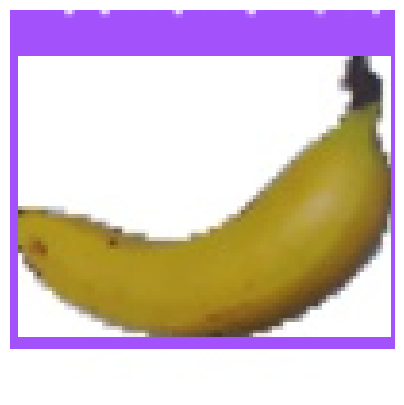

Etiquetas generadas para 265_100.jpg


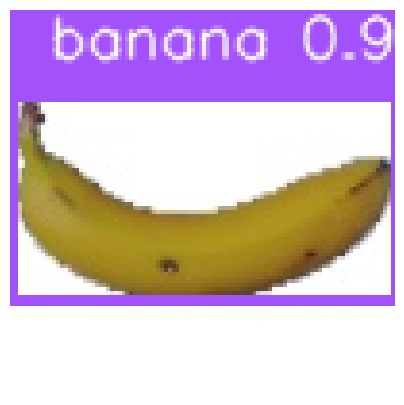

Etiquetas generadas para 94_100.jpg


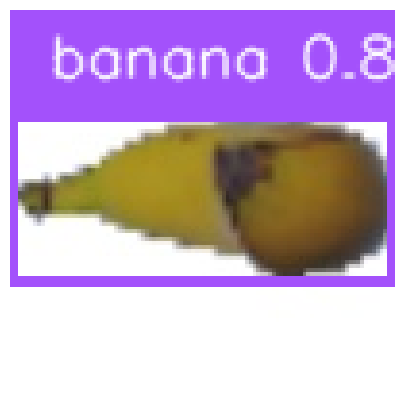

Etiquetas generadas para r_99_100.jpg


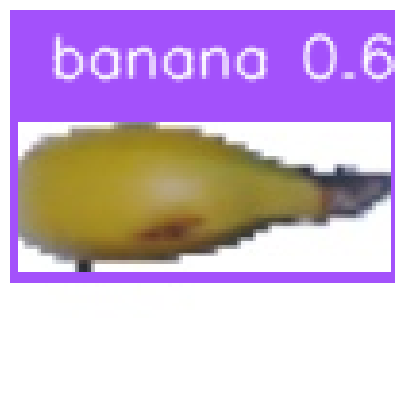

Etiquetas generadas para r_259_100.jpg


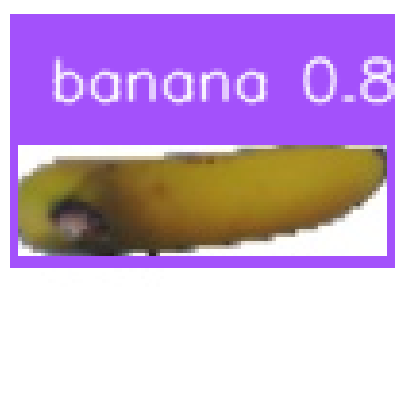

Etiquetas generadas para r_7_100.jpg


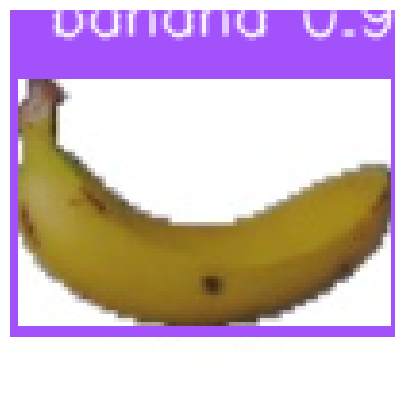

Etiquetas generadas para 73_100.jpg


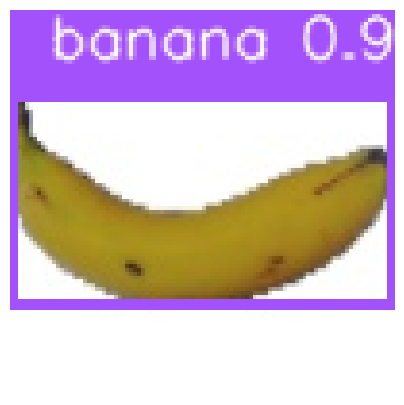

Etiquetas generadas para 117_100.jpg


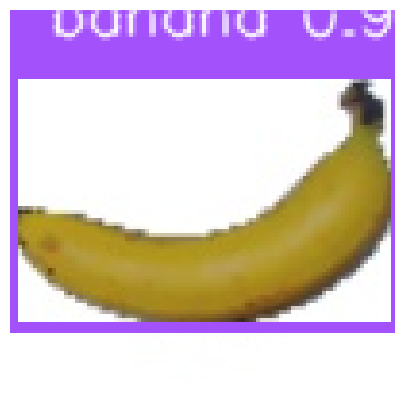

Etiquetas generadas para 246_100.jpg


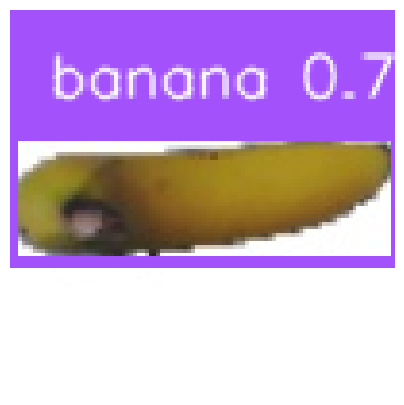

Etiquetas generadas para r_306_100.jpg


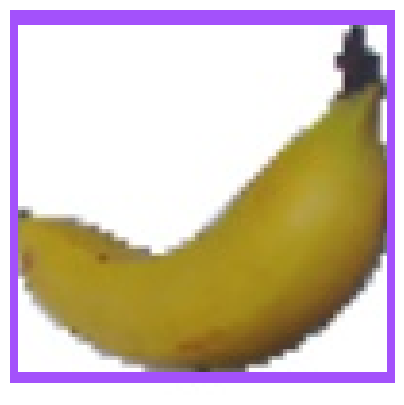

Etiquetas generadas para 275_100.jpg


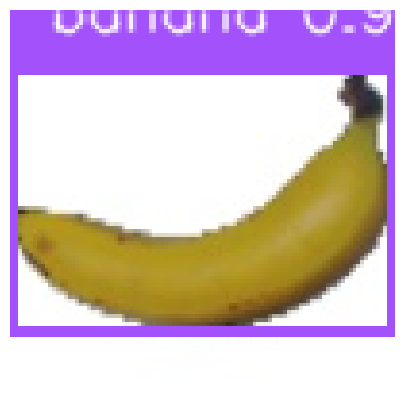

Etiquetas generadas para 255_100.jpg


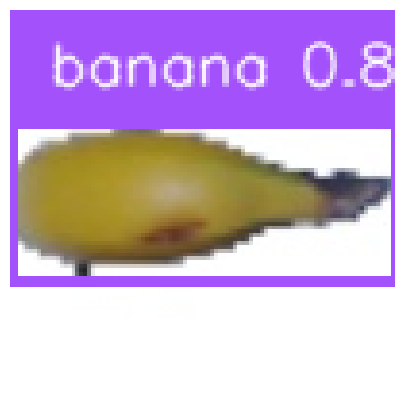

Etiquetas generadas para r_258_100.jpg


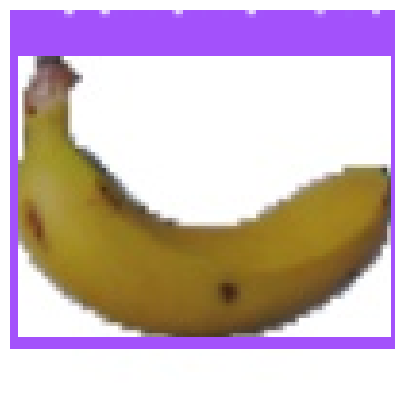

Etiquetas generadas para 66_100.jpg


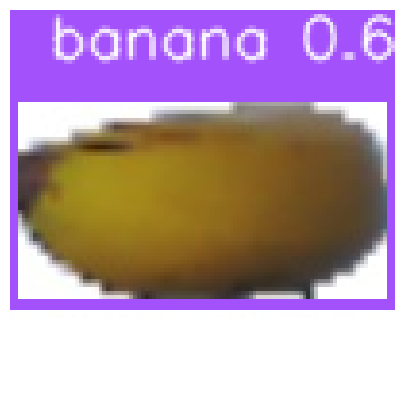

Etiquetas generadas para r_119_100.jpg


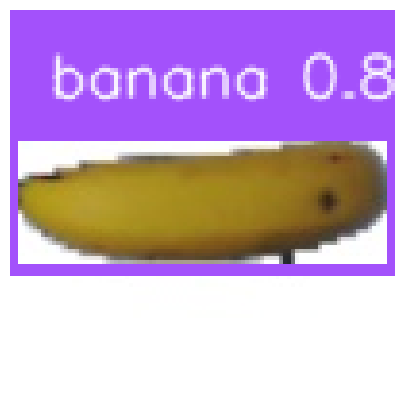

Etiquetas generadas para r_153_100.jpg


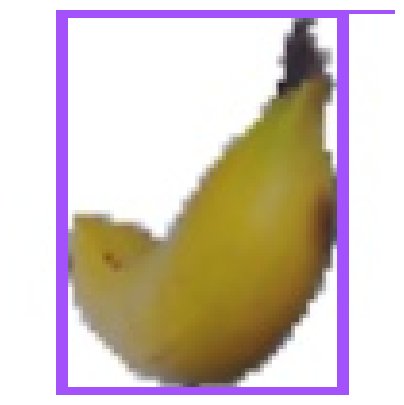

Etiquetas generadas para 292_100.jpg


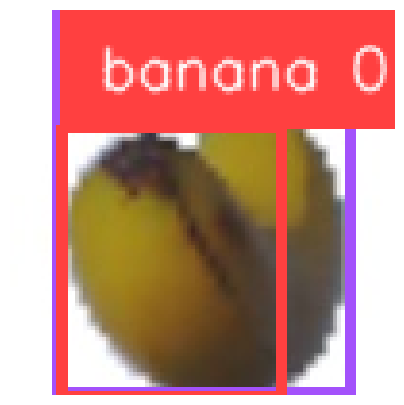

Etiquetas generadas para 174_100.jpg


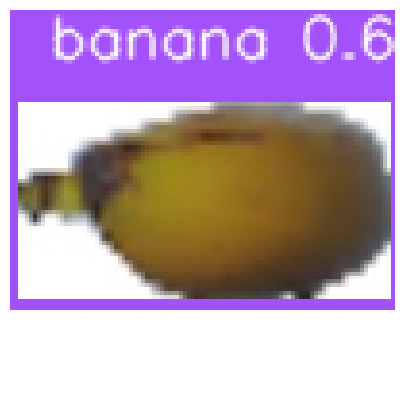

Etiquetas generadas para r_111_100.jpg


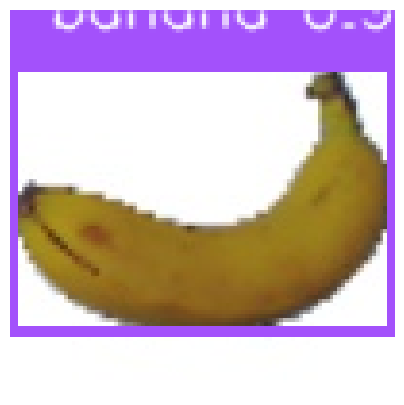

Etiquetas generadas para 206_100.jpg


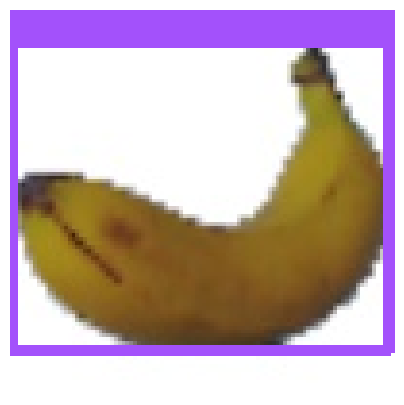

Etiquetas generadas para 195_100.jpg


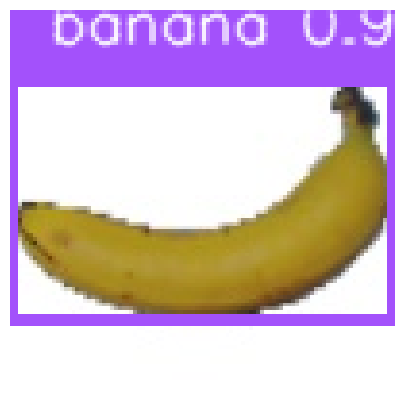

Etiquetas generadas para 234_100.jpg


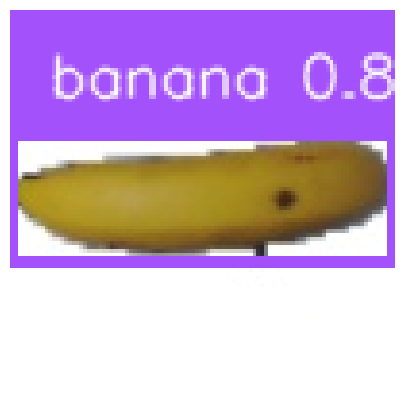

Etiquetas generadas para r_168_100.jpg


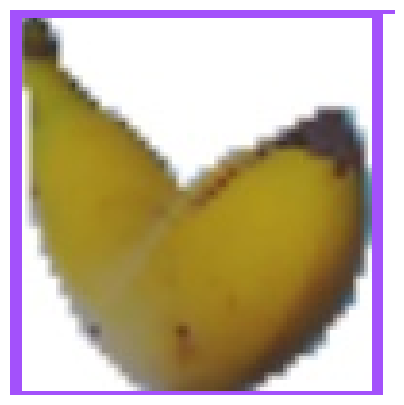

Etiquetas generadas para 150_100.jpg


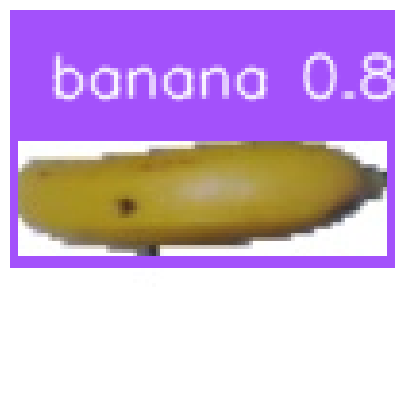

Etiquetas generadas para r_214_100.jpg


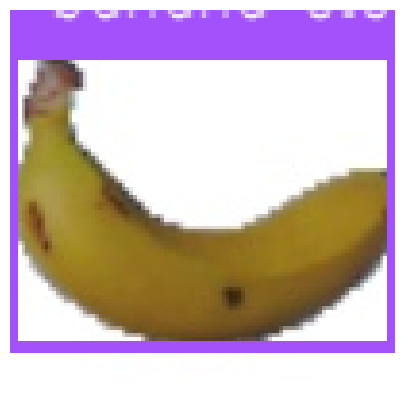

Etiquetas generadas para 65_100.jpg


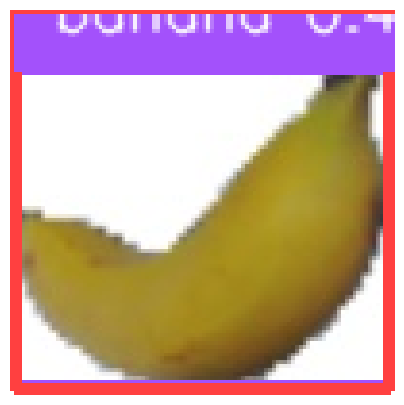

Etiquetas generadas para 281_100.jpg


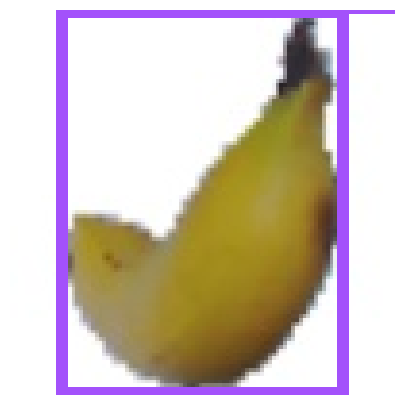

Etiquetas generadas para 9_100.jpg


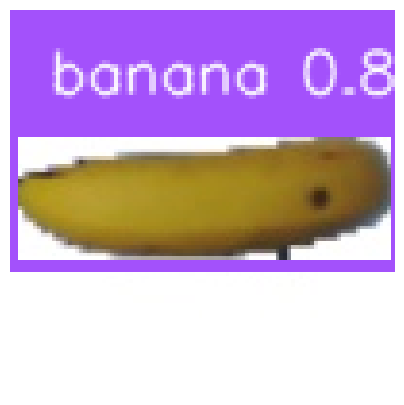

Etiquetas generadas para r_157_100.jpg


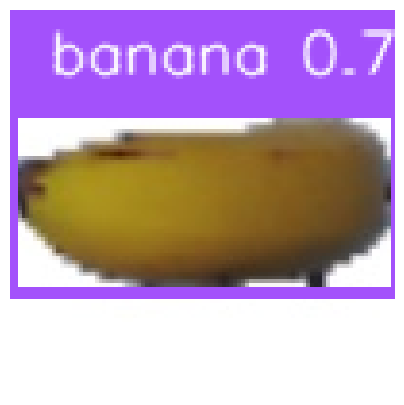

Etiquetas generadas para r_127_100.jpg


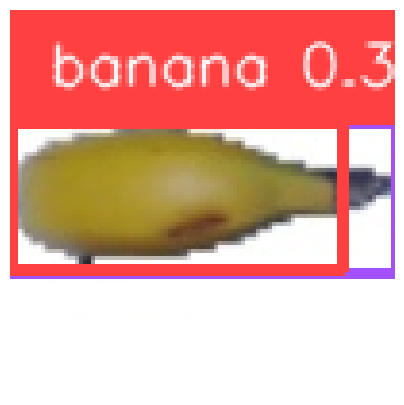

Etiquetas generadas para r_253_100.jpg


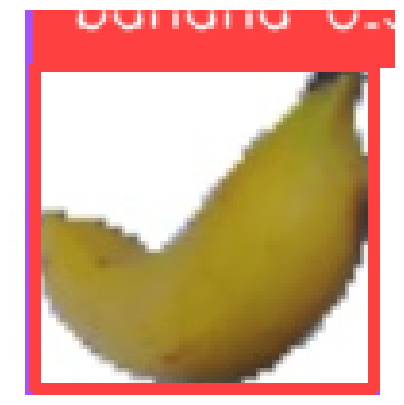

Etiquetas generadas para 285_100.jpg


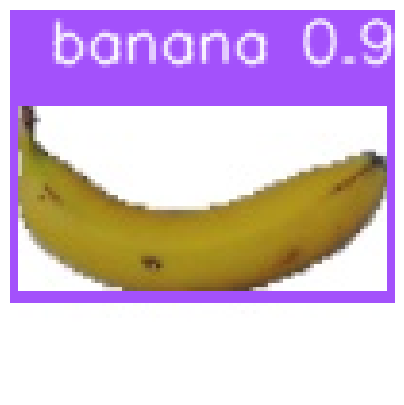

Etiquetas generadas para 104_100.jpg


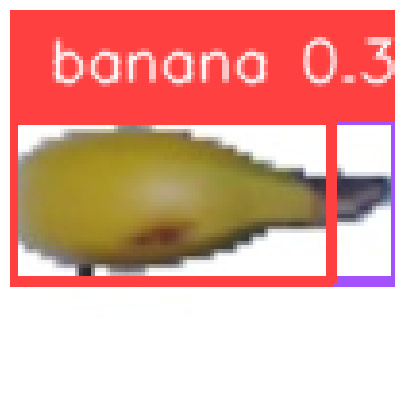

Etiquetas generadas para r_261_100.jpg


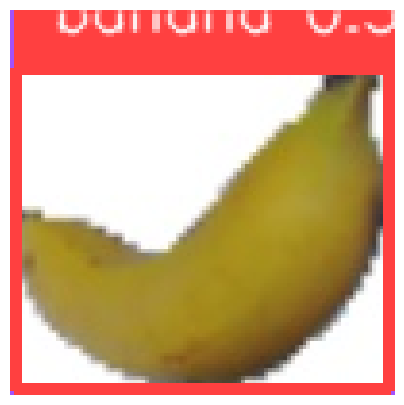

Etiquetas generadas para 1_100.jpg


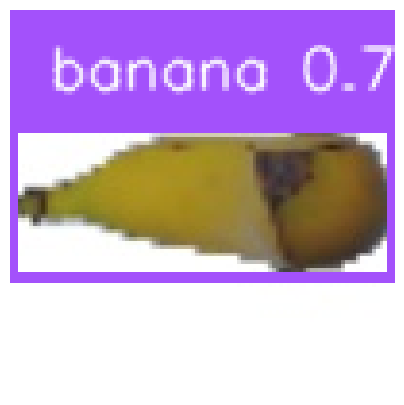

Etiquetas generadas para r_93_100.jpg


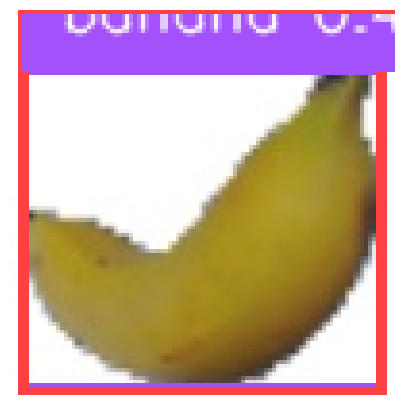

Etiquetas generadas para 283_100.jpg


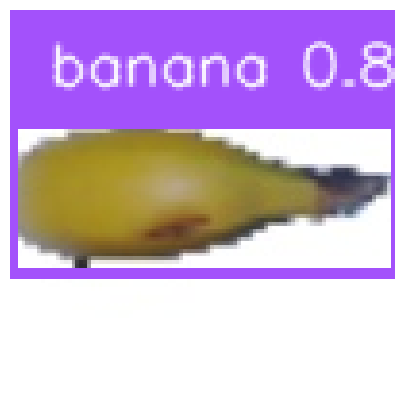

Etiquetas generadas para r_257_100.jpg


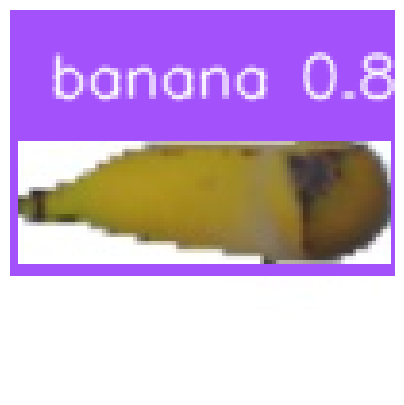

Etiquetas generadas para r_87_100.jpg


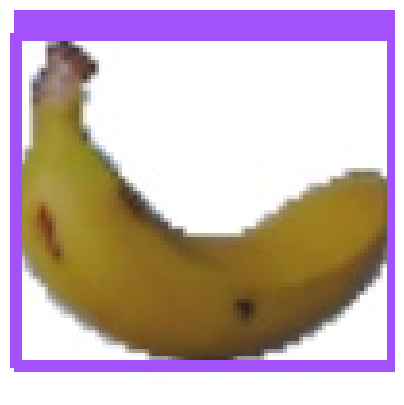

Etiquetas generadas para 59_100.jpg


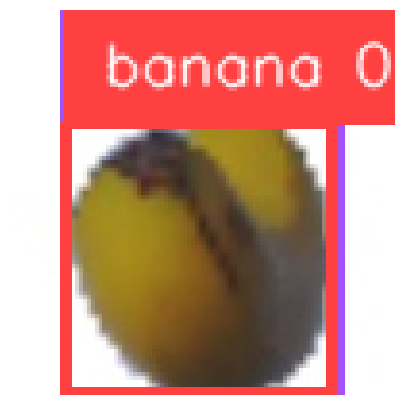

Etiquetas generadas para 172_100.jpg


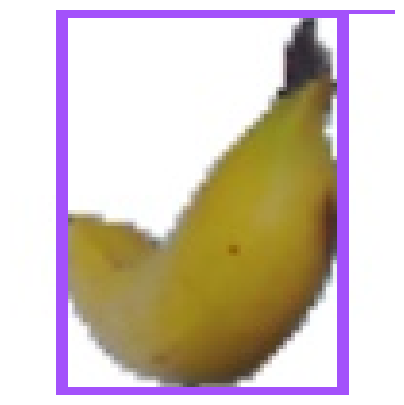

Etiquetas generadas para 291_100.jpg


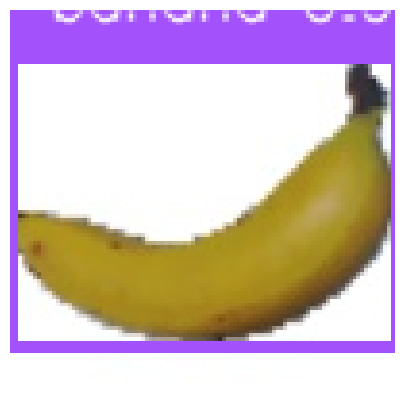

Etiquetas generadas para 263_100.jpg


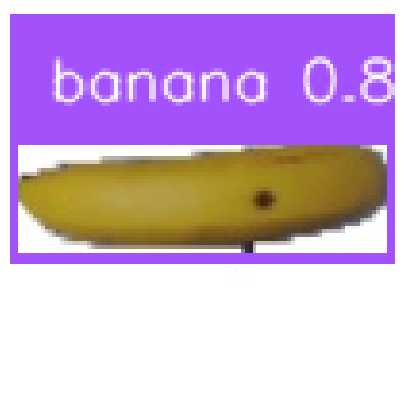

Etiquetas generadas para r_175_100.jpg


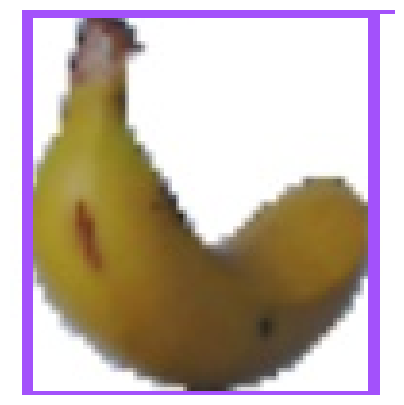

Etiquetas generadas para 47_100.jpg


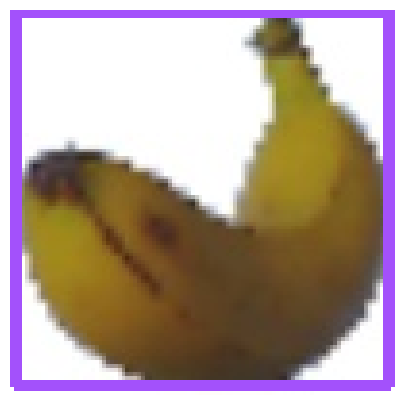

Etiquetas generadas para 184_100.jpg


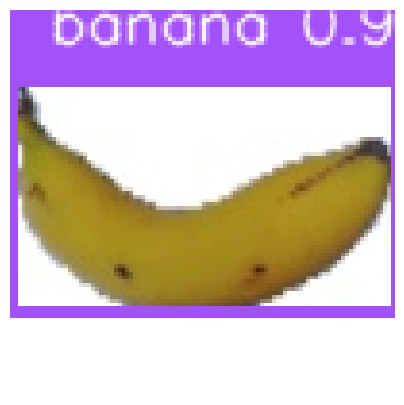

Etiquetas generadas para 128_100.jpg


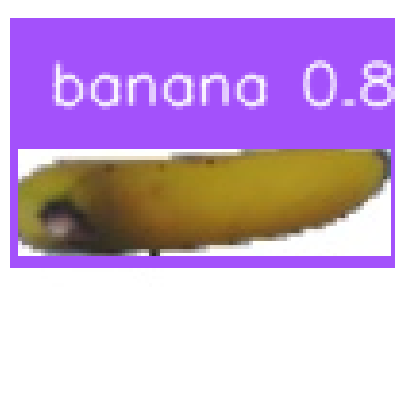

Etiquetas generadas para r_312_100.jpg


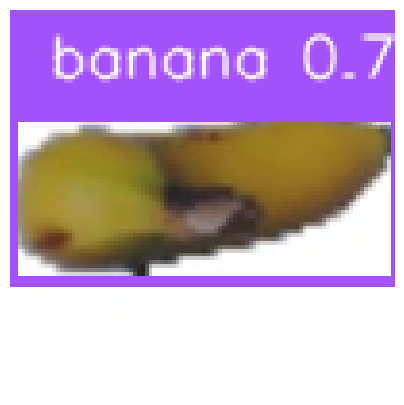

Etiquetas generadas para r_288_100.jpg


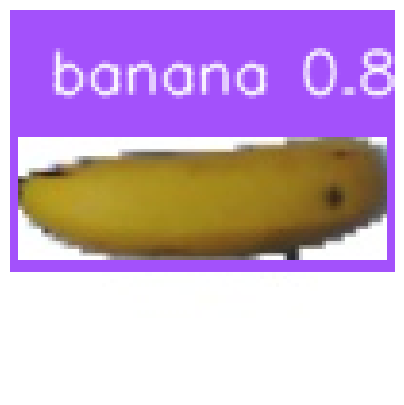

Etiquetas generadas para r_152_100.jpg


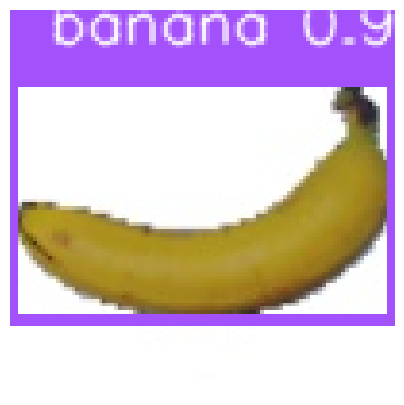

Etiquetas generadas para 235_100.jpg


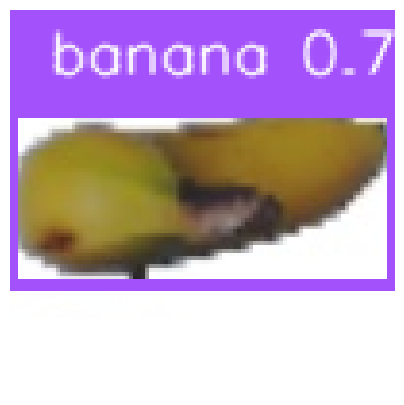

Etiquetas generadas para r_286_100.jpg


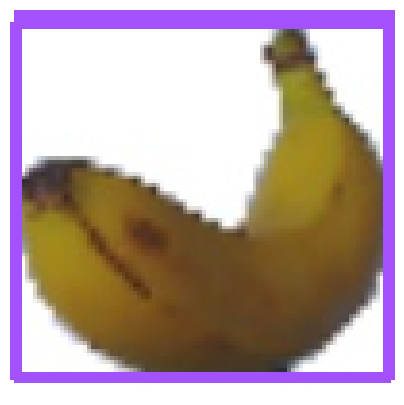

Etiquetas generadas para 187_100.jpg


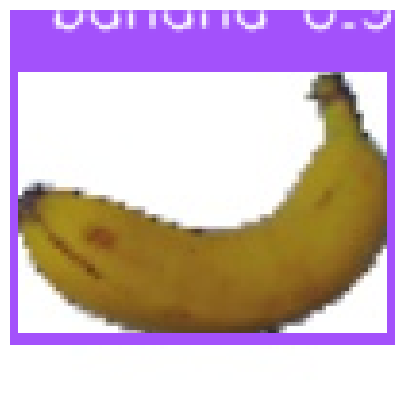

Etiquetas generadas para 205_100.jpg


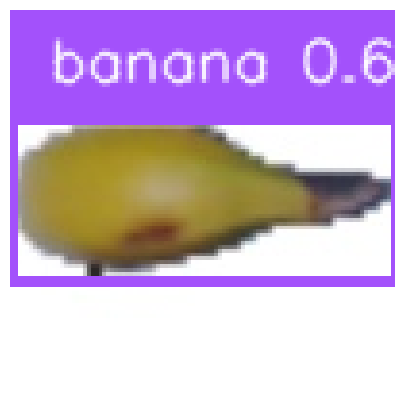

Etiquetas generadas para r_264_100.jpg


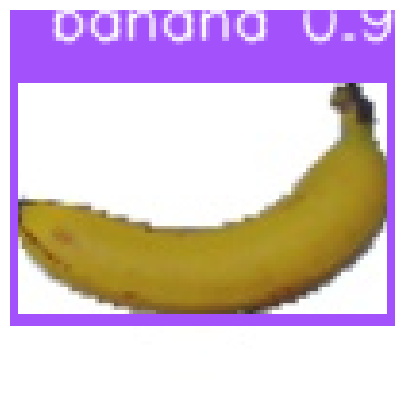

Etiquetas generadas para 230_100.jpg


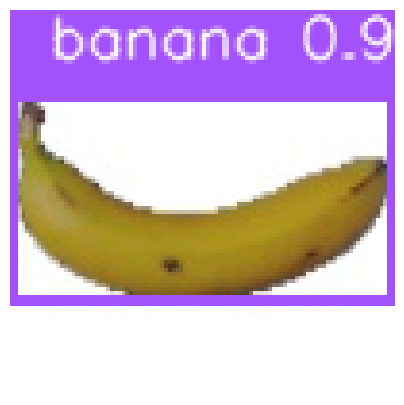

Etiquetas generadas para 91_100.jpg


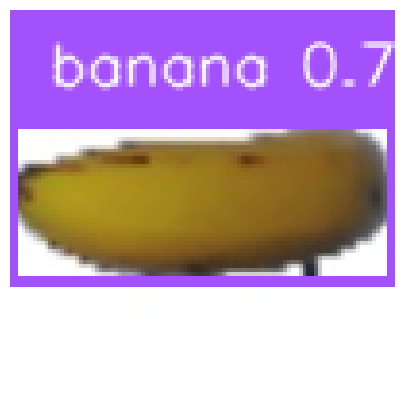

Etiquetas generadas para r_135_100.jpg


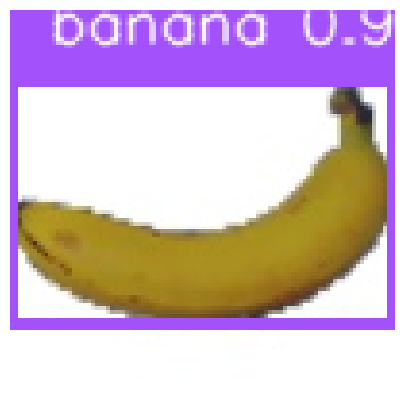

Etiquetas generadas para 226_100.jpg


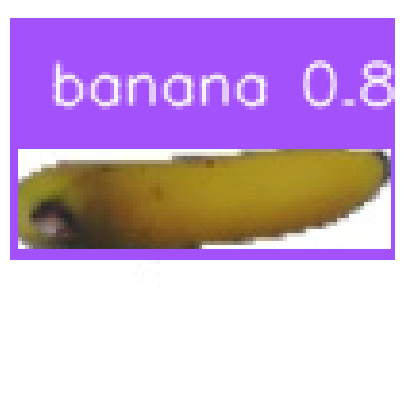

Etiquetas generadas para r_315_100.jpg


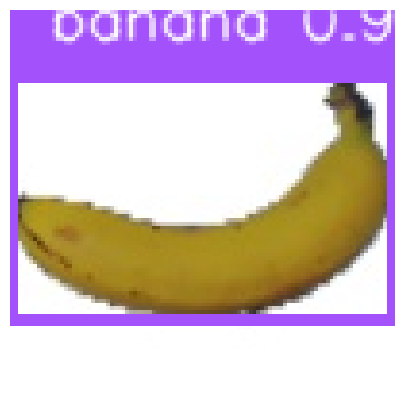

Etiquetas generadas para 225_100.jpg


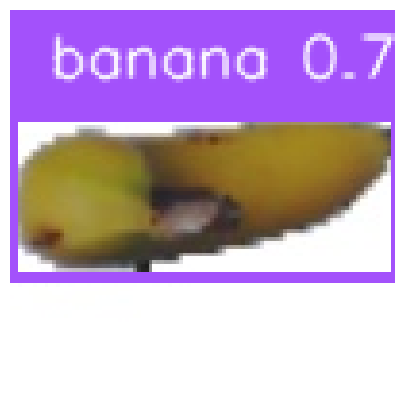

Etiquetas generadas para r_290_100.jpg


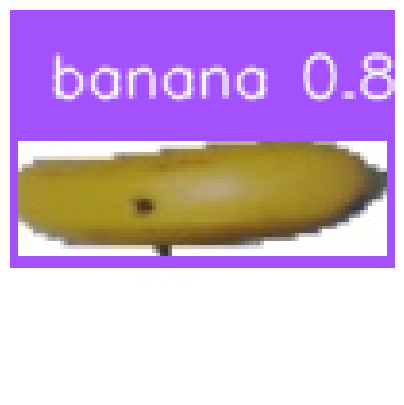

Etiquetas generadas para r_209_100.jpg


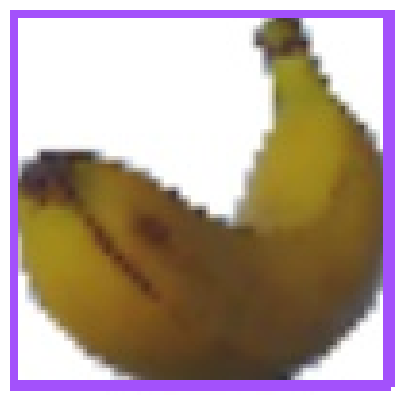

Etiquetas generadas para 185_100.jpg


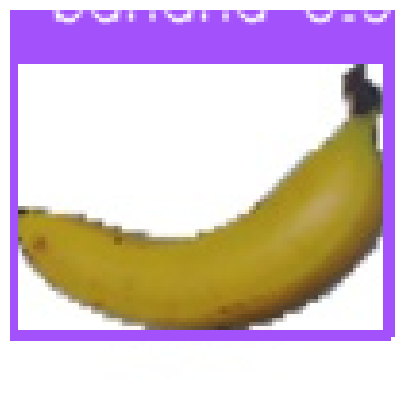

Etiquetas generadas para 259_100.jpg


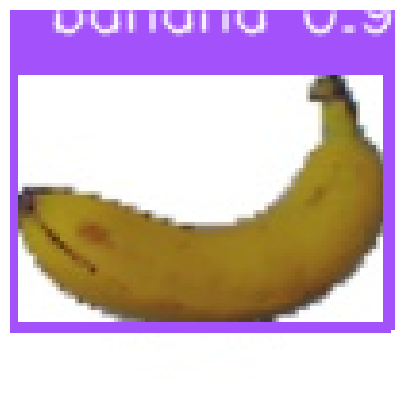

Etiquetas generadas para 208_100.jpg


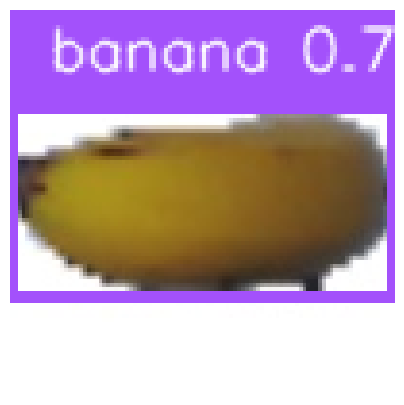

Etiquetas generadas para r_124_100.jpg


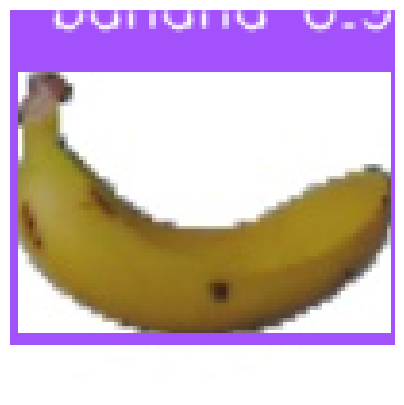

Etiquetas generadas para 69_100.jpg


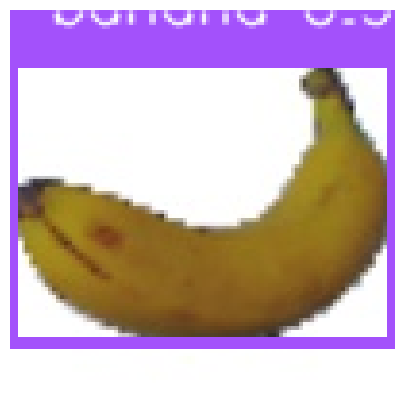

Etiquetas generadas para 201_100.jpg


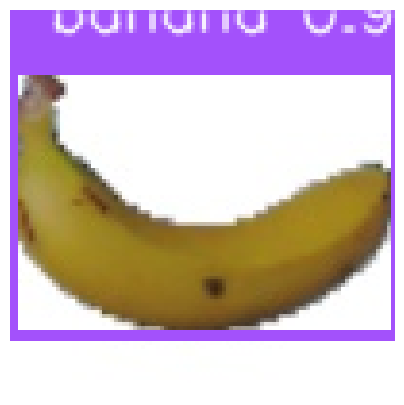

Etiquetas generadas para 71_100.jpg


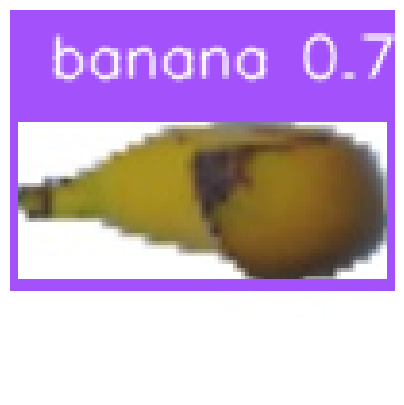

Etiquetas generadas para r_101_100.jpg


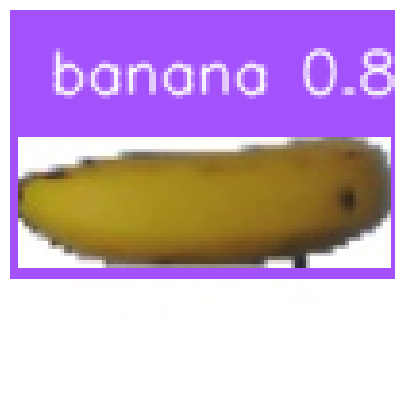

Etiquetas generadas para r_147_100.jpg


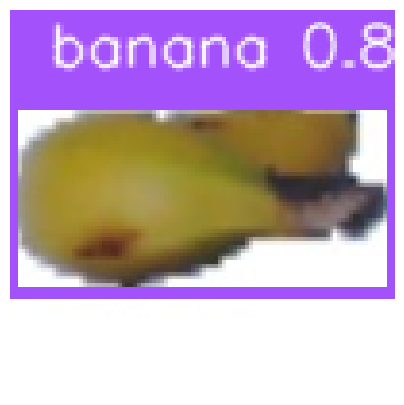

Etiquetas generadas para r_276_100.jpg


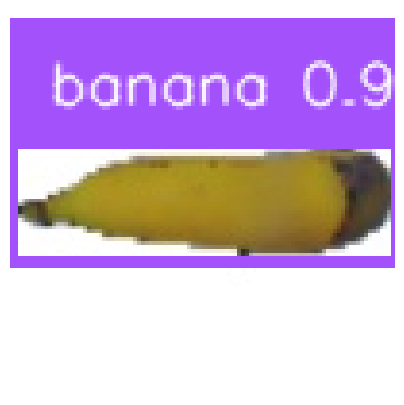

Etiquetas generadas para r_74_100.jpg


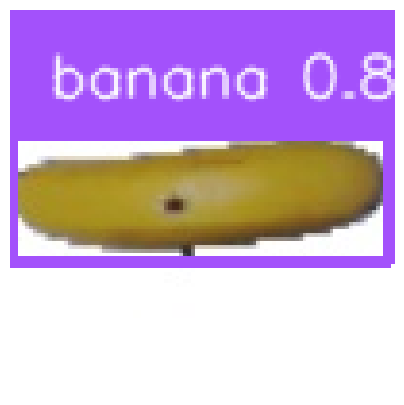

Etiquetas generadas para r_201_100.jpg


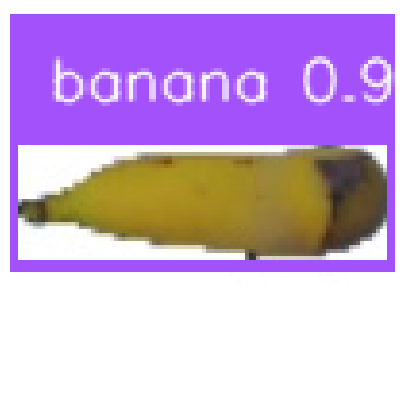

Etiquetas generadas para r_79_100.jpg


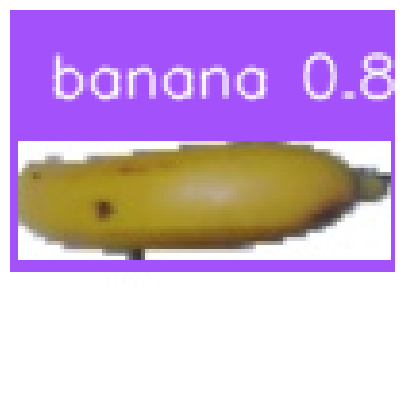

Etiquetas generadas para r_220_100.jpg


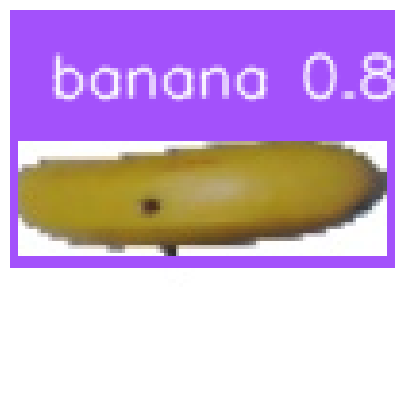

Etiquetas generadas para r_208_100.jpg


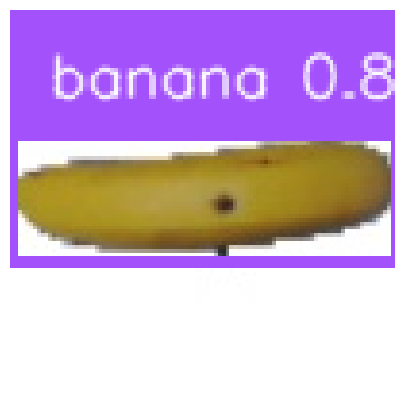

Etiquetas generadas para r_188_100.jpg


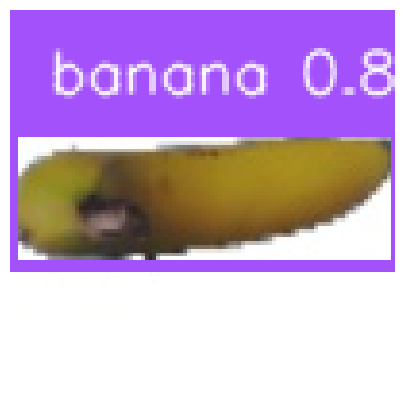

Etiquetas generadas para r_0_100.jpg


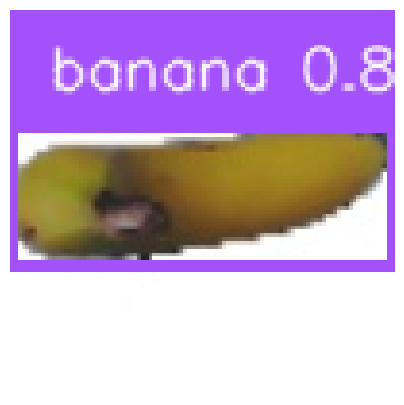

Etiquetas generadas para r_298_100.jpg


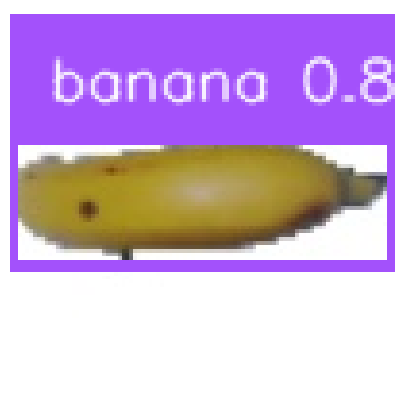

Etiquetas generadas para r_224_100.jpg


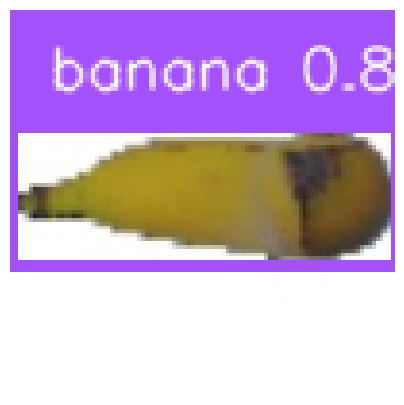

Etiquetas generadas para r_88_100.jpg


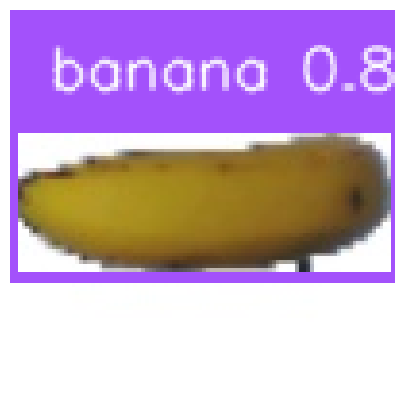

Etiquetas generadas para r_142_100.jpg


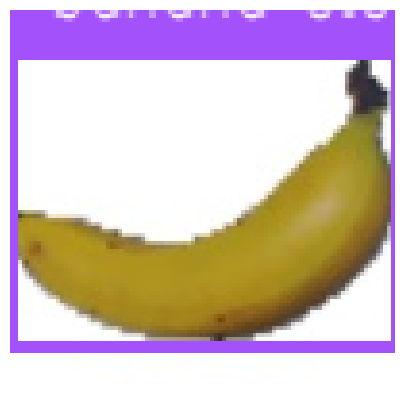

Etiquetas generadas para 262_100.jpg


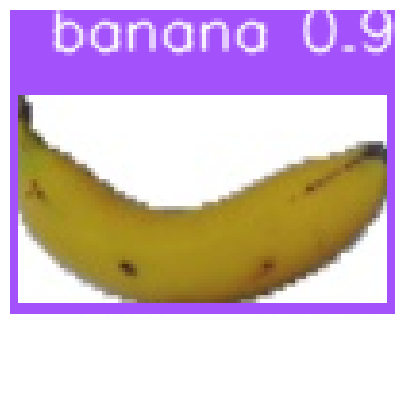

Etiquetas generadas para 122_100.jpg


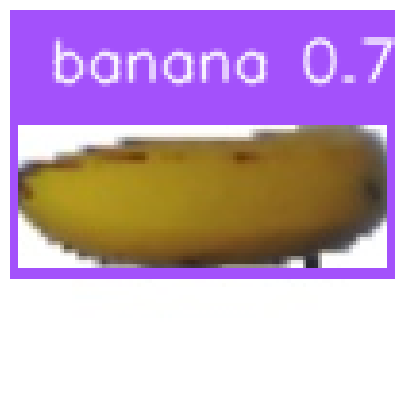

Etiquetas generadas para r_137_100.jpg


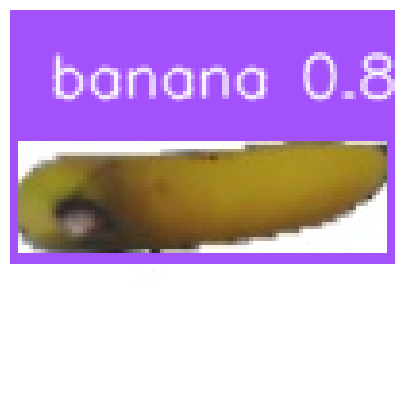

Etiquetas generadas para r_308_100.jpg


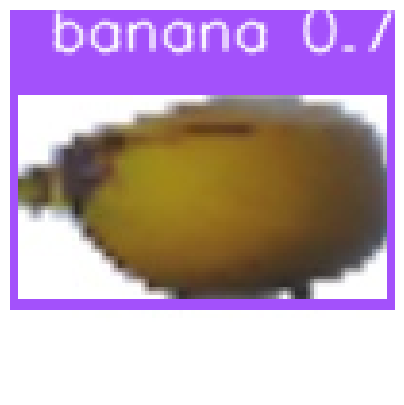

Etiquetas generadas para r_112_100.jpg


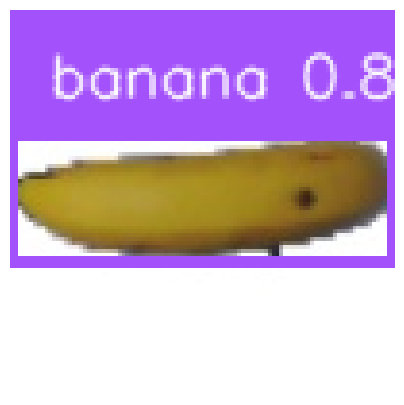

Etiquetas generadas para r_162_100.jpg


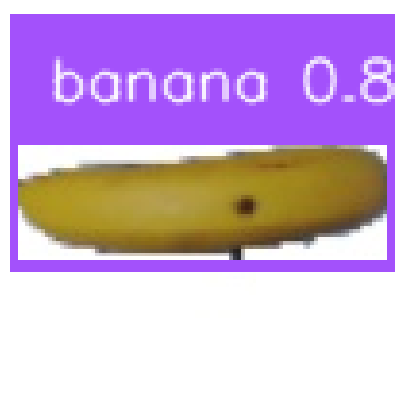

Etiquetas generadas para r_181_100.jpg


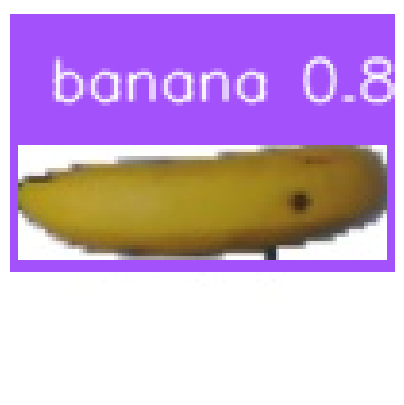

Etiquetas generadas para r_163_100.jpg


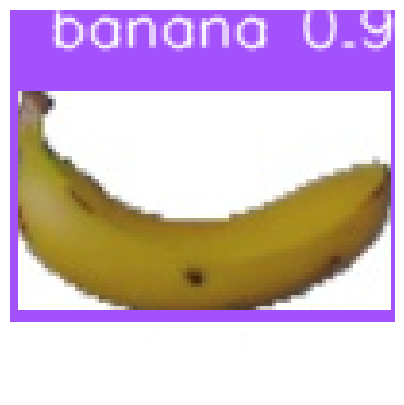

Etiquetas generadas para 81_100.jpg


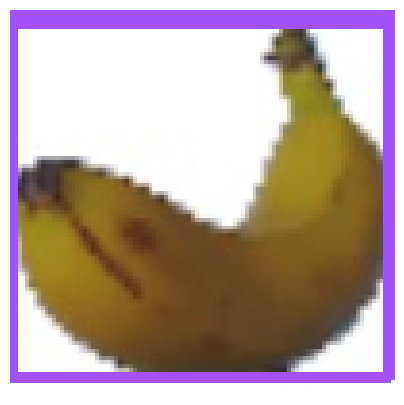

Etiquetas generadas para 188_100.jpg


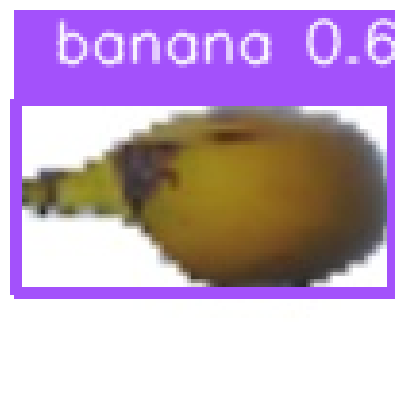

Etiquetas generadas para r_108_100.jpg


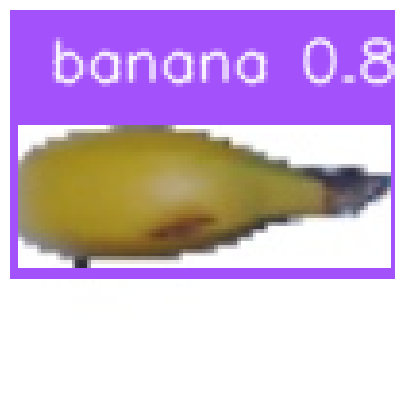

Etiquetas generadas para r_256_100.jpg


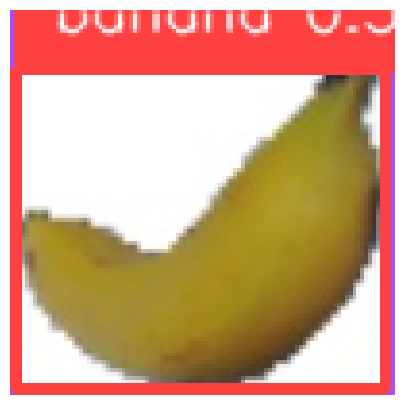

Etiquetas generadas para 282_100.jpg


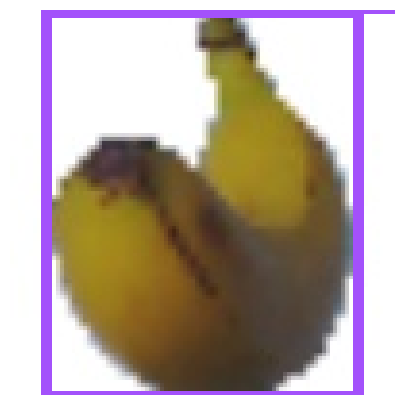

Etiquetas generadas para 176_100.jpg


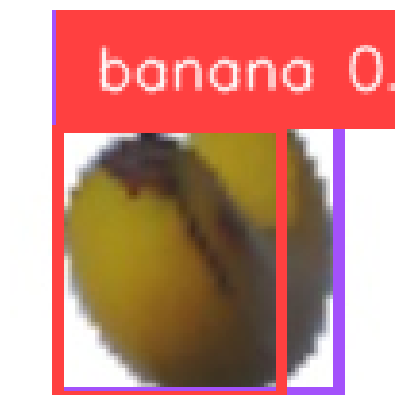

Etiquetas generadas para 173_100.jpg


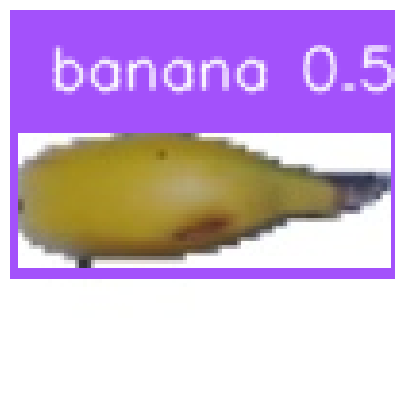

Etiquetas generadas para r_251_100.jpg


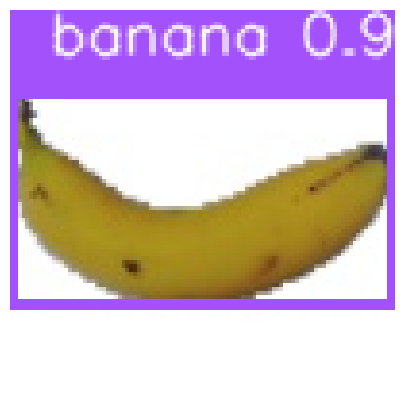

Etiquetas generadas para 120_100.jpg


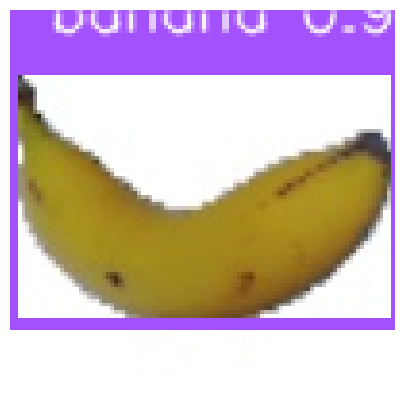

Etiquetas generadas para 134_100.jpg


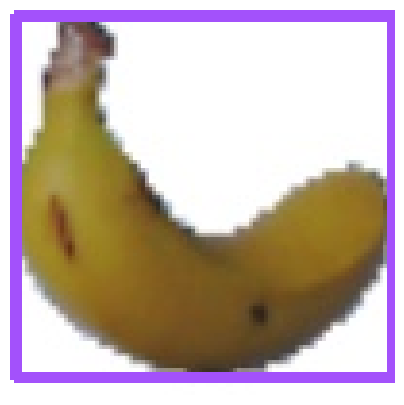

Etiquetas generadas para 53_100.jpg


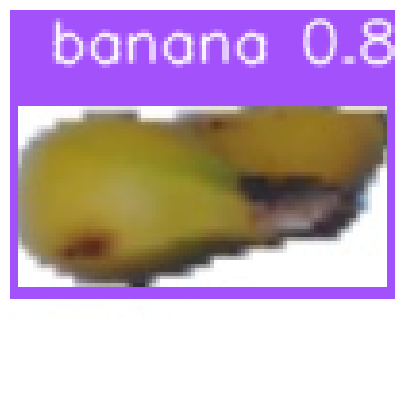

Etiquetas generadas para r_280_100.jpg


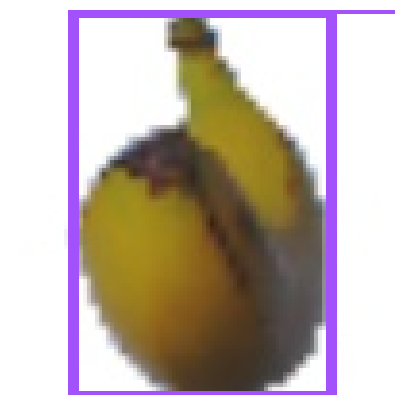

Etiquetas generadas para 171_100.jpg


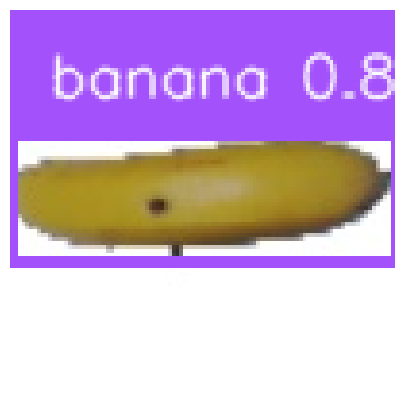

Etiquetas generadas para r_206_100.jpg


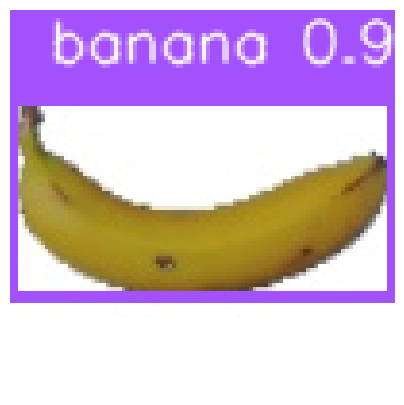

Etiquetas generadas para 96_100.jpg


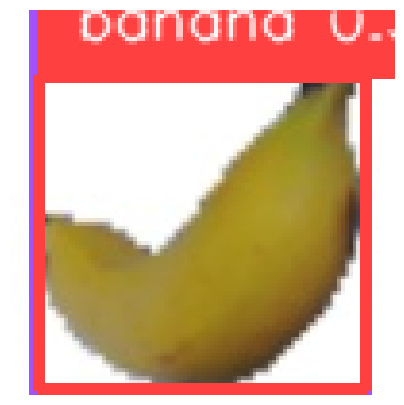

Etiquetas generadas para 286_100.jpg


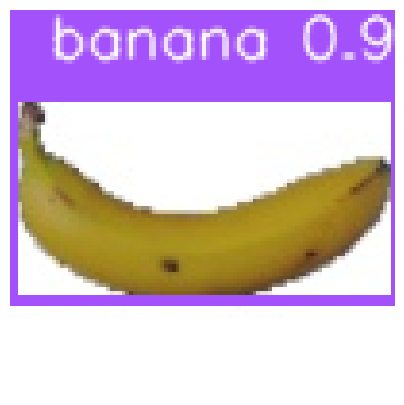

Etiquetas generadas para 93_100.jpg


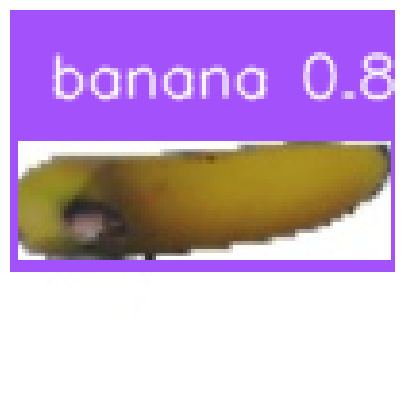

Etiquetas generadas para r_305_100.jpg


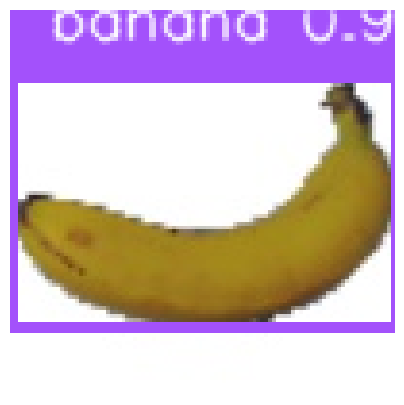

Etiquetas generadas para 217_100.jpg


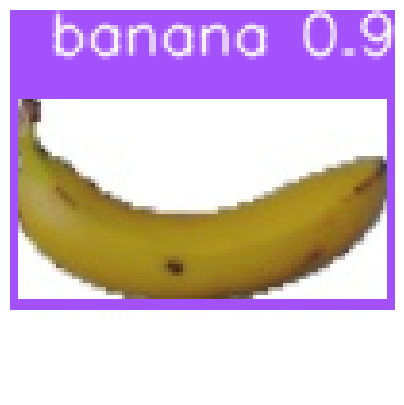

Etiquetas generadas para 88_100.jpg


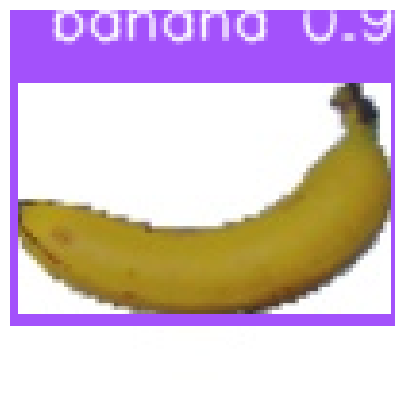

Etiquetas generadas para 231_100.jpg


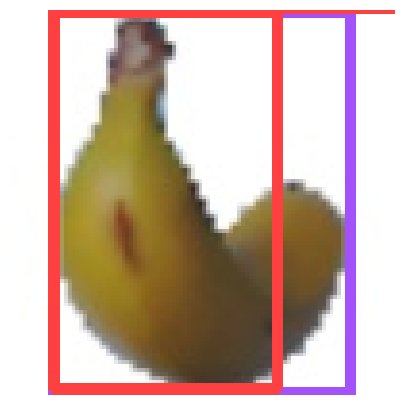

Etiquetas generadas para 41_100.jpg


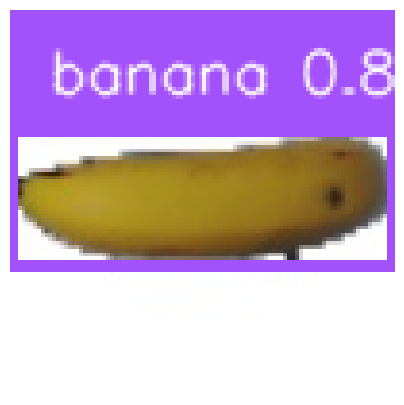

Etiquetas generadas para r_151_100.jpg


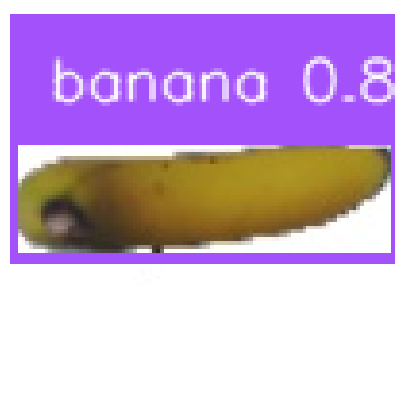

Etiquetas generadas para r_313_100.jpg


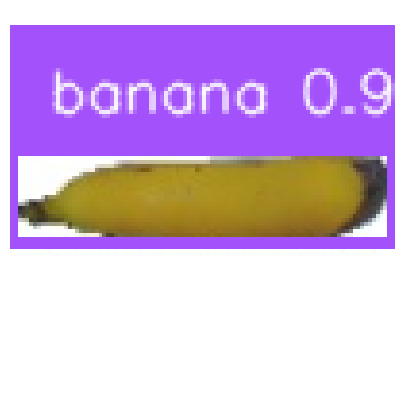

Etiquetas generadas para r_62_100.jpg


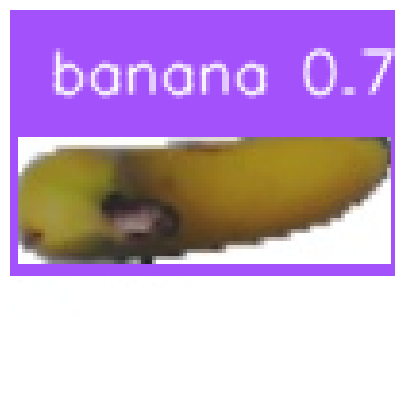

Etiquetas generadas para r_297_100.jpg


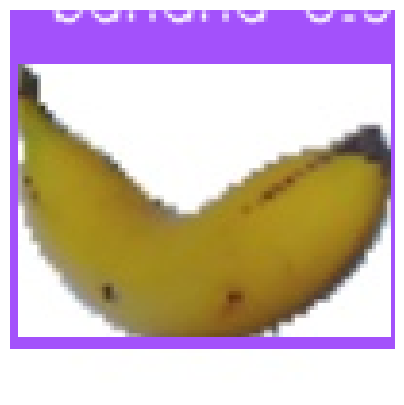

Etiquetas generadas para 138_100.jpg


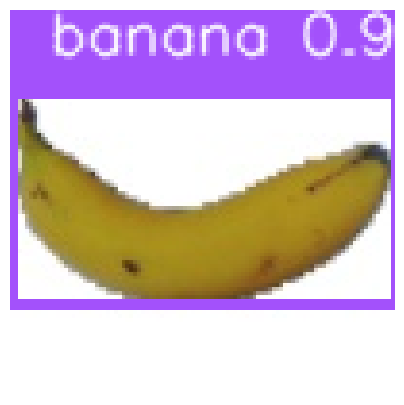

Etiquetas generadas para 121_100.jpg


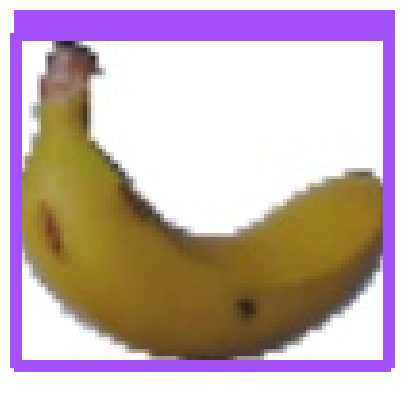

Etiquetas generadas para 58_100.jpg


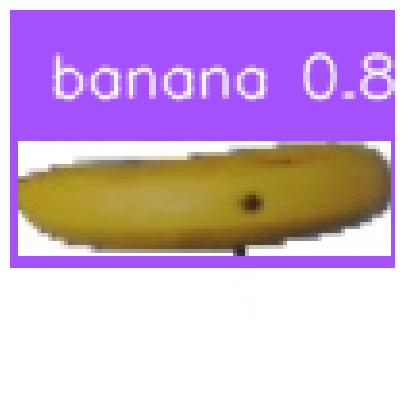

Etiquetas generadas para r_179_100.jpg


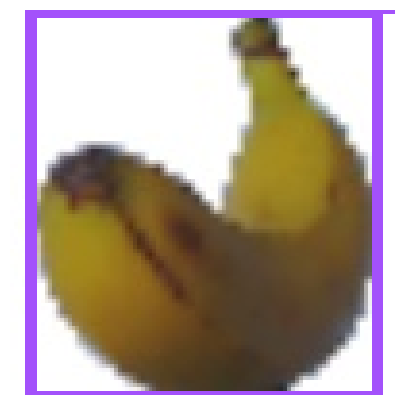

Etiquetas generadas para 181_100.jpg


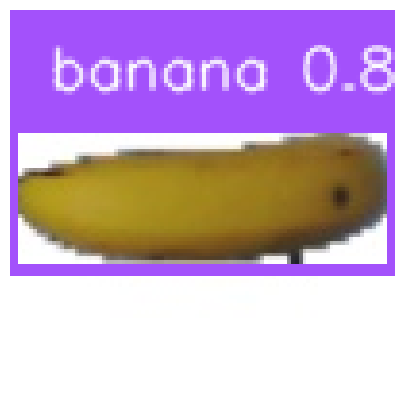

Etiquetas generadas para r_149_100.jpg


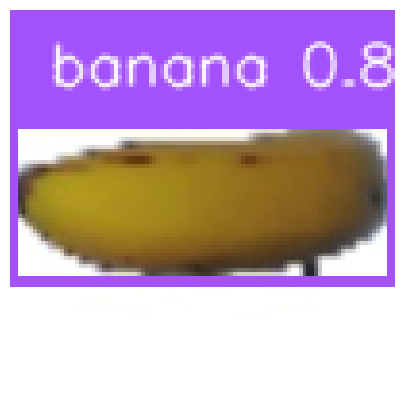

Etiquetas generadas para r_134_100.jpg


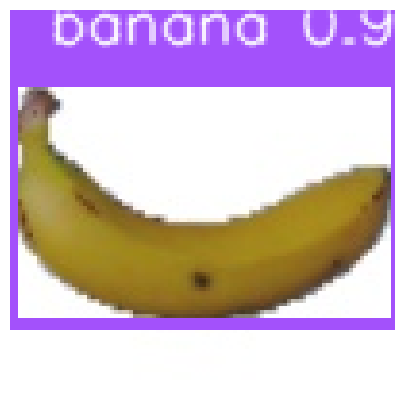

Etiquetas generadas para 78_100.jpg


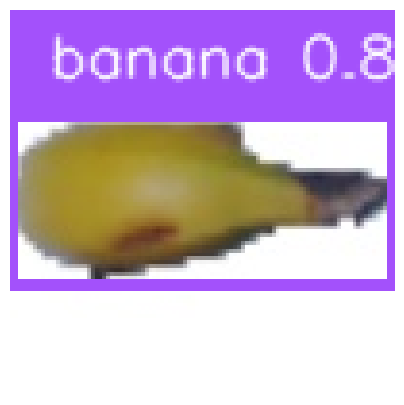

Etiquetas generadas para r_266_100.jpg


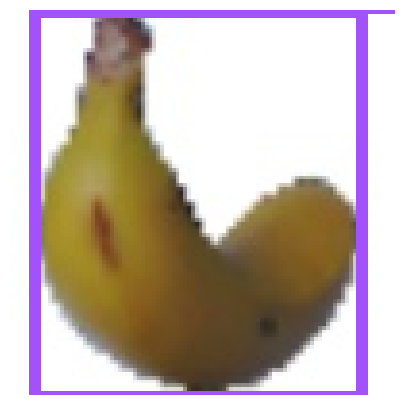

Etiquetas generadas para 44_100.jpg


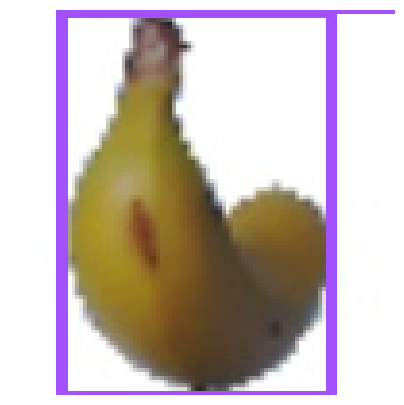

Etiquetas generadas para 324_100.jpg


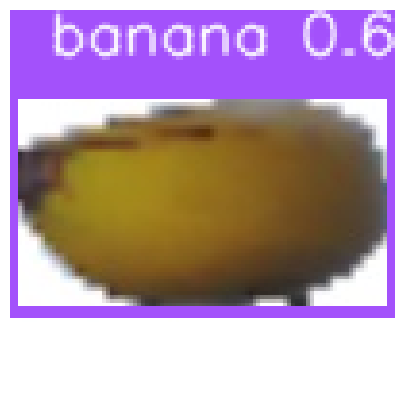

Etiquetas generadas para r_116_100.jpg


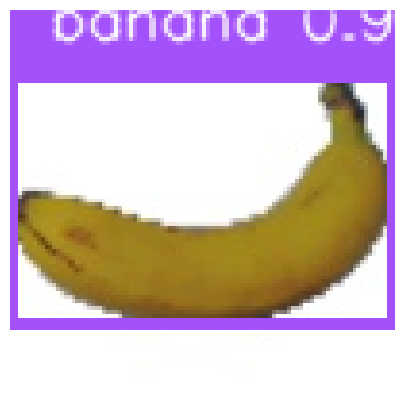

Etiquetas generadas para 215_100.jpg


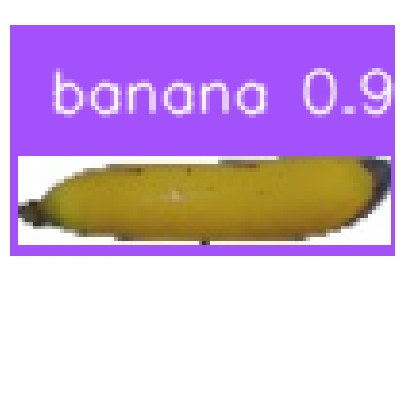

Etiquetas generadas para r_53_100.jpg


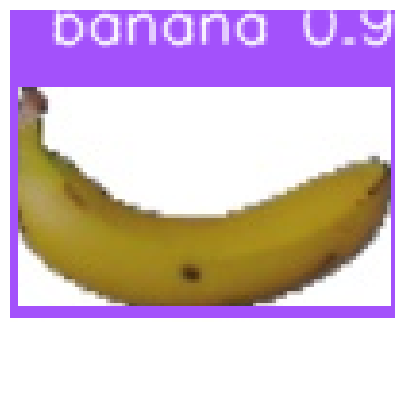

Etiquetas generadas para 83_100.jpg


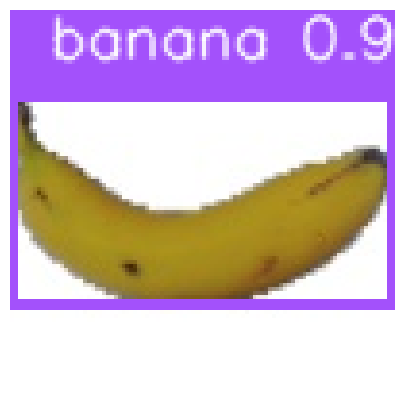

Etiquetas generadas para 119_100.jpg


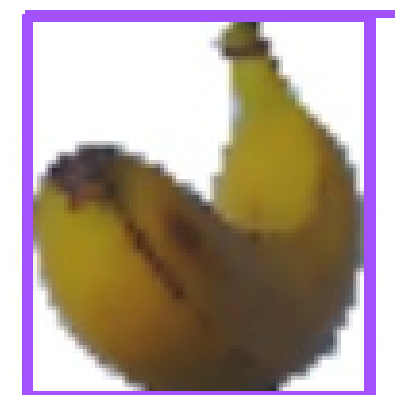

Etiquetas generadas para 180_100.jpg


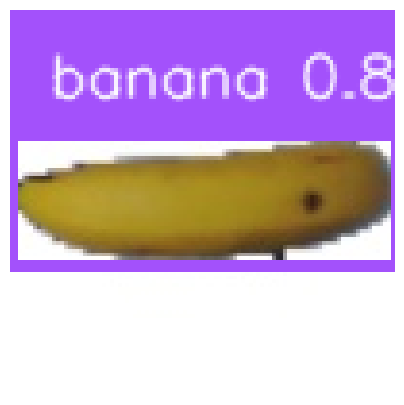

Etiquetas generadas para r_160_100.jpg


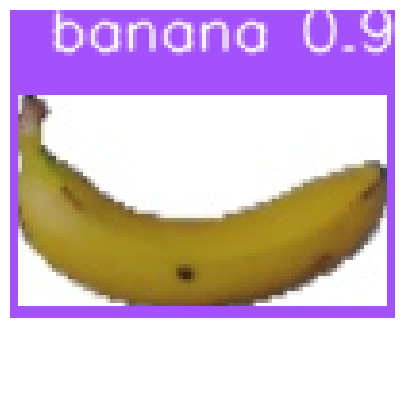

Etiquetas generadas para 85_100.jpg


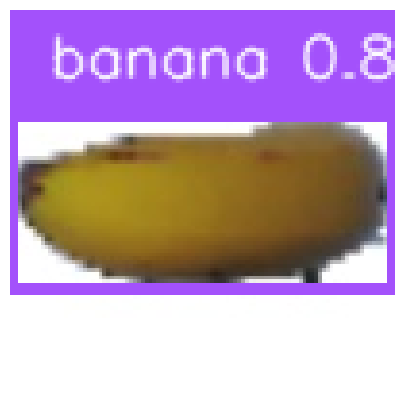

Etiquetas generadas para r_128_100.jpg


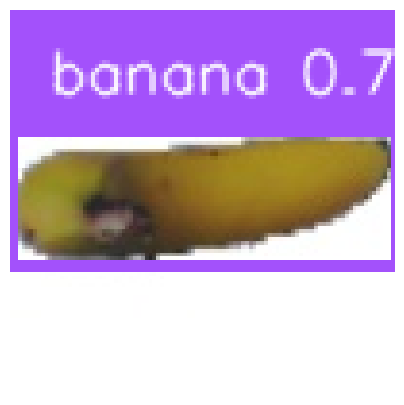

Etiquetas generadas para r_301_100.jpg


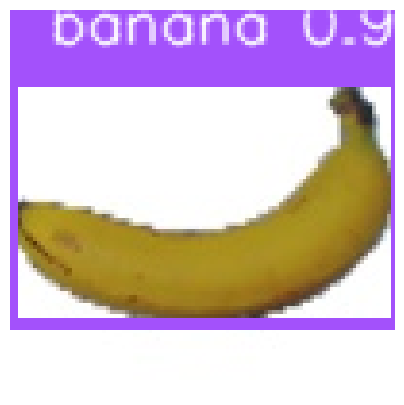

Etiquetas generadas para 227_100.jpg


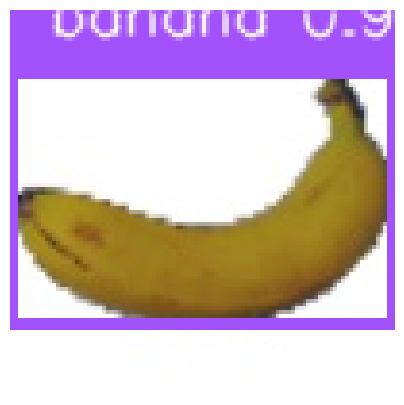

Etiquetas generadas para 212_100.jpg


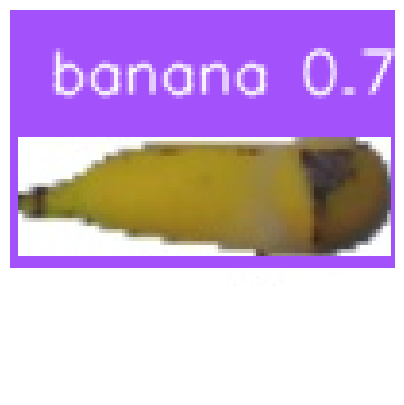

Etiquetas generadas para r_84_100.jpg


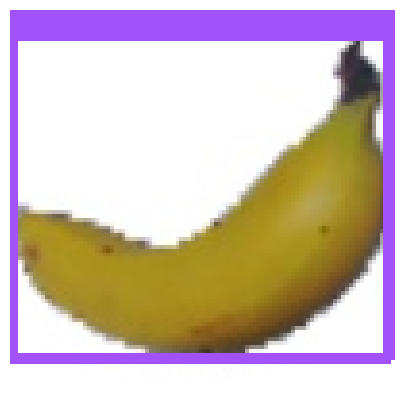

Etiquetas generadas para 273_100.jpg


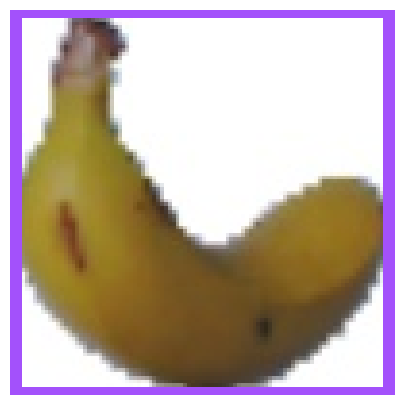

Etiquetas generadas para 50_100.jpg


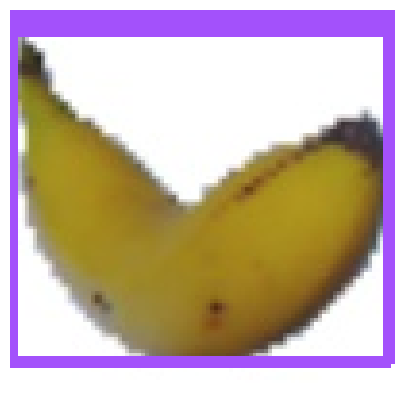

Etiquetas generadas para 143_100.jpg


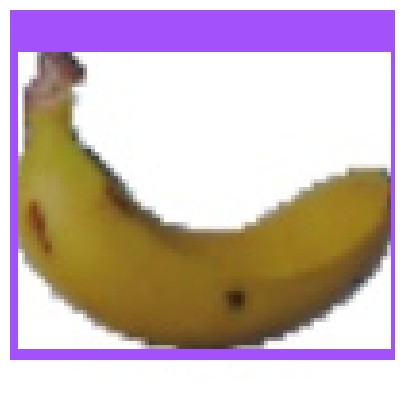

Etiquetas generadas para 63_100.jpg


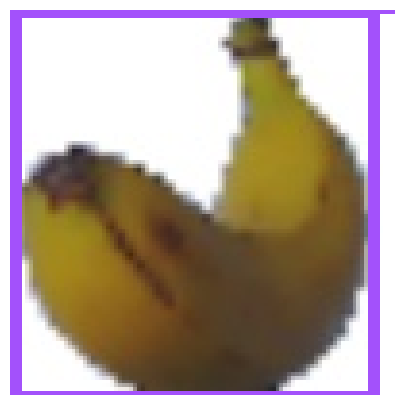

Etiquetas generadas para 182_100.jpg


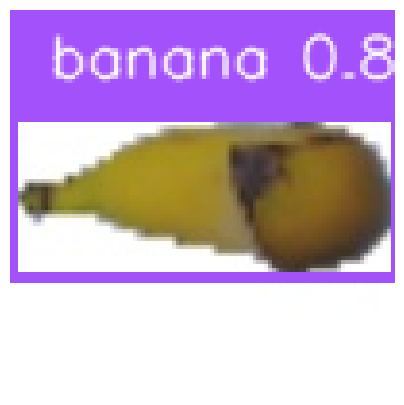

Etiquetas generadas para r_97_100.jpg


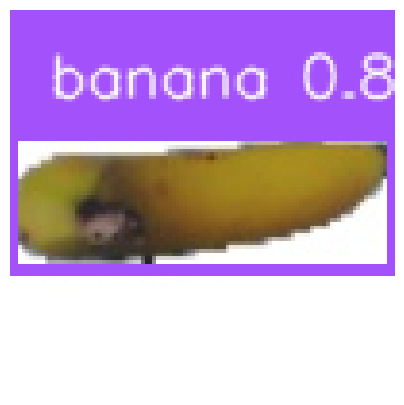

Etiquetas generadas para r_302_100.jpg


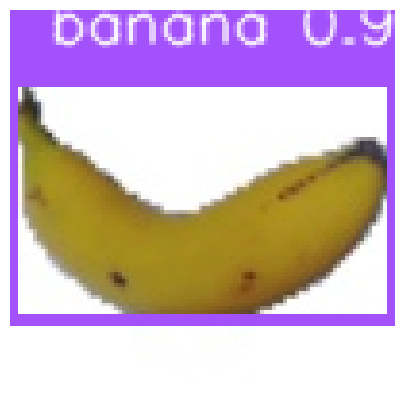

Etiquetas generadas para 132_100.jpg


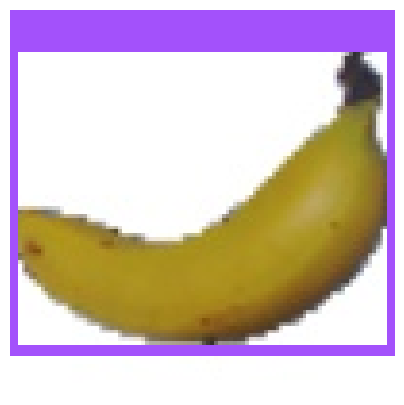

Etiquetas generadas para 268_100.jpg


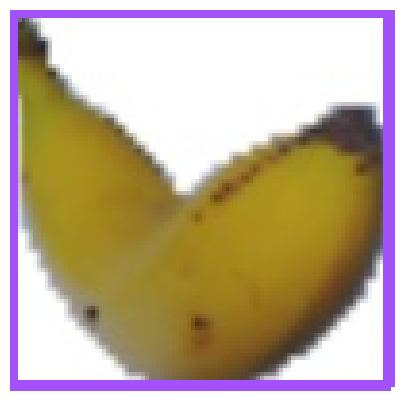

Etiquetas generadas para 147_100.jpg


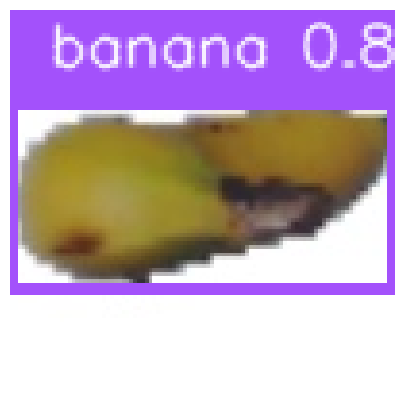

Etiquetas generadas para r_282_100.jpg


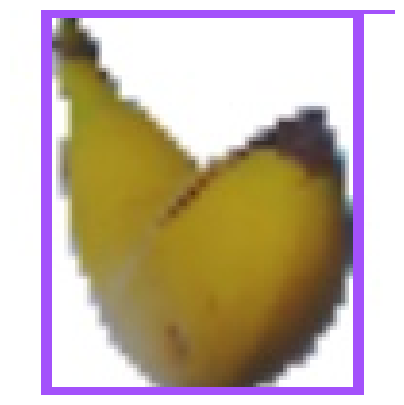

Etiquetas generadas para 154_100.jpg


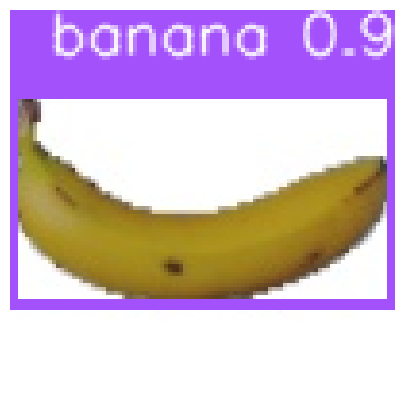

Etiquetas generadas para 89_100.jpg


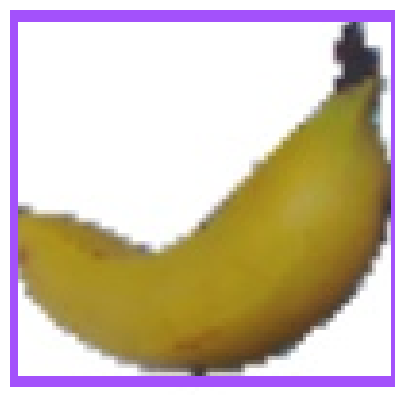

Etiquetas generadas para 276_100.jpg


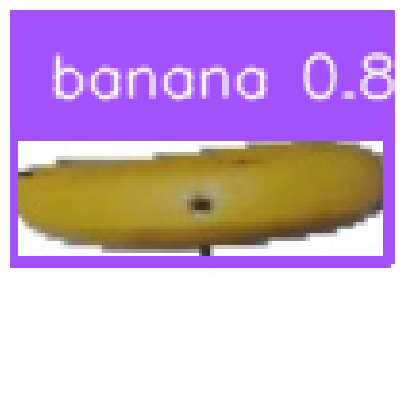

Etiquetas generadas para r_194_100.jpg


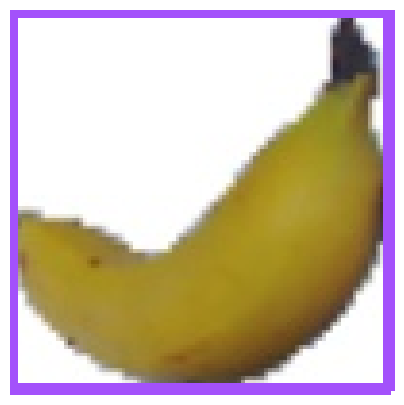

Etiquetas generadas para 280_100.jpg


In [5]:
def save_yolo_format(output_path, img_name, boxes, labels):
    """
    Guarda las etiquetas en formato YOLO.
    """
    label_file = os.path.join(output_path, f"{os.path.splitext(img_name)[0]}.txt")
    with open(label_file, "w") as f:
        for box, label in zip(boxes, labels):
            x_center = (box[0] + box[2]) / 2
            y_center = (box[1] + box[3]) / 2
            width = box[2] - box[0]
            height = box[3] - box[1]
            f.write(f"{label} {x_center} {y_center} {width} {height}\n")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar el modelo de Grounding DINO
model = load_model(
    "/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py",
    "weights/groundingdino_swint_ogc.pth"
).to(device)

# Rutas ajustadas
input_images_path = "/content/fruits-360/fruits-360_dataset_100x100/fruits-360/Training/Banana 1"
output_labels_path = "/content/labels"
os.makedirs(output_labels_path, exist_ok=True)

# Texto de entrada para detección
text_prompt = "banana"  # Cambia según el objeto que quieras detectar

# Generar etiquetas para todas las imágenes en subcarpetas
for root, _, files in os.walk(input_images_path):
    for img_name in files:
        if img_name.endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(root, img_name)
            try:
                # Cargar la imagen
                image_source, image = load_image(img_path)

                # Generar predicciones
                boxes, logits, phrases = predict(
                    model=model,
                    image=image,
                    caption=text_prompt,  # Texto de entrada
                    box_threshold=0.3,    # Umbral para detección de cajas
                    text_threshold=0.25,   # Umbral para texto
                    device='cuda'
                )

                annotated_frame = annotate(
                image_source=image_source,
                boxes=boxes,
                logits=logits,
                phrases=phrases)

                sv.plot_image(annotated_frame,(5,5))

                # Guardar etiquetas en formato YOLO
                save_yolo_format(output_labels_path, img_name, boxes, phrases)
                print(f"Etiquetas generadas para {img_name}")
            except Exception as e:
                print(f"Error procesando {img_path}: {e}")


3. **Obtención de imágenes de segmentación:**
   - Emplee el modelo **Segment Anything Model (SAM)** para generar máscaras de segmentación que distingan claramente entre el **objeto** y el fondo.



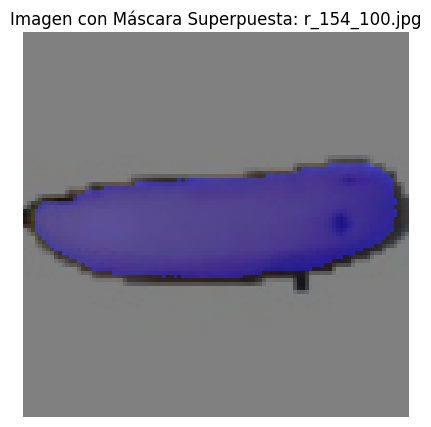

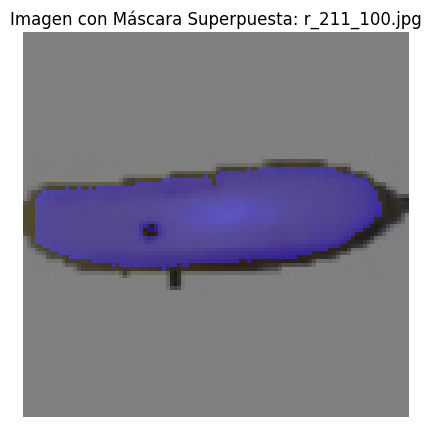

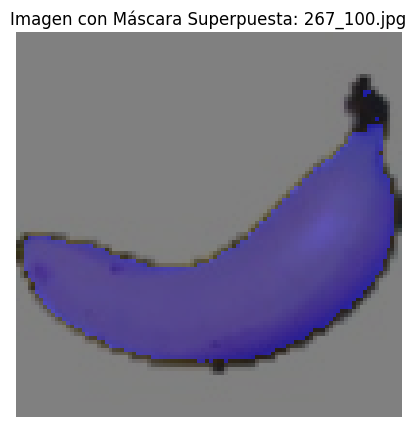

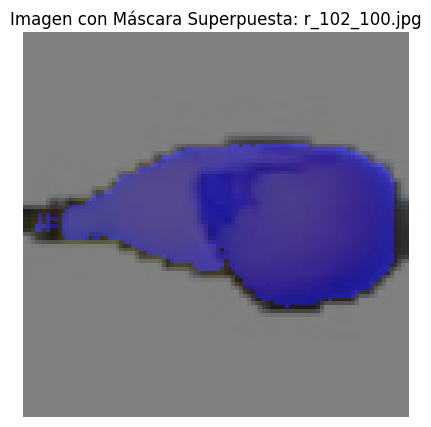

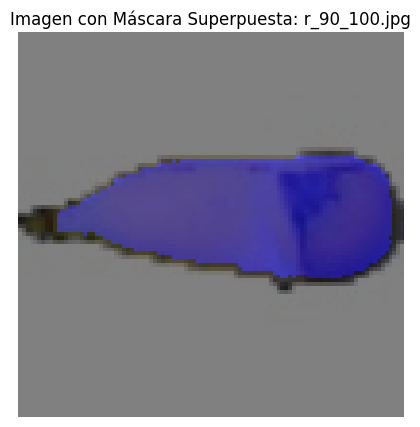

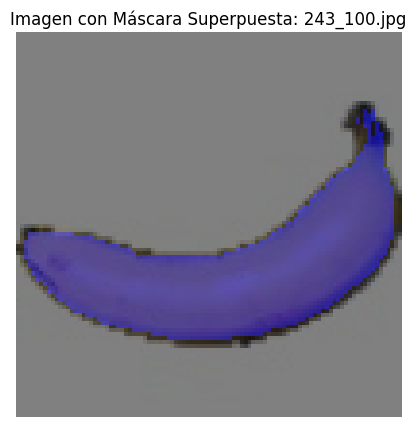

KeyboardInterrupt: 

In [6]:
import os
import cv2
from segment_anything import SamPredictor, sam_model_registry
import matplotlib.pyplot as plt

# Configurar SAM y cargar el checkpoint
sam_checkpoint = "/content/checkpoints/sam_vit_b_01ec64.pth"
sam = sam_model_registry["vit_b"](checkpoint=sam_checkpoint)
predictor = SamPredictor(sam)

# Carpetas de entrada, salida y etiquetas YOLO
input_images_path = "/content/fruits-360/fruits-360_dataset_100x100/fruits-360/Training/Banana 1"
output_masks_path = "/content/masks"
os.makedirs(output_masks_path, exist_ok=True)

# Generar máscaras para cada imagen
for img_name in os.listdir(input_images_path):
    if img_name.endswith(('.jpg', '.jpeg', '.png')):
        img_path = os.path.join(input_images_path, img_name)
        try:
            # Leer la imagen
            image = cv2.imread(img_path)
            predictor.set_image(image)

            # Generar máscaras
            masks, _, _ = predictor.predict(
                point_coords=None,  # Coordenadas iniciales (None para detectar todo)
                point_labels=None,  # Etiquetas asociadas a los puntos
                box=None  # Cuadro delimitador inicial (None para detectar todo)
            )

            # Ajustar el tamaño de la máscara para que coincida con la imagen
            mask = masks[0].astype("uint8")
            resized_mask = cv2.resize(mask, (image.shape[1], image.shape[0]))

            # Crear una imagen de color llamativo para la máscara
            colored_mask = cv2.merge([resized_mask * 255, resized_mask * 0, resized_mask * 0])

            # Superponer la máscara sobre la imagen de forma traslúcida
            overlay = cv2.addWeighted(image, 0.5, colored_mask, 0.5, 0)

            # Guardar la imagen con la máscara
            mask_output_path = os.path.join(output_masks_path, f"mask_{img_name}")
            cv2.imwrite(mask_output_path, overlay)

            # Mostrar la imagen con la máscara superpuesta
            plt.figure(figsize=(10, 5))
            plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
            plt.title(f"Imagen con Máscara Superpuesta: {img_name}")
            plt.axis("off")
            plt.show()

        except Exception as e:
            print(f"Error procesando {img_name}: {e}")

## Resultado Esperado

- El resultdo final debe ser una archivo .ipynb que se pueda ejecutar en Colab.
- Luego de ejecutar el código deben haber tres subcarpetas en Colab.
  - **images**: Imagenes del dataset, todas del mismo tamaño y sin perder el aspecto de la imagen.
  - **detection**: Etiquetas de cada una de las imágenes en formato YOLO.
  - **segmentation**: Imágenes con las respectiva máscaras.
